In [1]:
# L2 only loss landscape
# TODO -
# Repeat with actual HDX data
import os
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from jaxent.src.utils.datasplitter import apply_sparse_mapping
from tqdm.auto import tqdm
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from MDAnalysis import Universe
import jax
from jaxent.src.config.base import FeaturiserSettings, OptimiserSettings
from jaxent.src.datatypes import (
    Dataset,
    Experiment_Ensemble,
    Experimental_Dataset,
    HDX_peptide,
    HDX_protection_factor,
    Simulation,
    Simulation_Parameters,
)
from jaxent.src.featurise import run_featurise
from jaxent.src.forwardmodels.functions import find_common_residues
from jaxent.src.forwardmodels.models import (
    BV_input_features,
    BV_model,
    BV_model_Config,
    linear_BV_model,
    linear_BV_model_Config,
)
from jaxent.src.lossfn.base import (
    hdx_pf_l2_loss,
    hdx_pf_mae_loss,
    hdx_uptake_l2_loss,
    hdx_uptake_monotonicity_loss,
    mask_L0_loss,
    max_entropy_loss,
)
from jaxent.src.optimise import OptaxOptimizer, Optimisable_Parameters, run_optimise
from jaxent.src.utils.datasplitter import DataSplitter, create_sparse_map


/Users/alexi/JAX-ENT/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:

def plot_split_visualization(train_data, val_data, exp_data):
    """
    Create a visualization of the train/validation split along residue indices.
    """
    plt.figure(figsize=(12, 6))

    # Get residue indices for each dataset
    train_residues = [d.top.residue_start for d in train_data]
    val_residues = [d.top.residue_start for d in val_data]
    all_residues = [d.top.residue_start for d in exp_data]

    # Create boolean masks for plotting
    residue_range = np.arange(min(all_residues), max(all_residues) + 1)
    train_mask = np.isin(residue_range, train_residues)
    val_mask = np.isin(residue_range, val_residues)

    # Plot residue coverage
    plt.scatter(
        residue_range[train_mask],
        np.ones_like(residue_range[train_mask]),
        label="Training",
        alpha=0.6,
        s=100,
    )
    plt.scatter(
        residue_range[val_mask],
        np.zeros_like(residue_range[val_mask]),
        label="Validation",
        alpha=0.6,
        s=100,
    )

    plt.yticks([0, 1], ["Validation", "Training"])
    plt.xlabel("Residue Index")
    plt.title("Train/Validation Split by Residue")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    return plt.gcf()


def plot_total_losses(opt_history):
    """
    Plot training and validation loss components over optimization steps.
    """
    steps = range(len(opt_history.states))
    train_losses = [state.losses.total_train_loss for state in opt_history.states]
    val_losses = [state.losses.total_val_loss for state in opt_history.states]

    plt.figure(figsize=(10, 6))
    plt.plot(steps, train_losses, label="Training Loss", marker="o", markersize=3)
    plt.plot(steps, val_losses, label="Validation Loss", marker="o", markersize=3)

    plt.xlabel("Optimization Step")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss Over Time")
    plt.legend()
    plt.grid(True, alpha=0.3)
    # plt.yscale("log")
    plt.tight_layout()

    return plt.gcf()


def plot_loss_components(opt_history):
    """
    Plot training and validation loss components over optimization steps,
    showing both total loss and individual components on separate subplots.
    """
    steps = range(len(opt_history.states))

    # Get individual loss components
    train_components = np.array([state.losses.train_losses for state in opt_history.states])
    val_components = np.array([state.losses.val_losses for state in opt_history.states])
    scaled_train = np.array([state.losses.scaled_train_losses for state in opt_history.states])
    scaled_val = np.array([state.losses.scaled_val_losses for state in opt_history.states])
    total_train = np.array([state.losses.total_train_loss for state in opt_history.states])
    total_val = np.array([state.losses.total_val_loss for state in opt_history.states])

    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

    # Plot training losses
    colors = plt.cm.Set2(np.linspace(0, 1, train_components.shape[1]))

    ax1.set_title("Training Loss Components")
    # Plot individual components
    for i, color in enumerate(colors):
        ax1.plot(
            steps,
            train_components[:, i],
            label=f"Component {i + 1}",
            color=color,
            linestyle="--",
            alpha=0.7,
        )
        ax1.plot(
            steps, scaled_train[:, i], label=f"Scaled Component {i + 1}", color=color, alpha=1.0
        )
    # Plot total loss
    ax1.plot(steps, total_train, label="Total Loss", color="black", linewidth=2)
    # ax1.set_yscale("log")
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    ax1.set_xlabel("Optimization Step")
    ax1.set_ylabel("Loss")

    # Plot validation losses
    ax2.set_title("Validation Loss Components")
    # Plot individual components
    for i, color in enumerate(colors):
        ax2.plot(
            steps,
            val_components[:, i],
            label=f"Component {i + 1}",
            color=color,
            linestyle="--",
            alpha=0.7,
        )
        ax2.plot(steps, scaled_val[:, i], label=f"Scaled Component {i + 1}", color=color, alpha=1.0)
    # Plot total loss
    ax2.plot(steps, total_val, label="Total Loss", color="black", linewidth=2)
    # ax2.set_yscale("log")
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    ax2.set_xlabel("Optimization Step")
    ax2.set_ylabel("Loss")

    plt.tight_layout()
    return fig


def plot_frame_weights_heatmap(opt_history):
    """
    Create a heatmap showing the evolution of frame weights during optimization.
    """
    # Extract frame weights from each state
    frame_weights = [state.params.frame_weights for state in opt_history.states]
    frame_mask = [state.params.frame_mask for state in opt_history.states]

    # Apply frame mask
    frame_weights = [weights * mask for weights, mask in zip(frame_weights, frame_mask)]

    # Convert to 2D array (steps × frames)
    weights_array = jnp.vstack(frame_weights)

    plt.figure(figsize=(12, 6))
    cmap = sns.color_palette("viridis", as_cmap=True)
    cmap.set_under("black")  # Set color for values under the minimum (i.e., zero)

    sns.heatmap(
        weights_array,
        cmap=cmap,
        xticklabels=100,
        yticklabels=50,
        cbar_kws={"label": "Frame Weight"},
        vmin=1e-9,  # Ensure black is shown for 0 by setting a minimum value slightly above zero
    )

    plt.xlabel("Frame Index")
    plt.ylabel("Optimization Step")
    plt.title("Frame Weights Evolution During Optimization")
    plt.tight_layout()

    return plt.gcf()


# Add these visualizations to the test function
def visualize_optimization_results(train_data, val_data, exp_data, opt_simulation):
    """
    Create and display all visualization plots.
    """
    simulation, history = opt_simulation

    # Create all plots
    split_fig = plot_split_visualization(train_data, val_data, exp_data)
    total_loss_fig = plot_total_losses(history)
    loss_fig = plot_loss_components(history)
    weights_fig = plot_frame_weights_heatmap(history)

    # Display plots
    plt.show()


In [3]:
bv_config = BV_model_Config()
opt_settings = OptimiserSettings(name="test", n_steps=500, learning_rate=1e-3)

featuriser_settings = FeaturiserSettings(name="BV", batch_size=None)

topology_path = "/Users/alexi/JAX-ENT/tests/inst/clean/HOIP/train_HOIP_max_plddt_1/HOIP_apo697_1_af_sample_127_10000_protonated_max_plddt_1969.pdb"
topology_path = "/Users/alexi/JAX-ENT/tests/inst/clean/BPTI/BPTI_overall_combined_stripped.pdb"
# trajectory_path = "/Users/alexi/JAX-ENT/tests/inst/clean/BPTI/BPTI_sampled_500.xtc"
topology_path = "/Users/alexi/JAX-ENT/tests/inst/clean/BPTI/BPTI_overall_combined_stripped.pdb"
trajectory_path = "/Users/alexi/JAX-ENT/tests/inst/clean/BPTI/BPTI_sampled_500.xtc"
test_universe = Universe(topology_path, trajectory_path)

universes = [test_universe]

models = [BV_model(bv_config)]

ensemble = Experiment_Ensemble(universes, models)

features, feature_topology = run_featurise(ensemble, featuriser_settings)
top_segments = find_common_residues(
    universes, ignore_mda_selection="(resname PRO or resid 1) "
)[0]

Initialising <jaxent.src.forwardmodels.models.BV_model object at 0x153a94c20>


In [4]:
# n_seeds = 5

# seeds = [42+i for i in range(n_seeds)] # number of dataset seeds

# n_replicates = 3 # number of replicates for each seed as we randomly initialise the frame weights



In [46]:

# Function to create datasets with mappings for each seed
def create_datasets_with_mappings(ensemble, features, feature_topology, exp_data, seeds):
    """
    Creates datasets with train/val splits for multiple seeds.
    
    Parameters:
    -----------
    ensemble : list
        List of universe objects
    features : list
        List of feature objects
    feature_topology : list
        List of feature topology objects
    exp_data : list
        List of experimental data
    seeds : list
        List of random seeds
        
    Returns:
    --------
    datasets : list
        List of dataset objects for each seed
    """
    datasets = []
    
    for seed in seeds:
        # Create a dataset object
        dataset = Experimental_Dataset(data=exp_data)
        
        # Create a splitter with the current seed
        splitter = DataSplitter(dataset, random_seed=seed, ensemble=ensemble)
        
        # Generate train/val split
        train_data, val_data = splitter.random_split()
        
        # Create sparse maps
        train_sparse_map = create_sparse_map(features[0], feature_topology[0], train_data)
        val_sparse_map = create_sparse_map(features[0], feature_topology[0], val_data)
        test_sparse_map = create_sparse_map(features[0], feature_topology[0], exp_data)
        
        # Add train, val, and test sets to the dataset
        dataset.train = Dataset(
            data=train_data,
            y_true=jnp.array([data.extract_features() for data in train_data]),
            residue_feature_ouput_mapping=train_sparse_map,
        )
        
        dataset.val = Dataset(
            data=val_data,
            y_true=jnp.array([data.extract_features() for data in val_data]),
            residue_feature_ouput_mapping=val_sparse_map,
        )
        
        dataset.test = Dataset(
            data=exp_data,
            y_true=jnp.array([data.extract_features() for data in exp_data]),
            residue_feature_ouput_mapping=test_sparse_map,
        )
        
        datasets.append(dataset)
    
    return datasets

# Function to run optimization for each dataset seed and replicate
def run_optimization_replicates(simulation, datasets, models, opt_settings, n_replicates):
    """
    Runs optimization for each dataset and replicate with randomized frame weights.
    
    Parameters:
    -----------
    simulation : Simulation
        Simulation object
    datasets : list
        List of dataset objects
    models : list
        List of forward model objects
    opt_settings : OptimiserSettings
        Optimization settings
    n_replicates : int
        Number of replicates per dataset
        
    Returns:
    --------
    results : dict
        Dictionary of optimization results for each dataset and replicate
    """
    results = {}
    rng_key = jax.random.PRNGKey(0)

    
    for i, dataset in enumerate(datasets):
        seed_results = []
        
        for j in range(n_replicates):
            try:
                # Generate a new random key for each replicate
                rng_key, subkey = jax.random.split(rng_key)
                
                # Get the trajectory length from simulation
                trajectory_length = simulation.input_features[0].features_shape[2]
                
                # Randomize frame weights
                random_weights = jax.random.uniform(subkey, shape=(trajectory_length,))
                random_weights = simulation.params.frame_weights + random_weights
                random_weights = random_weights / jnp.sum(random_weights)  # Normalize
                
                # Create new parameters with random weights, preserving all other values
                new_params = Simulation_Parameters(
                    frame_weights=random_weights,
                    frame_mask=simulation.params.frame_mask,
                    model_parameters=simulation.params.model_parameters,
                    forward_model_weights=simulation.params.forward_model_weights,
                    forward_model_scaling=simulation.params.forward_model_scaling,
                    normalise_loss_functions=simulation.params.normalise_loss_functions
                )
                
                # Create a new simulation with the updated parameters
                new_simulation = Simulation(
                    forward_models=simulation.forward_models,
                    input_features=simulation.input_features,
                    params=new_params
                )
                new_simulation.initialise()
                
                optimiser = OptaxOptimizer(parameter_masks={Optimisable_Parameters.frame_weights})
                # Run optimization
                print(f"Running optimization for Dataset Seed {i+1}/{len(datasets)}, Replicate {j+1}/{n_replicates}")
                opt_result = run_optimise(
                    new_simulation,
                    optimizer=optimiser,
                    data_to_fit=(dataset,),
                    config=opt_settings,
                    forward_models=models,
                    indexes=[0],
                    loss_functions=[hdx_pf_l2_loss],
                )
                
                # Store the result
                seed_results.append(opt_result)
                
                # Visualize this optimization run
                print(f"Visualizing results for Dataset Seed {i+1}/{len(datasets)}, Replicate {j+1}/{n_replicates}")
                visualize_optimization_results(
                    dataset.train.data, 
                    dataset.val.data, 
                    dataset.test.data, 
                    opt_result
                )
            except Exception as e:
                print(f"Error in Dataset Seed {i+1}, Replicate {j+1}: {e}")
                # Add a placeholder for failed runs to maintain indexing
                seed_results.append(None)
        
        results[f"seed_{i}"] = seed_results
    
    return results
# Enhanced 2D PCA visualization with gradient coloring
def visualize_pca_trajectories(optimization_results, n_seeds, n_replicates):
    """
    Performs PCA on frame weights and visualizes trajectories with gradient coloring.
    
    Parameters:
    -----------
    optimization_results : dict
        Dictionary of optimization results
    n_seeds : int
        Number of seeds
    n_replicates : int
        Number of replicates per seed
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        PCA visualization figure with enhanced coloring
    """
    # Collect all frame weights from all optimization runs
    all_frame_weights = []
    trajectories_info = []  # To keep track of each trajectory's info
    
    for seed_idx in range(n_seeds):
        seed_key = f"seed_{seed_idx}"
        
        for rep_idx in range(n_replicates):
            # Skip if the result is None (failed run)
            if optimization_results[seed_key][rep_idx] is None:
                print(f"Skipping PCA for Seed {seed_idx+1}, Replicate {rep_idx+1} (failed run)")
                continue
                
            # Get the optimization history for this seed and replicate
            _, history = optimization_results[seed_key][rep_idx]
            
            # Get the number of steps in this optimization
            n_steps = len(history.states)
            
            # Add trajectory info
            trajectories_info.append({
                'seed_idx': seed_idx,
                'rep_idx': rep_idx,
                'start_idx': len(all_frame_weights),
                'n_steps': n_steps
            })
            
            # Extract frame weights from each optimization step
            for state in history.states:
                # Apply mask to frame weights
                masked_weights = np.array(state.params.frame_weights * state.params.frame_mask)
                all_frame_weights.append(masked_weights)
    
    # Convert to numpy array for PCA
    all_frame_weights = np.array(all_frame_weights)
    
    # Perform PCA
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(all_frame_weights)
    
    # Create a figure
    plt.figure(figsize=(12, 10))
    
    # Define base colors and markers
    base_colors = plt.cm.tab10(np.linspace(0, 1, n_seeds))
    markers = ['o', 's', '^', 'D', 'v']
    
    # Plot trajectories with gradient coloring
    for traj_info in trajectories_info:
        seed_idx = traj_info['seed_idx']
        rep_idx = traj_info['rep_idx']
        start_idx = traj_info['start_idx']
        n_steps = traj_info['n_steps']
        
        try:
            # Extract the PCA trajectory for this optimization
            trajectory = pca_result[start_idx:start_idx + n_steps]
            
            # Get base color for this seed
            base_color = base_colors[seed_idx]
            
            # Convert RGB to HSV for better control over lightness
            base_color_hsv = plt.matplotlib.colors.rgb_to_hsv(base_color[:3])
            
            # Plot trajectory with gradient coloring
            for i in range(n_steps - 1):
                # Calculate color for this segment (from light to dark)
                # Adjust value (brightness) from 0.9 (lighter) to 0.3 (darker)
                progress = i / (n_steps - 1)
                current_hsv = base_color_hsv.copy()
                current_hsv[2] = 0.9 - progress * 0.6  # Adjust brightness from 0.9 to 0.3
                
                # Convert back to RGB
                current_color = plt.matplotlib.colors.hsv_to_rgb(current_hsv)
                
                # Plot segment as a line
                plt.plot(
                    trajectory[i:i+2, 0],
                    trajectory[i:i+2, 1],
                    color=current_color,
                    linewidth=2,
                    alpha=0.8
                )
                
                # Add markers at points
                if i % max(1, n_steps // 10) == 0:  # Add markers at roughly 10 points along trajectory
                    plt.scatter(
                        trajectory[i, 0],
                        trajectory[i, 1],
                        color=current_color,
                        marker=markers[rep_idx % len(markers)],
                        s=50,
                        alpha=0.8,
                        edgecolor='none'
                    )
            
            # Highlight start and end points
            plt.scatter(
                trajectory[0, 0], 
                trajectory[0, 1],
                color=plt.matplotlib.colors.hsv_to_rgb([base_color_hsv[0], base_color_hsv[1], 0.9]),
                marker=markers[rep_idx % len(markers)],
                s=100,
                edgecolor='black',
                linewidth=1.5,
                zorder=10
            )
            
            plt.scatter(
                trajectory[-1, 0], 
                trajectory[-1, 1],
                color=plt.matplotlib.colors.hsv_to_rgb([base_color_hsv[0], base_color_hsv[1], 0.3]),
                marker=markers[rep_idx % len(markers)],
                s=100,
                edgecolor='white',
                linewidth=1.5,
                zorder=10
            )
            
        except Exception as e:
            print(f"Error plotting trajectory for Seed {seed_idx+1}, Rep {rep_idx+1}: {e}")
    
    # Add labels and legend
    plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
    plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
    plt.title("PCA of Frame Weights Trajectories")
    
    # Create a legend for the seeds with gradient examples
    seed_handles = []
    for i in range(n_seeds):
        # Create a gradient line for the legend
        gradient = np.linspace(0, 1, 100)
        gradient_colors = np.zeros((100, 4))
        
        # Get base color and convert to HSV
        base_color_hsv = plt.matplotlib.colors.rgb_to_hsv(base_colors[i][:3])
        
        # Create gradient colors
        for j, g in enumerate(gradient):
            current_hsv = base_color_hsv.copy()
            current_hsv[2] = 0.9 - g * 0.6  # Adjust brightness from 0.9 to 0.3
            gradient_colors[j, :3] = plt.matplotlib.colors.hsv_to_rgb(current_hsv)
            gradient_colors[j, 3] = 1.0  # Full alpha
        
        # Create a custom line collection for the gradient
        x = np.linspace(0, 1, 100)
        points = np.array([x, np.zeros(100)]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        lc = plt.matplotlib.collections.LineCollection(segments, colors=gradient_colors, linewidth=4)
        
        # Add to handles
        seed_handles.append((lc, f"Seed {i+1}"))
    
    # Create a legend for the replicates
    rep_handles = [plt.Line2D([0], [0], color='gray', marker=markers[i % len(markers)], 
                             linestyle='None', markersize=10, label=f"Replicate {i+1}") 
                  for i in range(n_replicates)]
                  
    # Add labels to explain the gradient
    explanation_handles = [
        plt.Line2D([0], [0], marker='o', color='none', markerfacecolor='lightgray', 
                  markersize=10, markeredgecolor='black', label="Start of optimization"),
        plt.Line2D([0], [0], marker='o', color='none', markerfacecolor='darkgray', 
                  markersize=10, markeredgecolor='white', label="End of optimization")
    ]
    
    # Create the legend for seed gradients
    legend1 = plt.legend(
        [handle for handle, _ in seed_handles],
        [label for _, label in seed_handles],
        loc='upper left',
        title="Seeds (Light → Dark = Start → End)"
    )
    plt.gca().add_artist(legend1)
    
    # Create the legend for replicates and explanation
    plt.legend(
        rep_handles + explanation_handles, 
        [h.get_label() for h in rep_handles + explanation_handles],
        loc='upper right',
        title="Replicates & Progression"
    )
    
    plt.grid(alpha=0.3)
    plt.tight_layout()
    
    return plt.gcf()

# Enhanced 2D t-SNE visualization with gradient coloring
def visualize_tsne_trajectories(optimization_results, n_seeds, n_replicates, perplexity=30, n_iter=1000):
    """
    Performs t-SNE on frame weights and visualizes trajectories with gradient coloring.
    
    Parameters:
    -----------
    optimization_results : dict
        Dictionary of optimization results
    n_seeds : int
        Number of seeds
    n_replicates : int
        Number of replicates per seed
    perplexity : int, optional
        Perplexity parameter for t-SNE (default=30)
    n_iter : int, optional
        Number of iterations for t-SNE (default=1000)
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        t-SNE visualization figure with enhanced coloring
    """
    # Collect all frame weights from all optimization runs
    all_frame_weights = []
    trajectories_info = []  # To keep track of each trajectory's info
    
    for seed_idx in range(n_seeds):
        seed_key = f"seed_{seed_idx}"
        
        for rep_idx in range(n_replicates):
            # Skip if the result is None (failed run)
            if optimization_results[seed_key][rep_idx] is None:
                print(f"Skipping t-SNE for Seed {seed_idx+1}, Replicate {rep_idx+1} (failed run)")
                continue
                
            # Get the optimization history for this seed and replicate
            _, history = optimization_results[seed_key][rep_idx]
            
            # Get the number of steps in this optimization
            n_steps = len(history.states)
            
            # Add trajectory info
            trajectories_info.append({
                'seed_idx': seed_idx,
                'rep_idx': rep_idx,
                'start_idx': len(all_frame_weights),
                'n_steps': n_steps
            })
            
            # Extract frame weights from each optimization step
            for state in history.states:
                # Apply mask to frame weights
                masked_weights = np.array(state.params.frame_weights * state.params.frame_mask)
                all_frame_weights.append(masked_weights)
    
    # Convert to numpy array for t-SNE
    all_frame_weights = np.array(all_frame_weights)
    
    # Perform t-SNE
    print(f"Performing t-SNE with perplexity={perplexity}, n_iter={n_iter}...")
    tsne = TSNE(n_components=2, perplexity=perplexity, n_iter=n_iter, random_state=42)
    tsne_result = tsne.fit_transform(all_frame_weights)
    
    # Create a figure
    plt.figure(figsize=(12, 10))
    
    # Define base colors and markers
    base_colors = plt.cm.tab10(np.linspace(0, 1, n_seeds))
    markers = ['o', 's', '^', 'D', 'v']
    
    # Plot trajectories with gradient coloring
    for traj_info in trajectories_info:
        seed_idx = traj_info['seed_idx']
        rep_idx = traj_info['rep_idx']
        start_idx = traj_info['start_idx']
        n_steps = traj_info['n_steps']
        
        try:
            # Extract the t-SNE trajectory for this optimization
            trajectory = tsne_result[start_idx:start_idx + n_steps]
            
            # Get base color for this seed
            base_color = base_colors[seed_idx]
            
            # Convert RGB to HSV for better control over lightness
            base_color_hsv = plt.matplotlib.colors.rgb_to_hsv(base_color[:3])
            
            # Plot trajectory with gradient coloring
            for i in range(n_steps - 1):
                # Calculate color for this segment (from light to dark)
                # Adjust value (brightness) from 0.9 (lighter) to 0.3 (darker)
                progress = i / (n_steps - 1)
                current_hsv = base_color_hsv.copy()
                current_hsv[2] = 0.9 - progress * 0.6  # Adjust brightness from 0.9 to 0.3
                
                # Convert back to RGB
                current_color = plt.matplotlib.colors.hsv_to_rgb(current_hsv)
                
                # Plot segment as a line
                plt.plot(
                    trajectory[i:i+2, 0],
                    trajectory[i:i+2, 1],
                    color=current_color,
                    linewidth=2,
                    alpha=0.8
                )
                
                # Add markers at points
                if i % max(1, n_steps // 10) == 0:  # Add markers at roughly 10 points along trajectory
                    plt.scatter(
                        trajectory[i, 0],
                        trajectory[i, 1],
                        color=current_color,
                        marker=markers[rep_idx % len(markers)],
                        s=50,
                        alpha=0.8,
                        edgecolor='none'
                    )
            
            # Highlight start and end points
            plt.scatter(
                trajectory[0, 0], 
                trajectory[0, 1],
                color=plt.matplotlib.colors.hsv_to_rgb([base_color_hsv[0], base_color_hsv[1], 0.9]),
                marker=markers[rep_idx % len(markers)],
                s=100,
                edgecolor='black',
                linewidth=1.5,
                zorder=10
            )
            
            plt.scatter(
                trajectory[-1, 0], 
                trajectory[-1, 1],
                color=plt.matplotlib.colors.hsv_to_rgb([base_color_hsv[0], base_color_hsv[1], 0.3]),
                marker=markers[rep_idx % len(markers)],
                s=100,
                edgecolor='white',
                linewidth=1.5,
                zorder=10
            )
            
        except Exception as e:
            print(f"Error plotting trajectory for Seed {seed_idx+1}, Rep {rep_idx+1}: {e}")
    
    # Add labels and legend
    plt.xlabel("t-SNE Component 1")
    plt.ylabel("t-SNE Component 2")
    plt.title("t-SNE of Frame Weights Trajectories")
    
    # Create a legend for the seeds with gradient examples
    seed_handles = []
    for i in range(n_seeds):
        # Create a gradient line for the legend
        gradient = np.linspace(0, 1, 100)
        gradient_colors = np.zeros((100, 4))
        
        # Get base color and convert to HSV
        base_color_hsv = plt.matplotlib.colors.rgb_to_hsv(base_colors[i][:3])
        
        # Create gradient colors
        for j, g in enumerate(gradient):
            current_hsv = base_color_hsv.copy()
            current_hsv[2] = 0.9 - g * 0.6  # Adjust brightness from 0.9 to 0.3
            gradient_colors[j, :3] = plt.matplotlib.colors.hsv_to_rgb(current_hsv)
            gradient_colors[j, 3] = 1.0  # Full alpha
        
        # Create a custom line collection for the gradient
        x = np.linspace(0, 1, 100)
        points = np.array([x, np.zeros(100)]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        lc = plt.matplotlib.collections.LineCollection(segments, colors=gradient_colors, linewidth=4)
        
        # Add to handles
        seed_handles.append((lc, f"Seed {i+1}"))
    
    # Create a legend for the replicates
    rep_handles = [plt.Line2D([0], [0], color='gray', marker=markers[i % len(markers)], 
                             linestyle='None', markersize=10, label=f"Replicate {i+1}") 
                  for i in range(n_replicates)]
                  
    # Add labels to explain the gradient
    explanation_handles = [
        plt.Line2D([0], [0], marker='o', color='none', markerfacecolor='lightgray', 
                  markersize=10, markeredgecolor='black', label="Start of optimization"),
        plt.Line2D([0], [0], marker='o', color='none', markerfacecolor='darkgray', 
                  markersize=10, markeredgecolor='white', label="End of optimization")
    ]
    
    # Create the legend for seed gradients
    legend1 = plt.legend(
        [handle for handle, _ in seed_handles],
        [label for _, label in seed_handles],
        loc='upper left',
        title="Seeds (Light → Dark = Start → End)"
    )
    plt.gca().add_artist(legend1)
    
    # Create the legend for replicates and explanation
    plt.legend(
        rep_handles + explanation_handles, 
        [h.get_label() for h in rep_handles + explanation_handles],
        loc='upper right',
        title="Replicates & Progression"
    )
    
    plt.grid(alpha=0.3)
    plt.tight_layout()
    
    return plt.gcf()

# Save visualization functions
def save_visualization(fig, filename):
    """
    Saves a matplotlib figure to disk.
    """
    fig.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Visualization saved to {filename}")
# Save the PCA visualization
def save_pca_visualization(fig, filename="pca_trajectories.png"):
    """
    Saves the PCA visualization to disk.
    """
    fig.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"PCA visualization saved to {filename}")

# Save the t-SNE visualization
def save_tsne_visualization(fig, filename="tsne_trajectories.png"):
    """
    Saves the t-SNE visualization to disk.
    """
    fig.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"t-SNE visualization saved to {filename}")


In [6]:
def compute_test_losses(optimization_results, datasets, prediction_index=0):
    """
    Compute residue-average test losses for all optimization states.
    
    Parameters:
    -----------
    optimization_results : dict
        Dictionary of optimization results from run_optimization_replicates
    datasets : list
        List of dataset objects
    prediction_index : int
        Index of the prediction to use (default: 0)
        
    Returns:
    --------
    test_losses : dict
        Dictionary with the same structure as optimization_results, containing
        residue-average test losses for each optimization state
    """
    test_losses = {}
    
    for seed_idx, dataset in enumerate(datasets):
        seed_key = f"seed_{seed_idx}"
        seed_test_losses = []
        
        for rep_idx, opt_result in enumerate(optimization_results[seed_key]):
            # Skip if the result is None (failed run)
            if opt_result is None:
                print(f"Skipping test loss computation for Seed {seed_idx+1}, Replicate {rep_idx+1} (failed run)")
                seed_test_losses.append(None)
                continue
                
            # Get the simulation and history for this seed and replicate
            sim, history = opt_result
            
            # Compute test losses for each state in the optimization history
            rep_test_losses = []
            
            print(f"Computing test losses for Dataset Seed {seed_idx+1}, Replicate {rep_idx+1}")
            
            for state in tqdm(history.states, desc=f"Replicate {rep_idx+1}"):
                try:
                    # Create a simulation with this state's parameters
                    state_sim = Simulation(
                        forward_models=sim.forward_models,
                        input_features=sim.input_features,
                        params=state.params
                    )
                    # state_sim.initialise()
                    
                    # Forward pass with current parameters to get predictions
                    state_sim.forward(state.params)
                    
                    # Extract test data
                    test_data = dataset.test
                    
                    # Get predictions for test data
                    predictions = state_sim.outputs
                    
                    # Calculate loss for test data
                    pred_pf = jnp.array(predictions[prediction_index].log_Pf).reshape(-1)  # Flatten to 1D
                    pred_pf = apply_sparse_mapping(test_data.residue_feature_ouput_mapping, pred_pf)
                    true_pf = test_data.y_true.reshape(-1)  # Flatten to 1D
                    test_loss = jnp.mean((pred_pf - true_pf) ** 2)
                    
                    # Count unique residues in the test set
                    test_residues = set()
                    for data in test_data.data:
                        for r in data.top.extract_residues():
                            test_residues.add(r.residue_start)
                    
                    # Compute average loss per residue
                    residue_avg_loss = test_loss / len(test_residues)
                    
                    rep_test_losses.append(residue_avg_loss)
                except Exception as e:
                    print(f"Error computing test loss for state {len(rep_test_losses)} in Dataset Seed {seed_idx+1}, Replicate {rep_idx+1}: {e}")
                    # Use validation loss as fallback
                    rep_test_losses.append(state.losses.total_val_loss)
            
            seed_test_losses.append(rep_test_losses)
        
        test_losses[seed_key] = seed_test_losses
    
    return test_losses
# This function is the original run_optimization_replicates, doesn't need modification
# We'll use compute_test_losses as a separate function to get test losses from optimization results

# Function to visualize PCA trajectories with test loss as the z-axis
def visualize_pca_3d_test_loss(optimization_results, test_losses, n_seeds, n_replicates):
    """
    Performs PCA on frame weights and visualizes trajectories in 3D with residue-average test loss.
    
    Parameters:
    -----------
    optimization_results : dict
        Dictionary of optimization results
    test_losses : dict
        Dictionary of residue-average test losses
    n_seeds : int
        Number of seeds
    n_replicates : int
        Number of replicates per seed
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        3D PCA visualization figure
    """
    # Collect all frame weights and test losses
    all_frame_weights = []
    all_losses = []
    trajectories_info = []  # To keep track of each trajectory's info
    
    for seed_idx in range(n_seeds):
        seed_key = f"seed_{seed_idx}"
        
        for rep_idx in range(n_replicates):
            # Skip if the result is None (failed run)
            if optimization_results[seed_key][rep_idx] is None or test_losses[seed_key][rep_idx] is None:
                print(f"Skipping 3D PCA for Seed {seed_idx+1}, Replicate {rep_idx+1} (failed run)")
                continue
                
            # Get the optimization history and test losses for this seed and replicate
            _, history = optimization_results[seed_key][rep_idx]
            rep_test_losses = test_losses[seed_key][rep_idx]
            
            # Get the number of steps in this optimization
            n_steps = len(history.states)
            
            # Add trajectory info
            trajectories_info.append({
                'seed_idx': seed_idx,
                'rep_idx': rep_idx,
                'start_idx': len(all_frame_weights),
                'n_steps': n_steps
            })
            
            # Extract frame weights and test losses from each optimization step
            for i, state in enumerate(history.states):
                # Apply mask to frame weights
                masked_weights = np.array(state.params.frame_weights * state.params.frame_mask)
                test_loss = rep_test_losses[i]
                
                all_frame_weights.append(masked_weights)
                all_losses.append(test_loss)
    
    # Convert to numpy array for PCA
    all_frame_weights = np.array(all_frame_weights)
    all_losses = np.array(all_losses)
    
    # Perform PCA
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(all_frame_weights)
    
    # Create a figure for 3D plot
    fig = plt.figure(figsize=(14, 12))
    ax = fig.add_subplot(111, projection='3d')
    
    # Define base colors and markers
    base_colors = plt.cm.tab10(np.linspace(0, 1, n_seeds))
    markers = ['o', 's', '^', 'D', 'v']
    
    # Plot trajectories in 3D
    for traj_info in trajectories_info:
        seed_idx = traj_info['seed_idx']
        rep_idx = traj_info['rep_idx']
        start_idx = traj_info['start_idx']
        n_steps = traj_info['n_steps']
        
        try:
            # Extract the PCA trajectory and test losses for this optimization
            trajectory = pca_result[start_idx:start_idx + n_steps]
            losses = all_losses[start_idx:start_idx + n_steps]
            
            # Get base color for this seed
            base_color = base_colors[seed_idx]
            
            # Create color gradient from light to dark for this trajectory
            # Convert RGB to HSV for better control over lightness
            base_color_hsv = plt.matplotlib.colors.rgb_to_hsv(base_color[:3])
            
            # Plot trajectory with gradient coloring
            for i in range(n_steps - 1):
                # Calculate color for this segment (from light to dark)
                # Adjust value (brightness) from 0.9 (lighter) to 0.3 (darker)
                progress = i / (n_steps - 1)
                current_hsv = base_color_hsv.copy()
                current_hsv[2] = 0.9 - progress * 0.6  # Adjust brightness from 0.9 to 0.3
                
                # Convert back to RGB
                current_color = plt.matplotlib.colors.hsv_to_rgb(current_hsv)
                
                # Plot segment as a 3D line
                ax.plot(
                    trajectory[i:i+2, 0],
                    trajectory[i:i+2, 1],
                    losses[i:i+2],
                    color=current_color,
                    linewidth=2,
                    alpha=0.8
                )
                
                # Add markers at points
                if i % max(1, n_steps // 10) == 0:  # Add markers at roughly 10 points along trajectory
                    ax.scatter(
                        trajectory[i, 0],
                        trajectory[i, 1],
                        losses[i],
                        color=current_color,
                        marker=markers[rep_idx % len(markers)],
                        s=50,
                        alpha=0.8,
                        edgecolor='none'
                    )
            
            # Add label for the trajectory
            ax.plot(
                [], [], [], 
                color=base_color,
                marker=markers[rep_idx % len(markers)],
                markersize=5,
                label=f"Seed {seed_idx+1}, Rep {rep_idx+1}" if rep_idx == 0 else ""
            )
            
            # Highlight start and end points
            ax.scatter(
                trajectory[0, 0], 
                trajectory[0, 1],
                losses[0],
                color=plt.matplotlib.colors.hsv_to_rgb([base_color_hsv[0], base_color_hsv[1], 0.9]),
                marker=markers[rep_idx % len(markers)],
                s=100,
                edgecolor='black',
                linewidth=1.5,
                zorder=10
            )
            
            ax.scatter(
                trajectory[-1, 0], 
                trajectory[-1, 1],
                losses[-1],
                color=plt.matplotlib.colors.hsv_to_rgb([base_color_hsv[0], base_color_hsv[1], 0.3]),
                marker=markers[rep_idx % len(markers)],
                s=100,
                edgecolor='white',
                linewidth=1.5,
                zorder=10
            )
        except Exception as e:
            print(f"Error plotting 3D trajectory for Seed {seed_idx+1}, Rep {rep_idx+1}: {e}")
    
    # Add labels and legend
    ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
    ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
    ax.set_zlabel("Residue-Average Test Loss")
    ax.set_title("3D PCA of Frame Weights Trajectories with Residue-Average Test Loss")
    
    # Create a legend for the seeds with gradient examples
    seed_handles = []
    for i in range(n_seeds):
        # Create a gradient line for the legend
        gradient = np.linspace(0, 1, 100)
        gradient_colors = np.zeros((100, 4))
        
        # Get base color and convert to HSV
        base_color_hsv = plt.matplotlib.colors.rgb_to_hsv(base_colors[i][:3])
        
        # Create gradient colors
        for j, g in enumerate(gradient):
            current_hsv = base_color_hsv.copy()
            current_hsv[2] = 0.9 - g * 0.6  # Adjust brightness from 0.9 to 0.3
            gradient_colors[j, :3] = plt.matplotlib.colors.hsv_to_rgb(current_hsv)
            gradient_colors[j, 3] = 1.0  # Full alpha
        
        # Create a custom line collection for the gradient
        x = np.linspace(0, 1, 100)
        points = np.array([x, np.zeros(100)]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        lc = plt.matplotlib.collections.LineCollection(segments, colors=gradient_colors, linewidth=4)
        
        # Add to handles
        seed_handles.append((lc, f"Seed {i+1}"))
    
    # Create a legend for the replicates
    rep_handles = [plt.Line2D([0], [0], color='gray', marker=markers[i % len(markers)], 
                             linestyle='None', markersize=10, label=f"Replicate {i+1}") 
                  for i in range(n_replicates)]
                  
    # Add labels to explain the gradient
    explanation_handles = [
        plt.Line2D([0], [0], marker='o', color='none', markerfacecolor='lightgray', 
                  markersize=10, label="Start of optimization"),
        plt.Line2D([0], [0], marker='o', color='none', markerfacecolor='darkgray', 
                  markersize=10, label="End of optimization")
    ]
    
    # Create the legend for seed gradients
    legend1 = plt.legend(
        [handle for handle, _ in seed_handles],
        [label for _, label in seed_handles],
        loc='upper left',
        title="Seeds (Light → Dark = Start → End)"
    )
    ax.add_artist(legend1)
    
    # Create the legend for replicates and explanation
    ax.legend(
        rep_handles + explanation_handles, 
        [h.get_label() for h in rep_handles + explanation_handles],
        loc='upper right',
        title="Replicates & Progression"
    )
    
    # Set the best view angle for a 3D plot
    ax.view_init(elev=30, azim=45)
    
    plt.tight_layout()
    
    return fig

# Similarly, modify the t-SNE 3D visualization function
def visualize_tsne_3d_loss(optimization_results, test_losses, n_seeds, n_replicates, perplexity=30, n_iter=1000):
    """
    Performs t-SNE on frame weights and visualizes trajectories in 3D with residue-average test loss.
    
    Parameters:
    -----------
    optimization_results : dict
        Dictionary of optimization results
    test_losses : dict
        Dictionary of residue-average test losses
    n_seeds : int
        Number of seeds
    n_replicates : int
        Number of replicates per seed
    perplexity : int, optional
        Perplexity parameter for t-SNE (default=30)
    n_iter : int, optional
        Number of iterations for t-SNE (default=1000)
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        3D t-SNE visualization figure
    """
    # Collect all frame weights and test losses
    all_frame_weights = []
    all_losses = []
    trajectories_info = []  # To keep track of each trajectory's info
    
    for seed_idx in range(n_seeds):
        seed_key = f"seed_{seed_idx}"
        
        for rep_idx in range(n_replicates):
            # Skip if the result is None (failed run)
            if optimization_results[seed_key][rep_idx] is None or test_losses[seed_key][rep_idx] is None:
                print(f"Skipping 3D t-SNE for Seed {seed_idx+1}, Replicate {rep_idx+1} (failed run)")
                continue
                
            # Get the optimization history and test losses for this seed and replicate
            _, history = optimization_results[seed_key][rep_idx]
            rep_test_losses = test_losses[seed_key][rep_idx]
            
            # Get the number of steps in this optimization
            n_steps = len(history.states)
            
            # Add trajectory info
            trajectories_info.append({
                'seed_idx': seed_idx,
                'rep_idx': rep_idx,
                'start_idx': len(all_frame_weights),
                'n_steps': n_steps
            })
            
            # Extract frame weights and test losses from each optimization step
            for i, state in enumerate(history.states):
                # Apply mask to frame weights
                masked_weights = np.array(state.params.frame_weights * state.params.frame_mask)
                test_loss = rep_test_losses[i]
                
                all_frame_weights.append(masked_weights)
                all_losses.append(test_loss)
    
    # Convert to numpy array for t-SNE
    all_frame_weights = np.array(all_frame_weights)
    all_losses = np.array(all_losses)
    
    # Perform t-SNE
    tsne = TSNE(n_components=2, perplexity=perplexity, n_iter=n_iter, random_state=42)
    tsne_result = tsne.fit_transform(all_frame_weights)
    
    # Create a figure for 3D plot
    fig = plt.figure(figsize=(14, 12))
    ax = fig.add_subplot(111, projection='3d')
    
    # Define base colors and markers
    base_colors = plt.cm.tab10(np.linspace(0, 1, n_seeds))
    markers = ['o', 's', '^', 'D', 'v']
    
    # Plot trajectories in 3D
    for traj_info in trajectories_info:
        seed_idx = traj_info['seed_idx']
        rep_idx = traj_info['rep_idx']
        start_idx = traj_info['start_idx']
        n_steps = traj_info['n_steps']
        
        try:
            # Extract the t-SNE trajectory and test losses for this optimization
            trajectory = tsne_result[start_idx:start_idx + n_steps]
            losses = all_losses[start_idx:start_idx + n_steps]
            
            # Get base color for this seed
            base_color = base_colors[seed_idx]
            
            # Create color gradient from light to dark for this trajectory
            # Convert RGB to HSV for better control over lightness
            base_color_hsv = plt.matplotlib.colors.rgb_to_hsv(base_color[:3])
            
            # Plot trajectory with gradient coloring
            for i in range(n_steps - 1):
                # Calculate color for this segment (from light to dark)
                # Adjust value (brightness) from 0.9 (lighter) to 0.3 (darker)
                progress = i / (n_steps - 1)
                current_hsv = base_color_hsv.copy()
                current_hsv[2] = 0.9 - progress * 0.6  # Adjust brightness from 0.9 to 0.3
                
                # Convert back to RGB
                current_color = plt.matplotlib.colors.hsv_to_rgb(current_hsv)
                
                # Plot segment as a 3D line
                ax.plot(
                    trajectory[i:i+2, 0],
                    trajectory[i:i+2, 1],
                    losses[i:i+2],
                    color=current_color,
                    linewidth=2,
                    alpha=0.8
                )
                
                # Add markers at points
                if i % max(1, n_steps // 10) == 0:  # Add markers at roughly 10 points along trajectory
                    ax.scatter(
                        trajectory[i, 0],
                        trajectory[i, 1],
                        losses[i],
                        color=current_color,
                        marker=markers[rep_idx % len(markers)],
                        s=50,
                        alpha=0.8,
                        edgecolor='none'
                    )
            
            # Add label for the trajectory
            ax.plot(
                [], [], [], 
                color=base_color,
                marker=markers[rep_idx % len(markers)],
                markersize=5,
                label=f"Seed {seed_idx+1}, Rep {rep_idx+1}" if rep_idx == 0 else ""
            )
            
            # Highlight start and end points
            ax.scatter(
                trajectory[0, 0], 
                trajectory[0, 1],
                losses[0],
                color=plt.matplotlib.colors.hsv_to_rgb([base_color_hsv[0], base_color_hsv[1], 0.9]),
                marker=markers[rep_idx % len(markers)],
                s=100,
                edgecolor='black',
                linewidth=1.5,
                zorder=10
            )
            
            ax.scatter(
                trajectory[-1, 0], 
                trajectory[-1, 1],
                losses[-1],
                color=plt.matplotlib.colors.hsv_to_rgb([base_color_hsv[0], base_color_hsv[1], 0.3]),
                marker=markers[rep_idx % len(markers)],
                s=100,
                edgecolor='white',
                linewidth=1.5,
                zorder=10
            )
        except Exception as e:
            print(f"Error plotting 3D trajectory for Seed {seed_idx+1}, Rep {rep_idx+1}: {e}")
    
    # Add labels and legend
    ax.set_xlabel("t-SNE Component 1")
    ax.set_ylabel("t-SNE Component 2")
    ax.set_zlabel("Residue-Average Test Loss")
    ax.set_title("3D t-SNE of Frame Weights Trajectories with Residue-Average Test Loss")
    
    # Create a legend for the seeds with gradient examples
    seed_handles = []
    for i in range(n_seeds):
        # Create a gradient line for the legend
        gradient = np.linspace(0, 1, 100)
        gradient_colors = np.zeros((100, 4))
        
        # Get base color and convert to HSV
        base_color_hsv = plt.matplotlib.colors.rgb_to_hsv(base_colors[i][:3])
        
        # Create gradient colors
        for j, g in enumerate(gradient):
            current_hsv = base_color_hsv.copy()
            current_hsv[2] = 0.9 - g * 0.6  # Adjust brightness from 0.9 to 0.3
            gradient_colors[j, :3] = plt.matplotlib.colors.hsv_to_rgb(current_hsv)
            gradient_colors[j, 3] = 1.0  # Full alpha
        
        # Create a custom line collection for the gradient
        x = np.linspace(0, 1, 100)
        points = np.array([x, np.zeros(100)]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        lc = plt.matplotlib.collections.LineCollection(segments, colors=gradient_colors, linewidth=4)
        
        # Add to handles
        seed_handles.append((lc, f"Seed {i+1}"))
    
    # Create a legend for the replicates
    rep_handles = [plt.Line2D([0], [0], color='gray', marker=markers[i % len(markers)], 
                             linestyle='None', markersize=10, label=f"Replicate {i+1}") 
                  for i in range(n_replicates)]
                  
    # Add labels to explain the gradient
    explanation_handles = [
        plt.Line2D([0], [0], marker='o', color='none', markerfacecolor='lightgray', 
                  markersize=10, label="Start of optimization"),
        plt.Line2D([0], [0], marker='o', color='none', markerfacecolor='darkgray', 
                  markersize=10, label="End of optimization")
    ]
    
    # Create the legend for seed gradients
    legend1 = plt.legend(
        [handle for handle, _ in seed_handles],
        [label for _, label in seed_handles],
        loc='upper left',
        title="Seeds (Light → Dark = Start → End)"
    )
    ax.add_artist(legend1)
    
    # Create the legend for replicates and explanation
    ax.legend(
        rep_handles + explanation_handles, 
        [h.get_label() for h in rep_handles + explanation_handles],
        loc='upper right',
        title="Replicates & Progression"
    )
    
    # Set the best view angle for a 3D plot
    ax.view_init(elev=30, azim=45)
    
    plt.tight_layout()
    
    return fig

# Add a function to plot a 2D comparison of validation loss vs test loss
def plot_val_vs_test_loss(optimization_results, test_losses, n_seeds, n_replicates):
    """
    Creates a scatter plot comparing validation loss to residue-average test loss 
    for the final state of each optimization.
    
    Parameters:
    -----------
    optimization_results : dict
        Dictionary of optimization results
    test_losses : dict
        Dictionary of residue-average test losses
    n_seeds : int
        Number of seeds
    n_replicates : int
        Number of replicates per seed
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        Scatter plot figure
    """
    # Collect final validation losses and test losses
    final_val_losses = []
    final_test_losses = []
    seeds = []
    reps = []
    
    for seed_idx in range(n_seeds):
        seed_key = f"seed_{seed_idx}"
        
        for rep_idx in range(n_replicates):
            # Skip if the result is None (failed run)
            if optimization_results[seed_key][rep_idx] is None or test_losses[seed_key][rep_idx] is None:
                continue
                
            # Get the optimization history and test losses for this seed and replicate
            _, history = optimization_results[seed_key][rep_idx]
            rep_test_losses = test_losses[seed_key][rep_idx]
            
            # Get the final state
            final_state = history.states[-1]
            final_val_loss = final_state.losses.total_val_loss
            final_test_loss = rep_test_losses[-1]
            
            final_val_losses.append(final_val_loss)
            final_test_losses.append(final_test_loss)
            seeds.append(seed_idx)
            reps.append(rep_idx)
    
    # Create a figure
    plt.figure(figsize=(10, 8))
    
    # Define colors and markers
    colors = plt.cm.tab10(np.array(seeds) % 10)
    markers = ['o', 's', '^', 'D', 'v']
    
    # Create scatter plot
    for i in range(len(final_val_losses)):
        plt.scatter(
            final_val_losses[i],
            final_test_losses[i],
            color=colors[i],
            marker=markers[reps[i] % len(markers)],
            s=100,
            alpha=0.8,
            edgecolor='black',
            linewidth=1
        )
    
    # Add labels and title
    plt.xlabel("Final Validation Loss")
    plt.ylabel("Final Residue-Average Test Loss")
    plt.title("Comparison of Validation Loss vs Residue-Average Test Loss")
    
    # Add a legend for seeds
    seed_handles = [plt.Line2D([0], [0], marker='o', color=plt.cm.tab10(i % 10), 
                              linestyle='None', markersize=10, label=f"Seed {i+1}") 
                   for i in range(n_seeds)]
    
    # Add a legend for replicates
    rep_handles = [plt.Line2D([0], [0], marker=markers[i % len(markers)], color='gray',
                             linestyle='None', markersize=10, label=f"Replicate {i+1}") 
                  for i in range(n_replicates)]
    
    # Create the legends
    plt.legend(seed_handles + rep_handles, 
              [h.get_label() for h in seed_handles + rep_handles],
              loc='best',
              title="Seeds and Replicates")
    
    # Add a diagonal line for reference
    min_val = min(min(final_val_losses), min(final_test_losses))
    max_val = max(max(final_val_losses), max(final_test_losses))
    plt.plot([min(final_val_losses), max(final_val_losses)], [min(final_test_losses), max(final_test_losses)], 'k--', alpha=0.5)
    
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    return plt.gcf()

# Update how we run the final code
# %%
# Run optimization and compute test losses


In [ ]:


# %% Run the experiment
# Set up parameters
n_seeds = 3
seeds = [42+i for i in range(n_seeds)]
n_replicates = 5

# Create fake experimental dataset
top_segments = find_common_residues(
    universes, ignore_mda_selection="(resname PRO or resid 1) "
)[0]




exp_data = [
    # HDX_protection_factor(protection_factor=10 * (i % 5 + 1), top=top)  # Vary protection factors
HDX_protection_factor(protection_factor=10, top=top)  # 
    for i, top in enumerate(top_segments, start=1)
]

# Create simulation
trajectory_length = features[0].features_shape[2]
params = Simulation_Parameters(
    frame_weights=jnp.ones(trajectory_length) / trajectory_length,
    frame_mask=jnp.ones(trajectory_length),
    model_parameters=[bv_config.forward_parameters],
    forward_model_weights=jnp.ones(1),
    forward_model_scaling=jnp.ones(1),
    normalise_loss_functions=jnp.ones(1),
)




In [8]:



simulation = Simulation(forward_models=models, input_features=features, params=params)
simulation.initialise()


Simulation initialised successfully.


True

In [9]:

# Create datasets for each seed
print("Creating datasets for each seed...")
datasets = create_datasets_with_mappings(universes, features, feature_topology, exp_data, seeds)


Creating datasets for each seed...
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number of

In [93]:

# Run optimization for each dataset and replicate
print("Running optimization experiments...")
# break
optimization_results = run_optimization_replicates(simulation, datasets, models, opt_settings, n_replicates)


Running optimization experiments...
Simulation initialised successfully.
Running optimization for Dataset Seed 1/3, Replicate 1/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0.

KeyboardInterrupt: 

In [ ]:
test_losses = compute_test_losses(optimization_results, datasets)


Computing test losses for Dataset Seed 1, Replicate 1


Replicate 1: 100%|██████████| 381/381 [00:24<00:00, 15.38it/s]


Computing test losses for Dataset Seed 1, Replicate 2


Replicate 2: 100%|██████████| 313/313 [00:20<00:00, 14.92it/s]


Computing test losses for Dataset Seed 1, Replicate 3


Replicate 3: 100%|██████████| 374/374 [00:24<00:00, 15.35it/s]


Computing test losses for Dataset Seed 1, Replicate 4


Replicate 4: 100%|██████████| 370/370 [00:24<00:00, 14.88it/s]


Computing test losses for Dataset Seed 1, Replicate 5


Replicate 5: 100%|██████████| 387/387 [00:25<00:00, 15.21it/s]


Computing test losses for Dataset Seed 2, Replicate 1


Replicate 1: 100%|██████████| 500/500 [00:33<00:00, 14.96it/s]


Computing test losses for Dataset Seed 2, Replicate 2


Replicate 2: 100%|██████████| 500/500 [00:33<00:00, 14.92it/s]


Computing test losses for Dataset Seed 2, Replicate 3


Replicate 3: 100%|██████████| 500/500 [00:33<00:00, 14.90it/s]


Computing test losses for Dataset Seed 2, Replicate 4


Replicate 4: 100%|██████████| 500/500 [00:34<00:00, 14.65it/s]


Computing test losses for Dataset Seed 2, Replicate 5


Replicate 5: 100%|██████████| 500/500 [00:32<00:00, 15.16it/s]


Computing test losses for Dataset Seed 3, Replicate 1


Replicate 1: 100%|██████████| 500/500 [00:33<00:00, 15.02it/s]


Computing test losses for Dataset Seed 3, Replicate 2


Replicate 2: 100%|██████████| 500/500 [00:33<00:00, 14.83it/s]


Computing test losses for Dataset Seed 3, Replicate 3


Replicate 3: 100%|██████████| 500/500 [00:36<00:00, 13.68it/s]


Computing test losses for Dataset Seed 3, Replicate 4


Replicate 4: 100%|██████████| 500/500 [00:34<00:00, 14.62it/s]


Computing test losses for Dataset Seed 3, Replicate 5


Replicate 5: 100%|██████████| 500/500 [00:33<00:00, 14.93it/s]


In [47]:

# Visualize PCA trajectories
print("Generating PCA visualization...")
pca_fig = visualize_pca_trajectories(optimization_results, n_seeds, n_replicates)
# save_pca_visualization(pca_fig)
plt.show()

Generating PCA visualization...


NameError: name 'optimization_results' is not defined

Generating 3D PCA visualization with residue-average test loss...


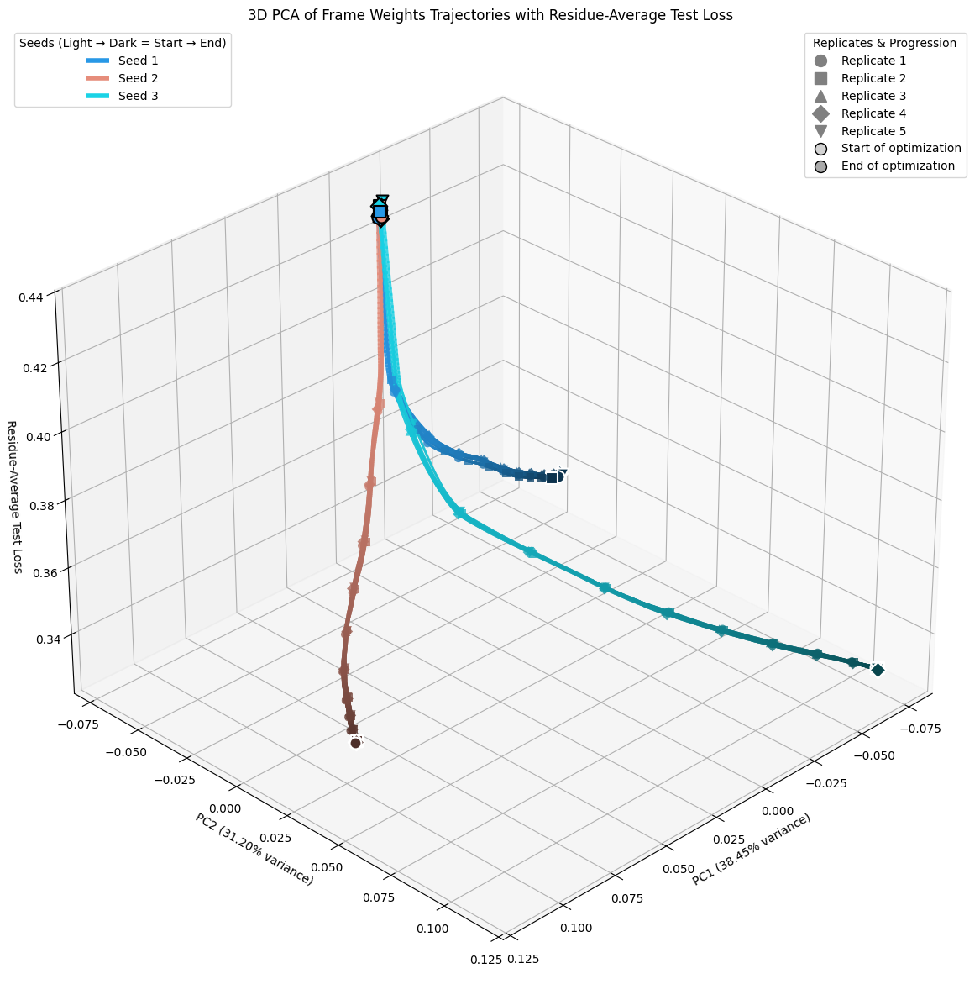

In [ ]:
print("Generating 3D PCA visualization with residue-average test loss...")
pca3d_fig = visualize_pca_3d_test_loss(optimization_results, test_losses, n_seeds, n_replicates)
plt.show()

In [ ]:
tsne_fig = visualize_tsne_trajectories(optimization_results, n_seeds, n_replicates)


NameError: name 'visualize_tsne_trajectories' is not defined

Generating 3D t-SNE visualization with residue-average test loss...


/Users/alexi/JAX-ENT/.venv/lib/python3.13/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


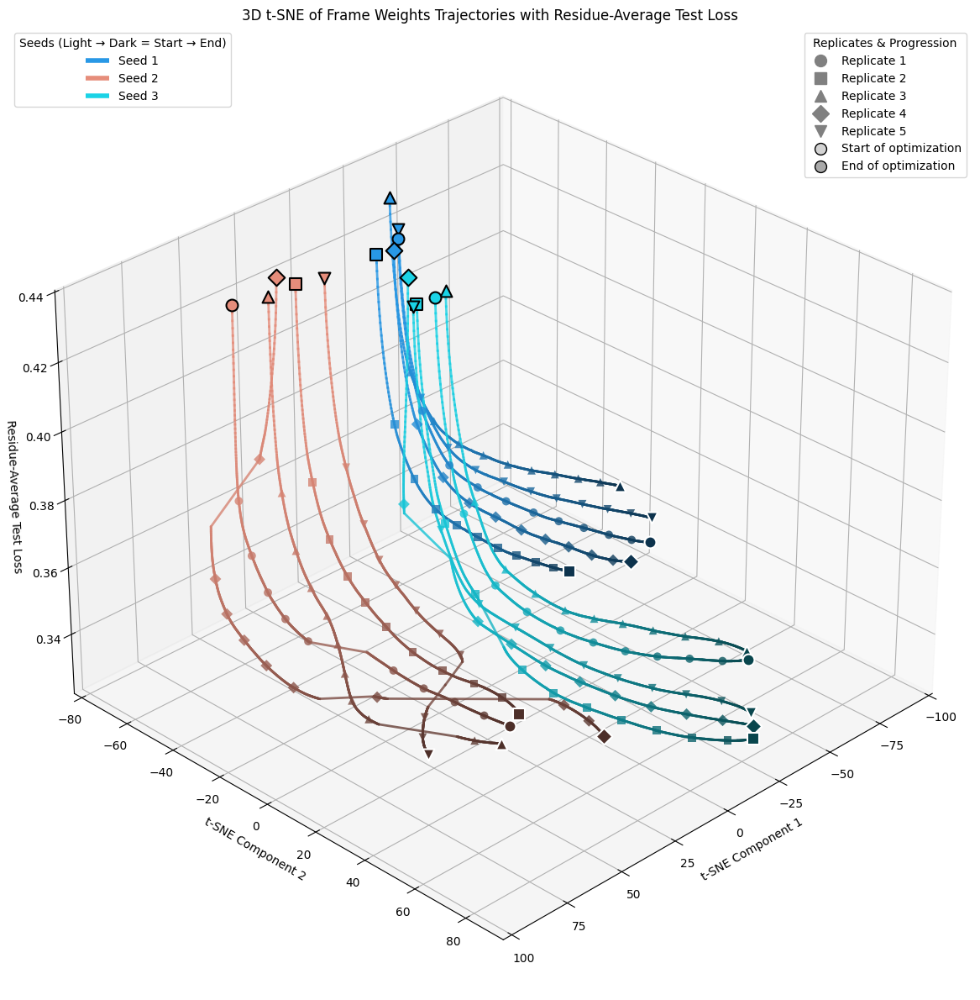

In [ ]:

print("Generating 3D t-SNE visualization with residue-average test loss...")
tsne3d_fig = visualize_tsne_3d_loss(optimization_results, test_losses, n_seeds, n_replicates)
plt.show()

Generating validation vs test loss comparison...


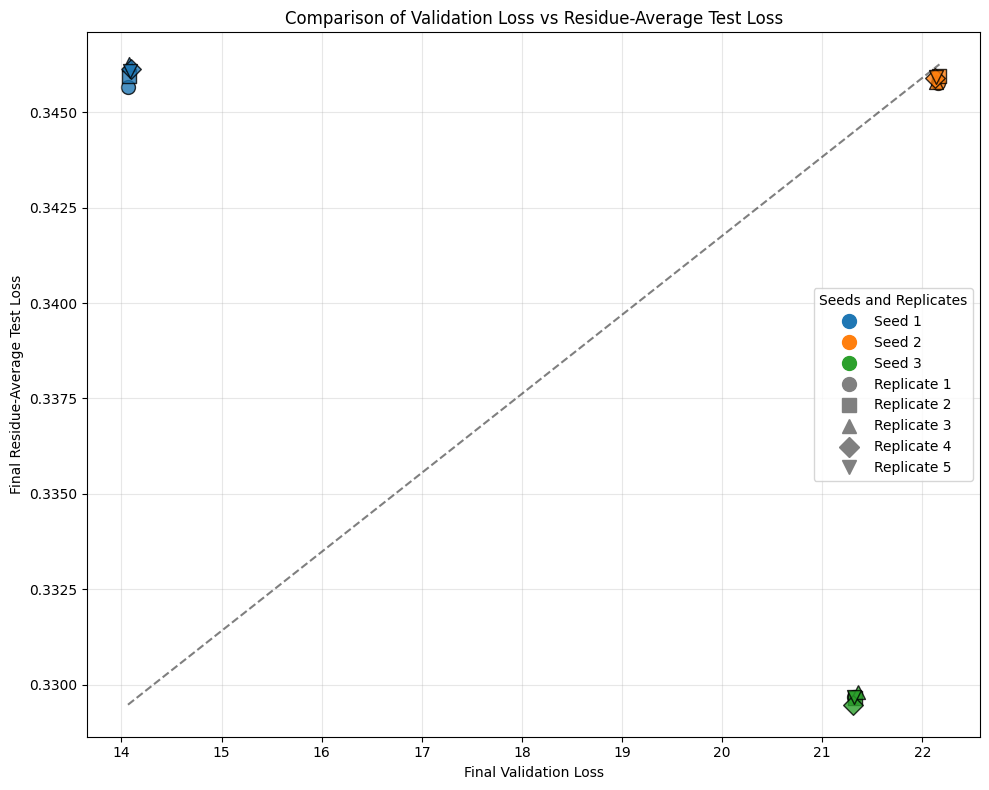

In [ ]:
print("Generating validation vs test loss comparison...")
comparison_fig = plot_val_vs_test_loss(optimization_results, test_losses, n_seeds, n_replicates)
plt.show()

In [ ]:

# Function to run optimization for each dataset seed and replicate
def run_max_ent_optimization_replicates(simulation, datasets, models, opt_settings, n_replicates):
    """
    Runs optimization for each dataset and replicate with randomized frame weights.
    
    Parameters:
    -----------
    simulation : Simulation
        Simulation object
    datasets : list
        List of dataset objects
    models : list
        List of forward model objects
    opt_settings : OptimiserSettings
        Optimization settings
    n_replicates : int
        Number of replicates per dataset
        
    Returns:
    --------
    results : dict
        Dictionary of optimization results for each dataset and replicate
    """
    results = {}
    rng_key = jax.random.PRNGKey(0)

    prior_params = simulation.params
    
    for i, dataset in enumerate(datasets):
        seed_results = []
        
        for j in range(n_replicates):
            try:
                # Generate a new random key for each replicate
                rng_key, subkey = jax.random.split(rng_key)
                
                # Get the trajectory length from simulation
                trajectory_length = simulation.input_features[0].features_shape[2]
                
                # Randomize frame weights
                random_weights = jax.random.uniform(subkey, shape=(trajectory_length,))
                random_weights = simulation.params.frame_weights + random_weights
                random_weights = random_weights / jnp.sum(random_weights)  # Normalize
                
                # Create new parameters with random weights, preserving all other values
                new_params = Simulation_Parameters(
                    frame_weights=random_weights,
                    frame_mask=simulation.params.frame_mask,
                    model_parameters=simulation.params.model_parameters,
                    forward_model_weights=jnp.ones(2),
                    forward_model_scaling=jnp.ones(2),
                    normalise_loss_functions=jnp.ones(2),
                )
                
                # Create a new simulation with the updated parameters
                new_simulation = Simulation(
                    forward_models=simulation.forward_models,
                    input_features=simulation.input_features,
                    params=new_params
                )
                new_simulation.initialise()
                
                optimiser = OptaxOptimizer(parameter_masks={Optimisable_Parameters.frame_weights})
                # Run optimization
                print(f"Running optimization for Dataset Seed {i+1}/{len(datasets)}, Replicate {j+1}/{n_replicates}")
                opt_result = run_optimise(
                    new_simulation,
                    optimizer=optimiser,
                    data_to_fit=(dataset,prior_params),
                    config=opt_settings,
                    forward_models=models,
                    indexes=[0, 0],
                    loss_functions=[hdx_pf_l2_loss, max_entropy_loss],
                )
                
                # Store the result
                seed_results.append(opt_result)
                
                # Visualize this optimization run
                print(f"Visualizing results for Dataset Seed {i+1}/{len(datasets)}, Replicate {j+1}/{n_replicates}")
                visualize_optimization_results(
                    dataset.train.data, 
                    dataset.val.data, 
                    dataset.test.data, 
                    opt_result
                )
            except Exception as e:
                print(f"Error in Dataset Seed {i+1}, Replicate {j+1}: {e}")
                # Add a placeholder for failed runs to maintain indexing
                seed_results.append(None)
        
        results[f"seed_{i}"] = seed_results
    
    return results

Simulation initialised successfully.
Running optimization for Dataset Seed 1/3, Replicate 1/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

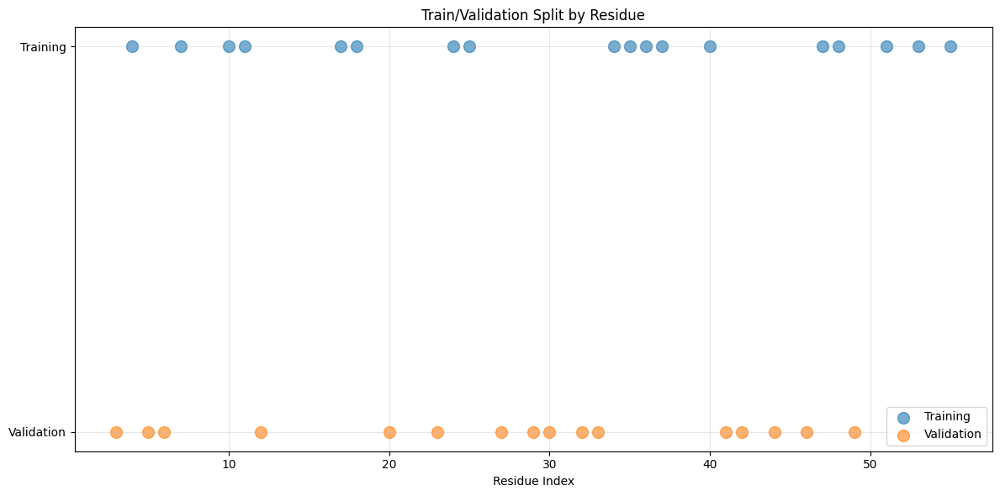

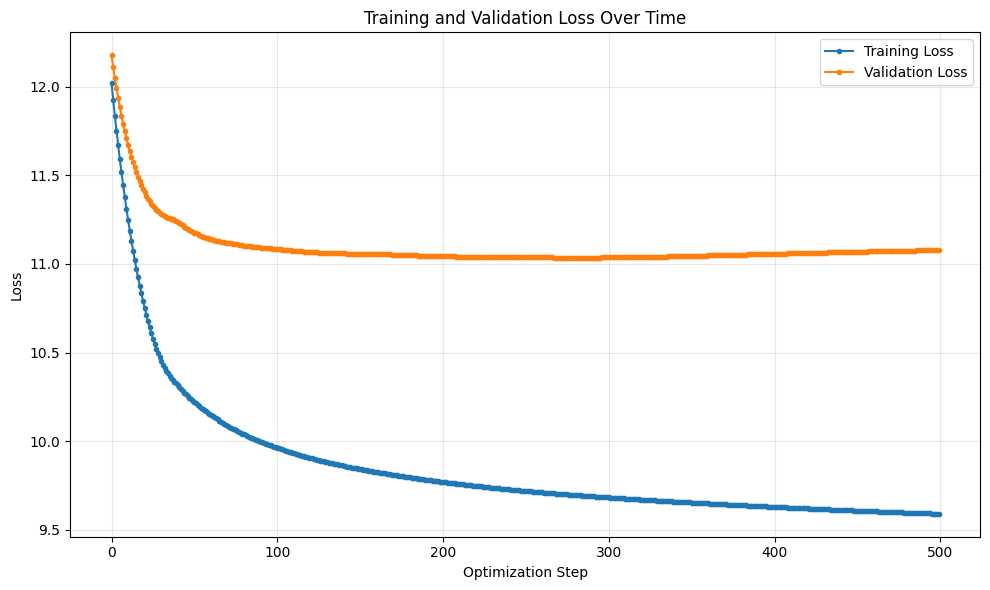

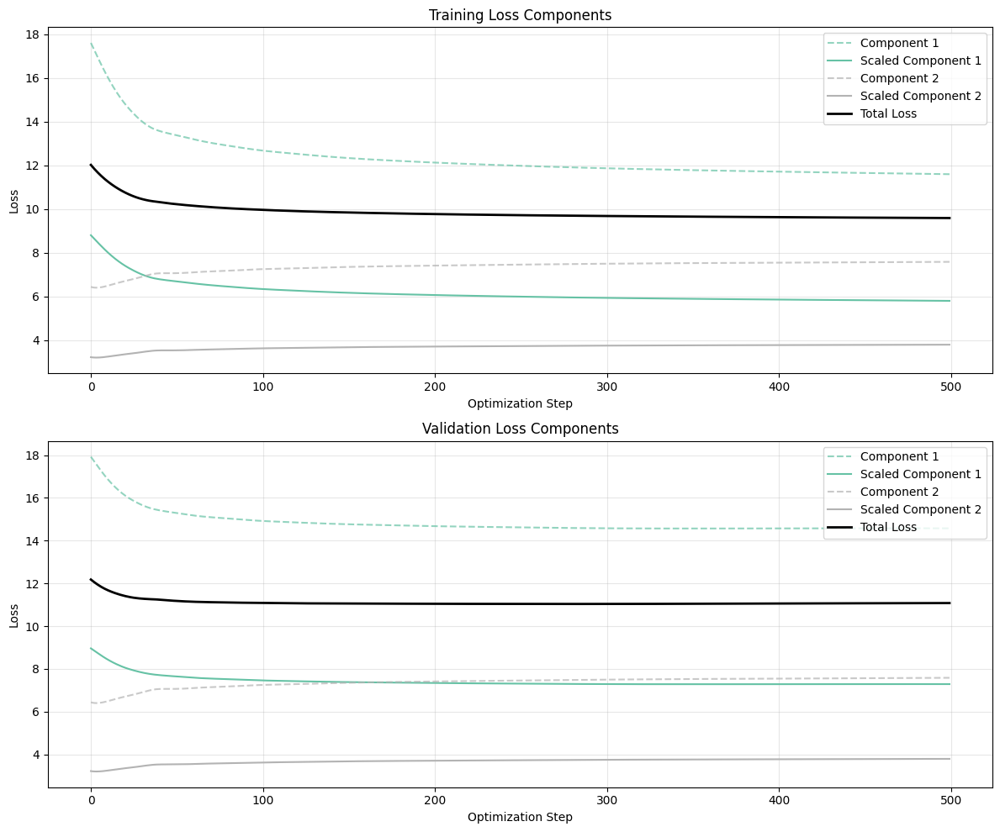

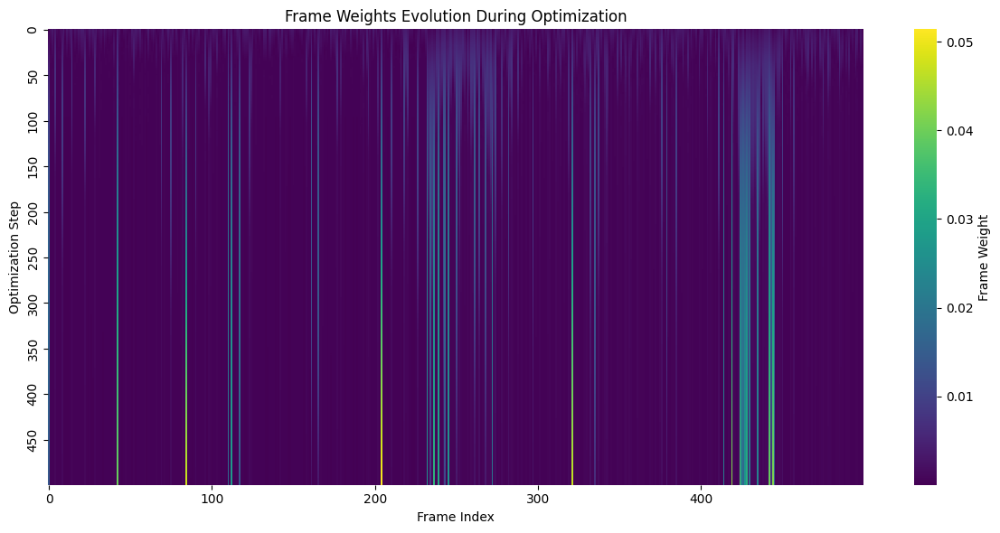

Simulation initialised successfully.
Running optimization for Dataset Seed 1/3, Replicate 2/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

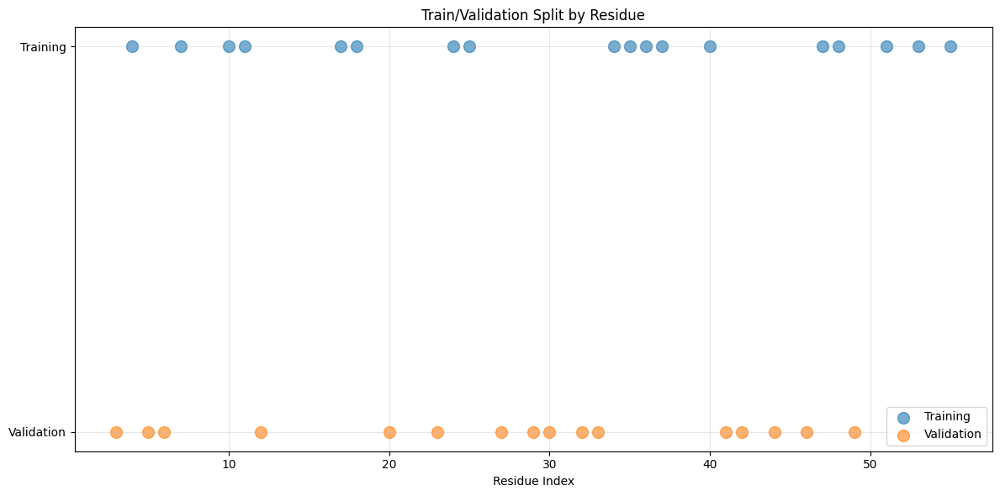

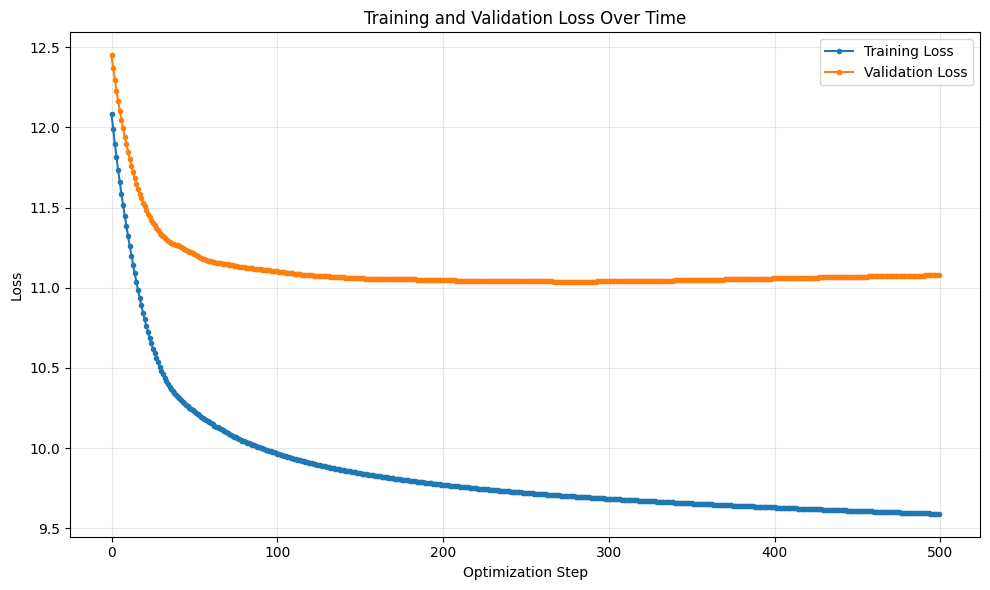

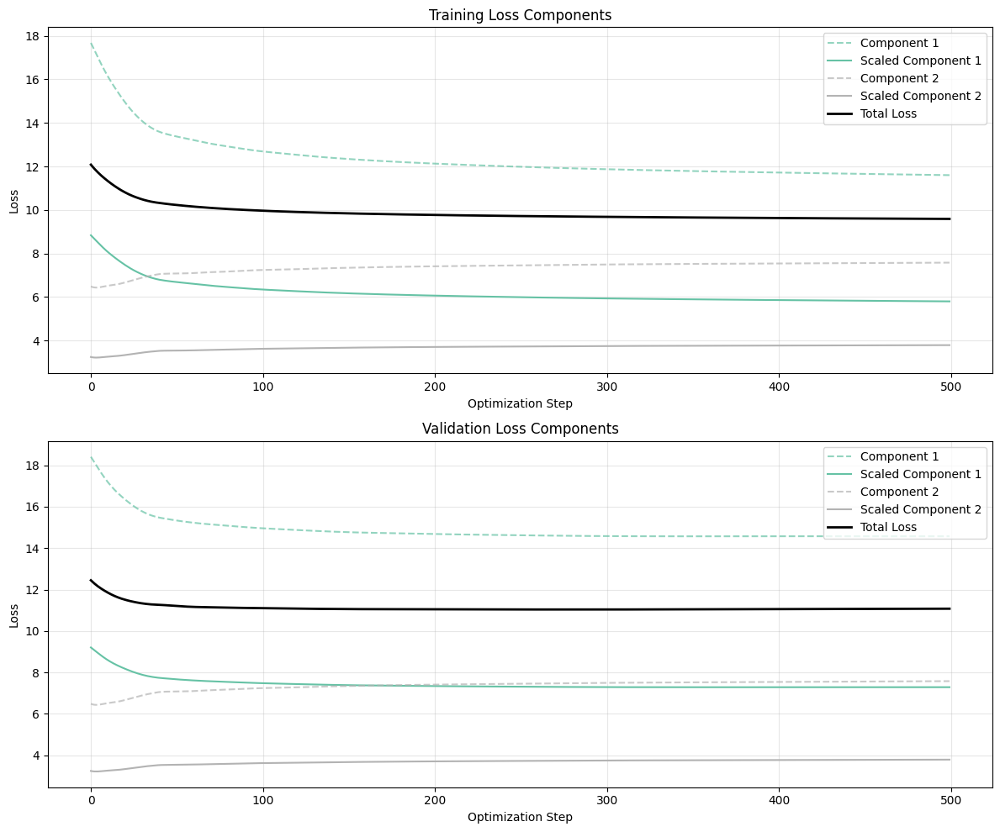

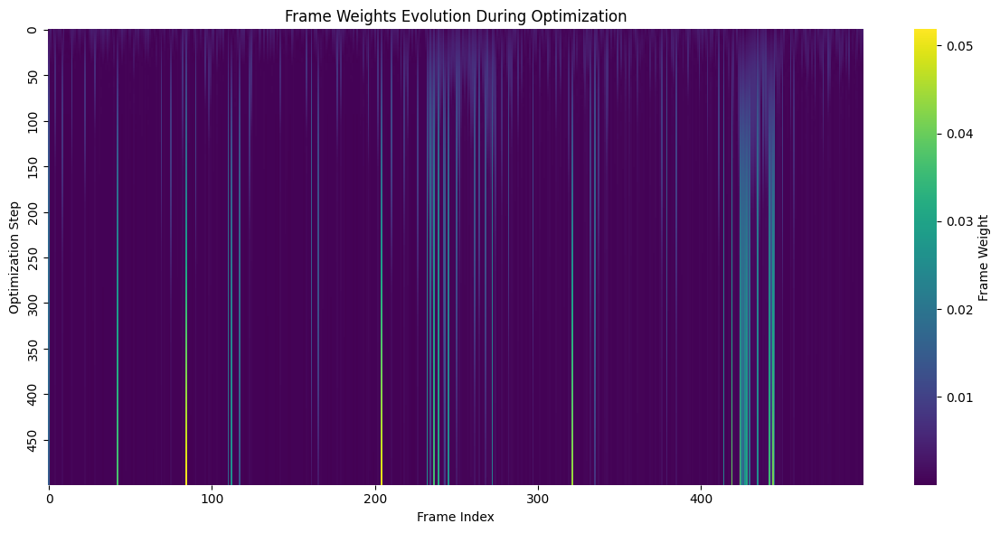

Simulation initialised successfully.
Running optimization for Dataset Seed 1/3, Replicate 3/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

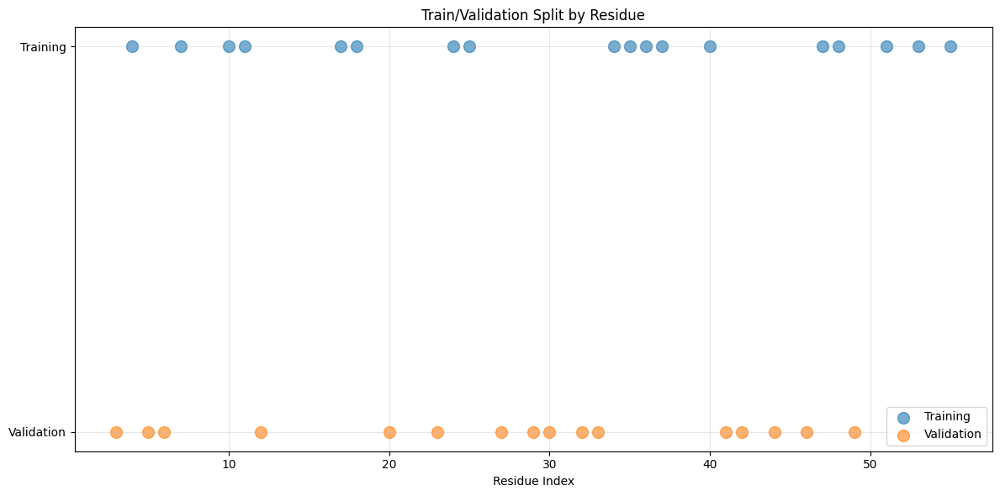

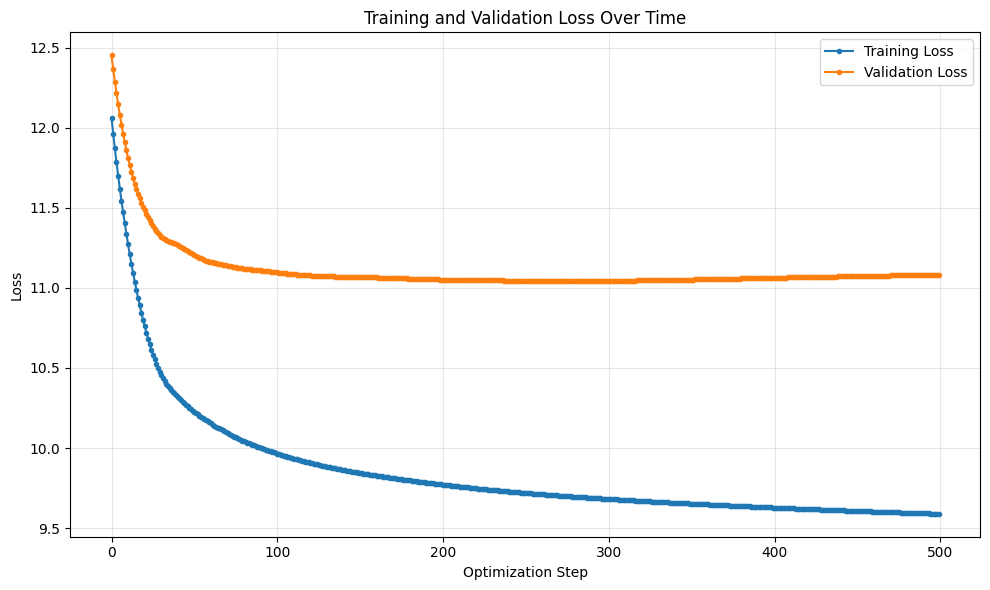

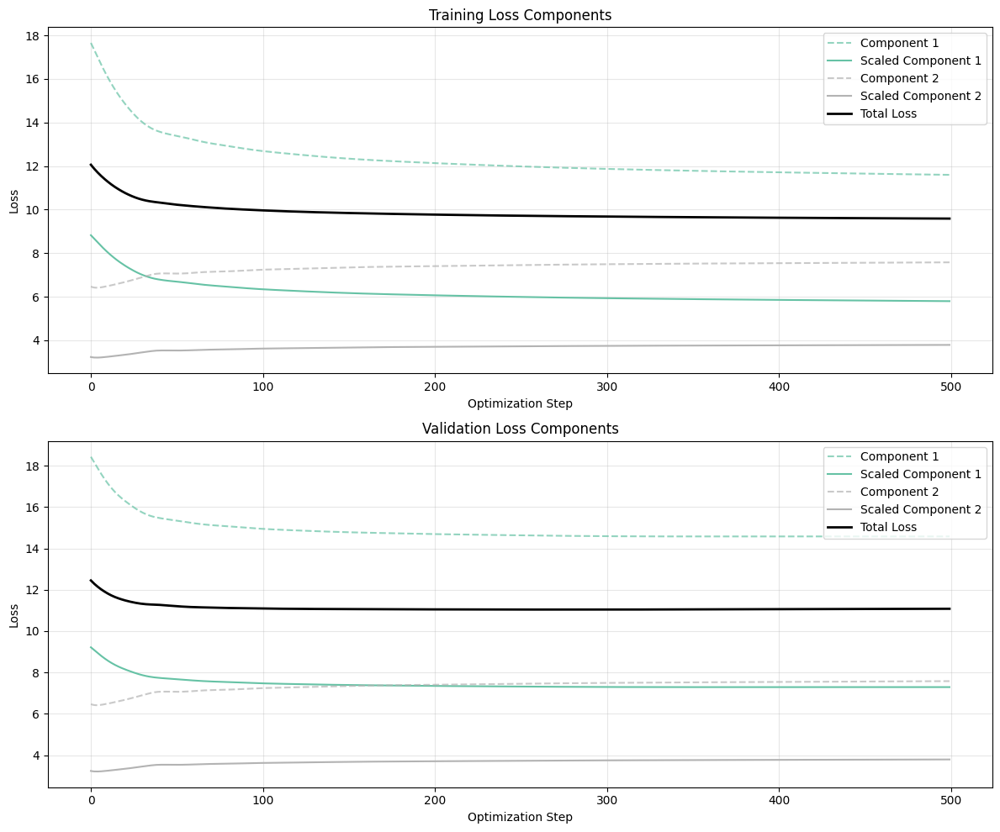

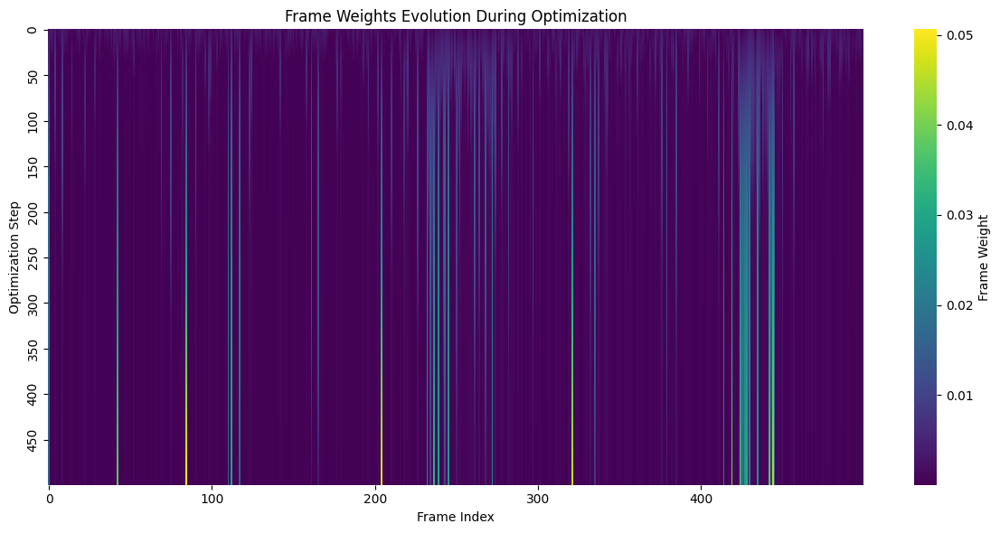

Simulation initialised successfully.
Running optimization for Dataset Seed 1/3, Replicate 4/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

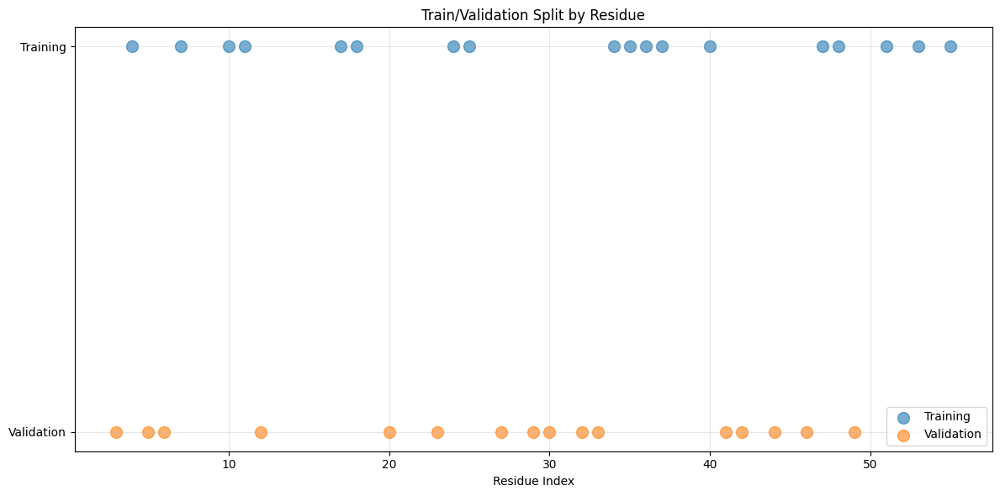

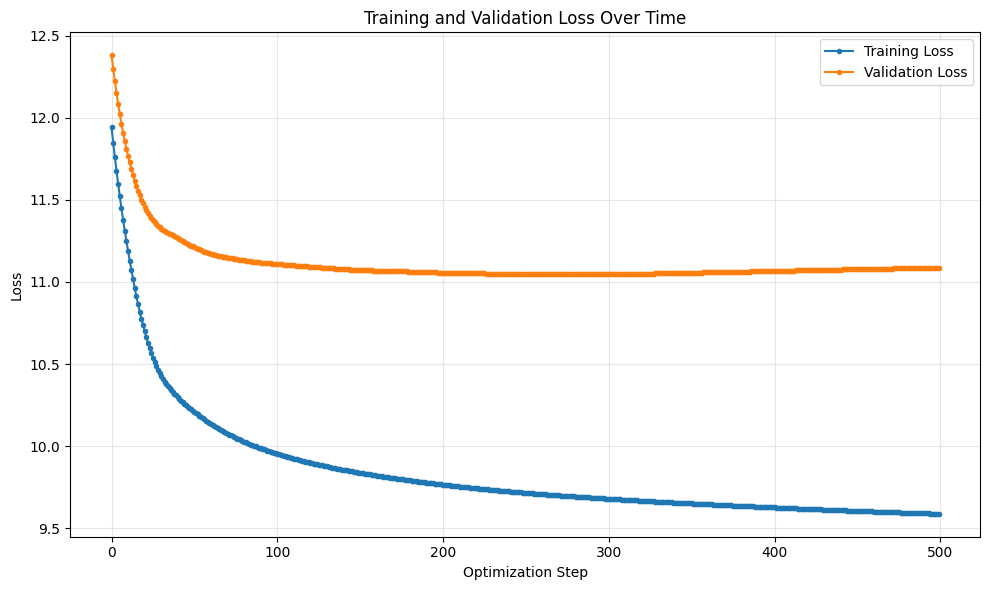

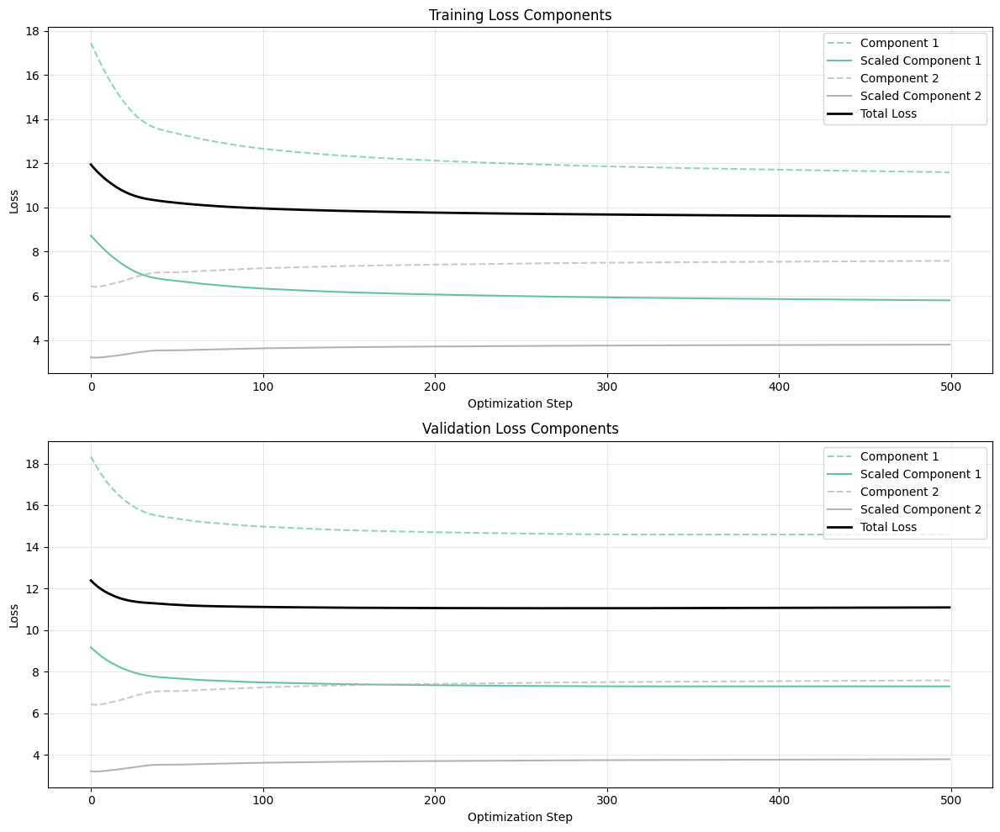

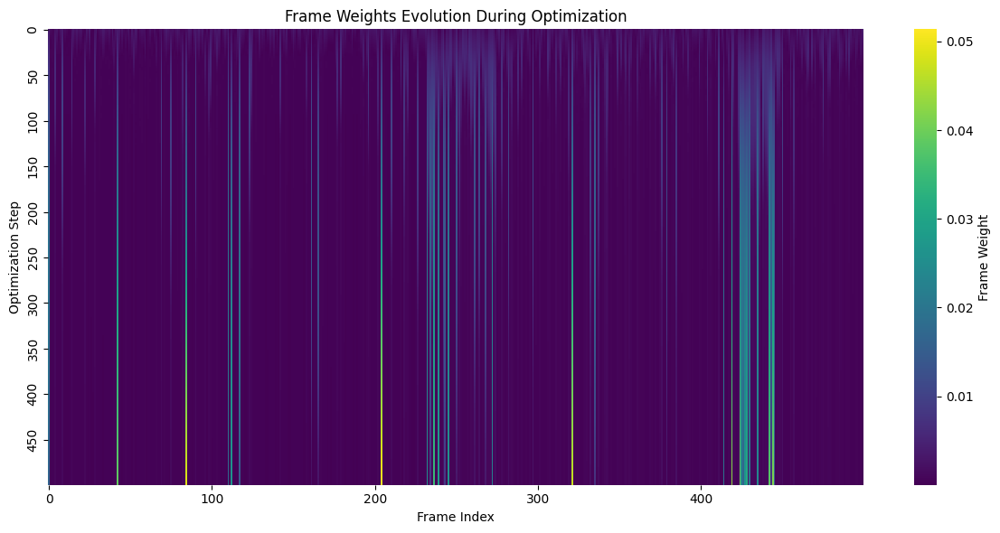

Simulation initialised successfully.
Running optimization for Dataset Seed 1/3, Replicate 5/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

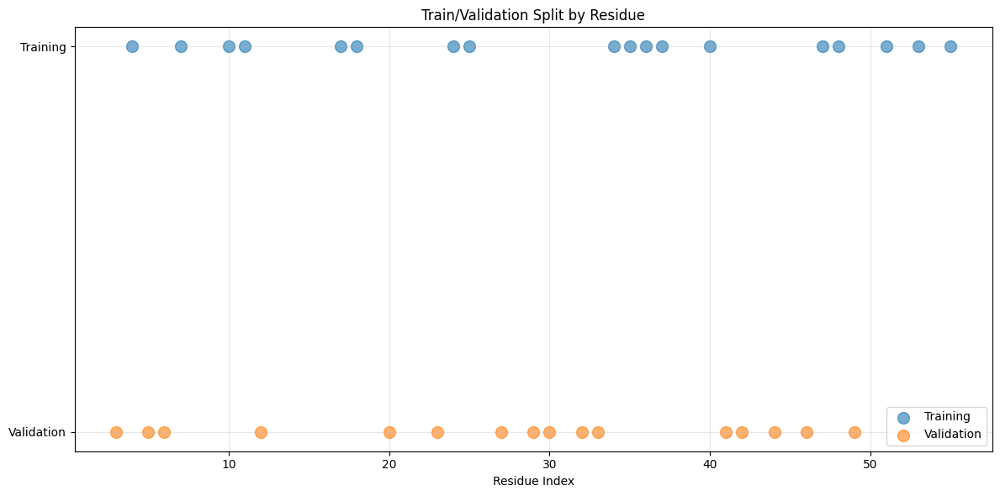

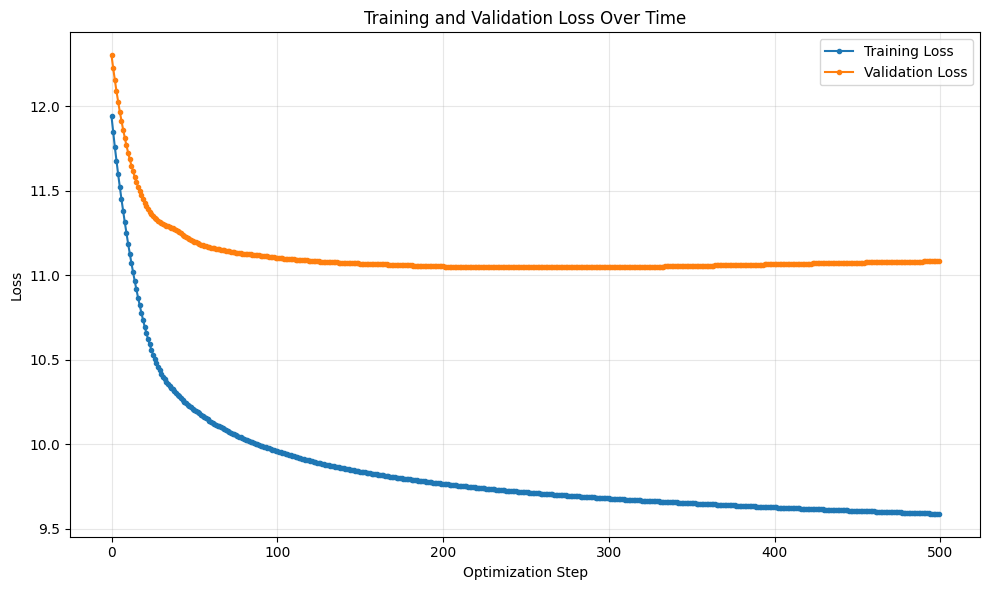

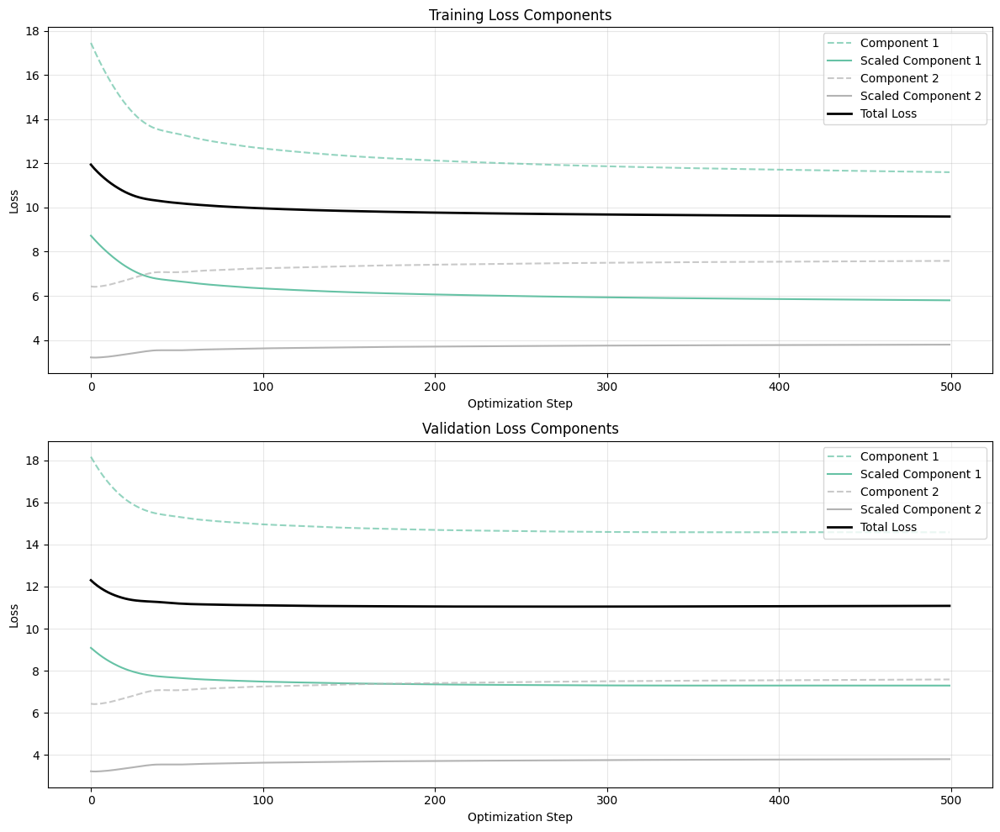

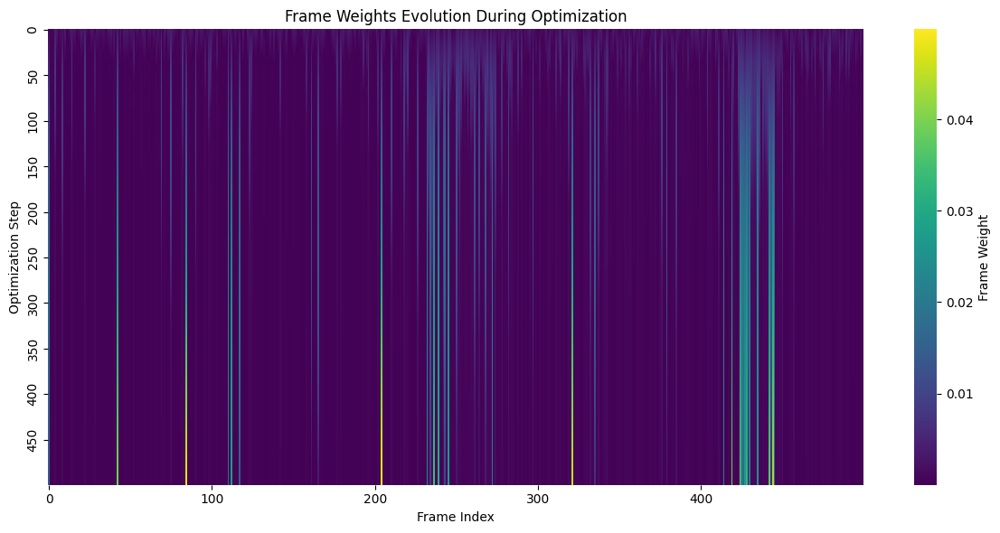

Simulation initialised successfully.
Running optimization for Dataset Seed 2/3, Replicate 1/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

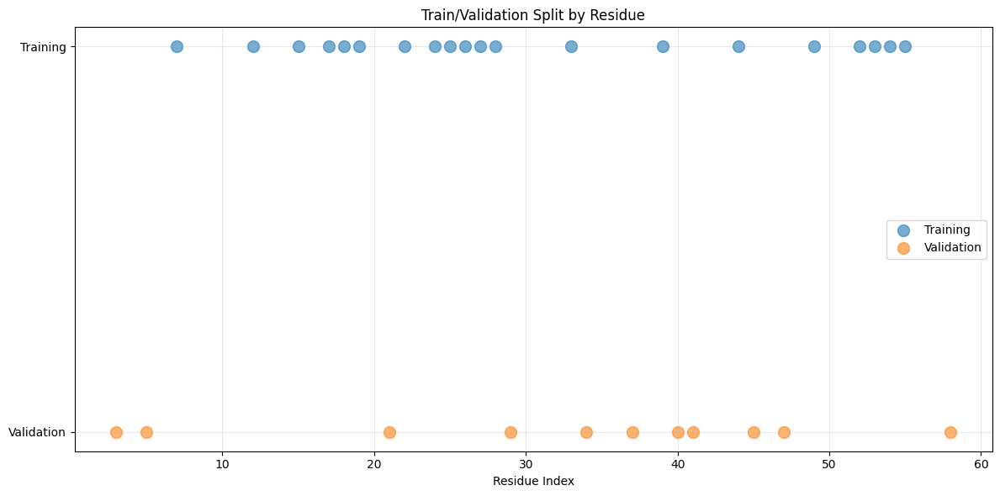

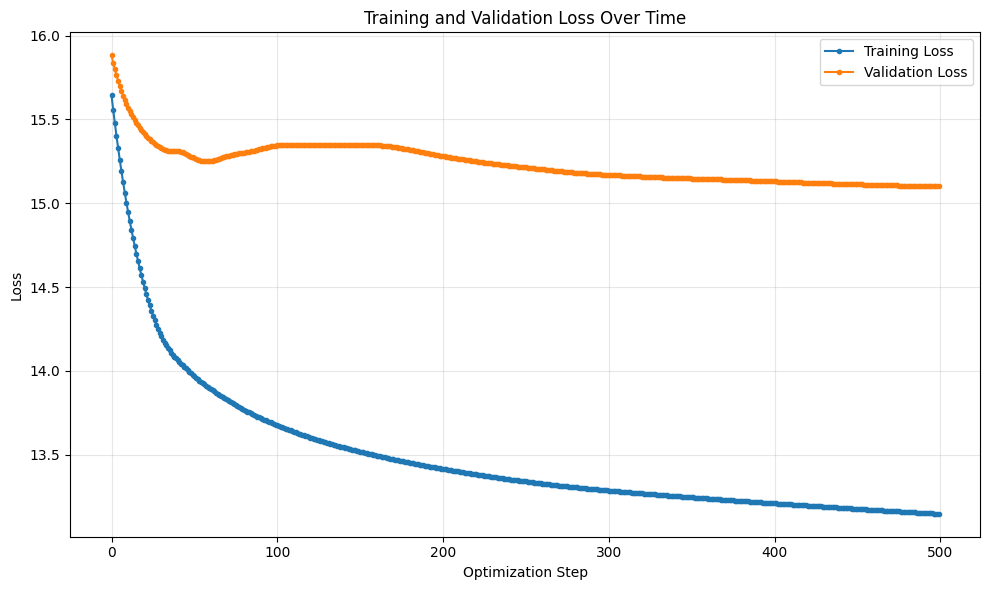

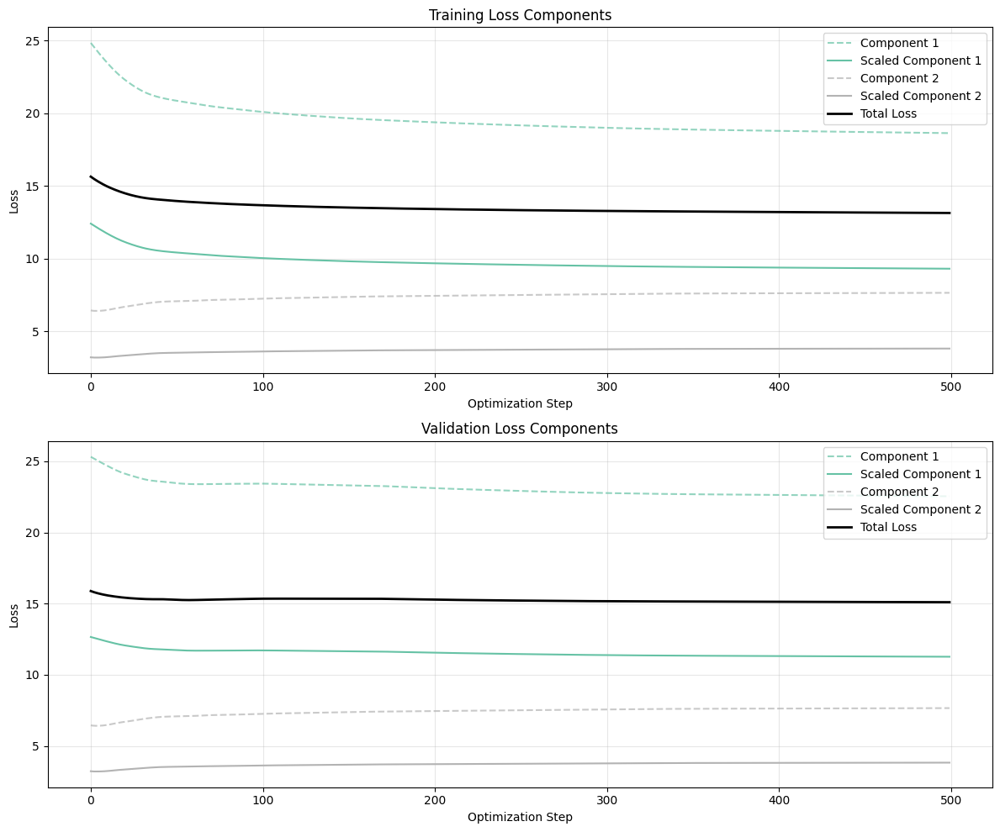

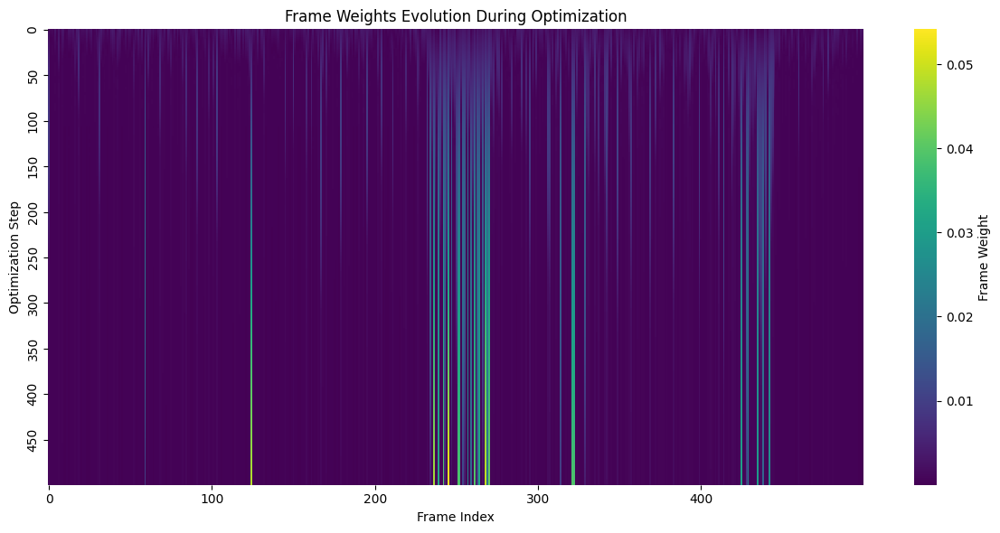

Simulation initialised successfully.
Running optimization for Dataset Seed 2/3, Replicate 2/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

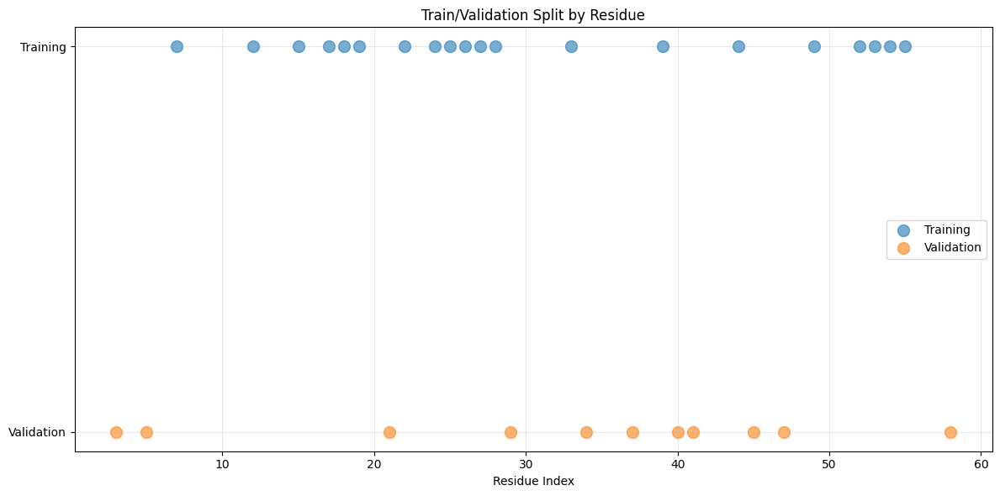

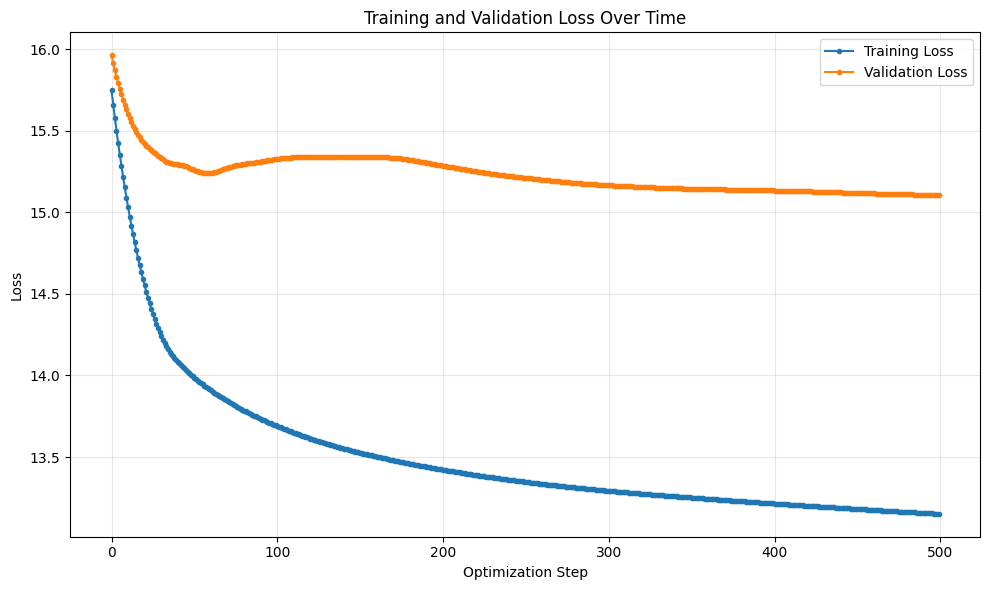

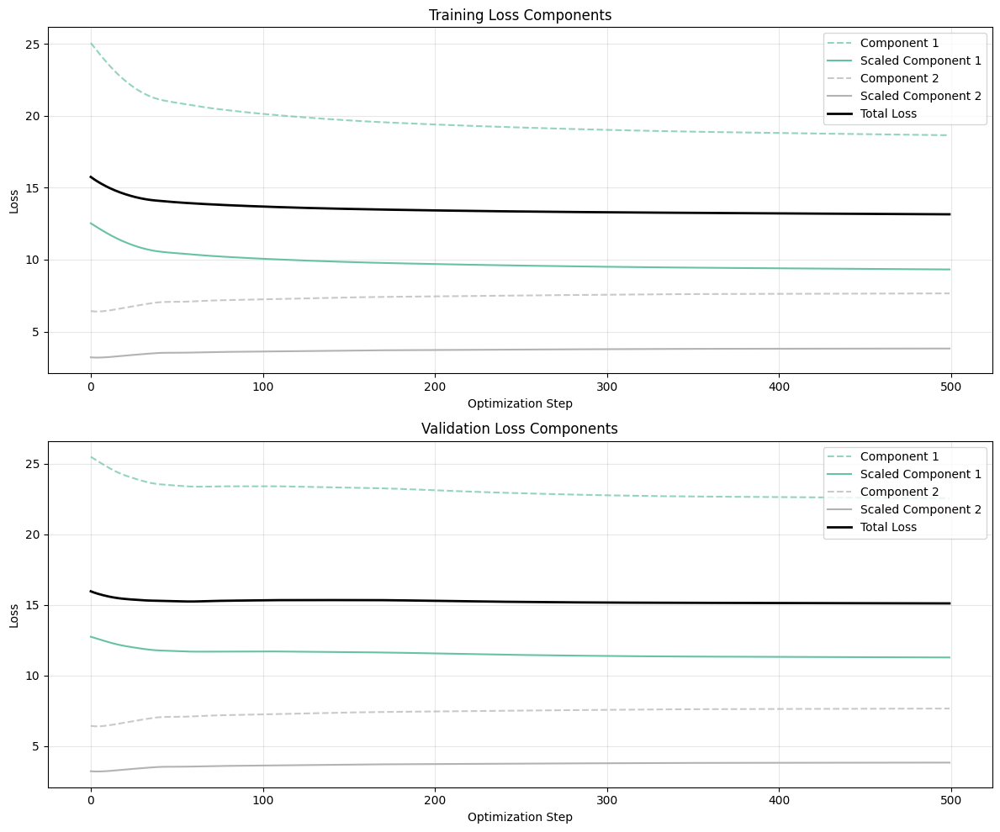

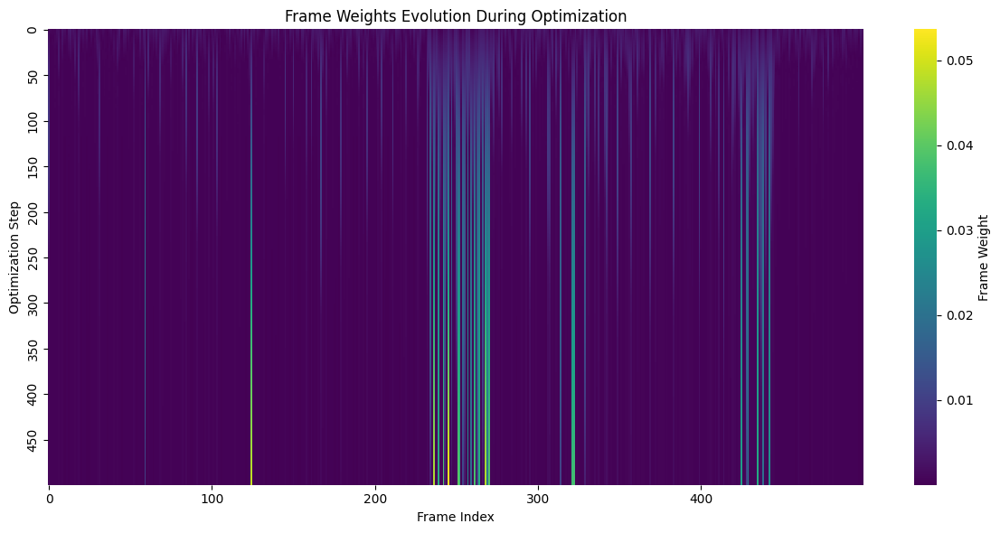

Simulation initialised successfully.
Running optimization for Dataset Seed 2/3, Replicate 3/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

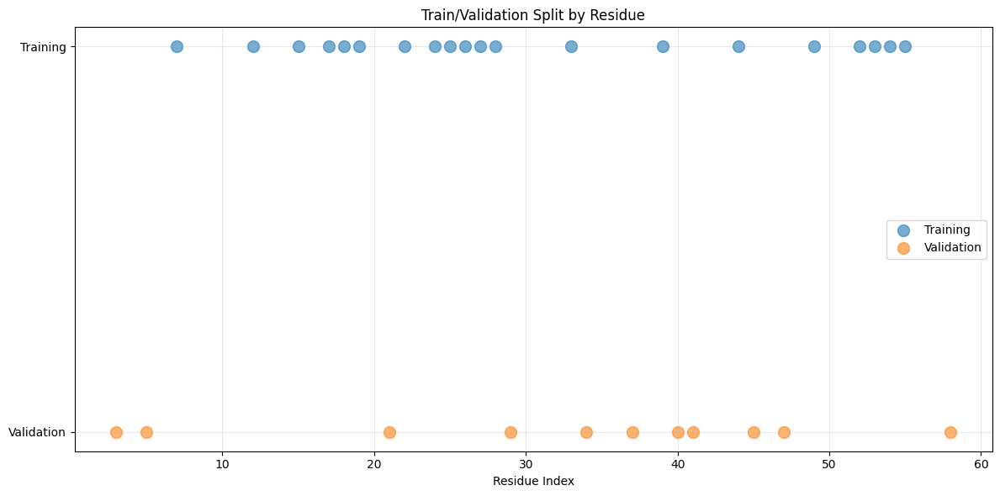

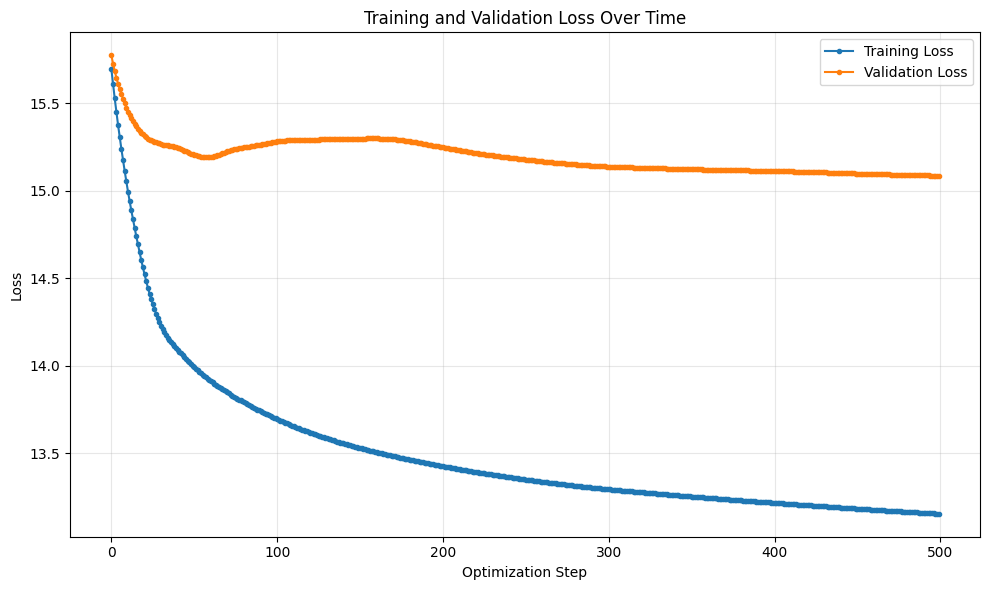

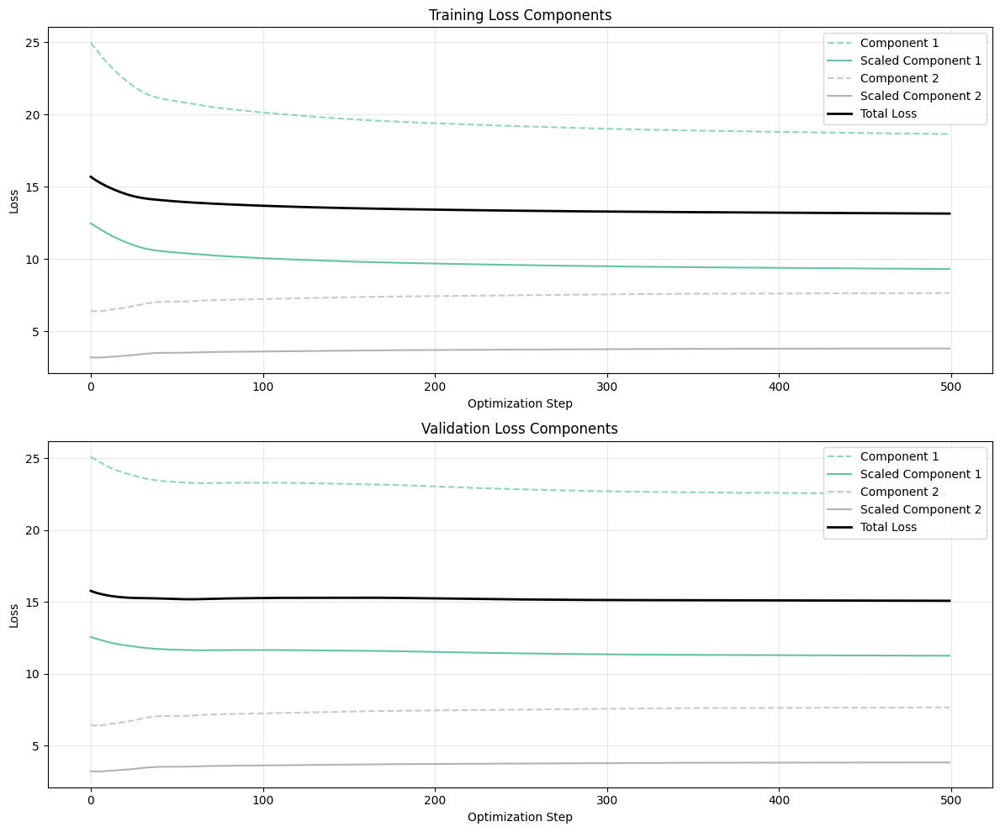

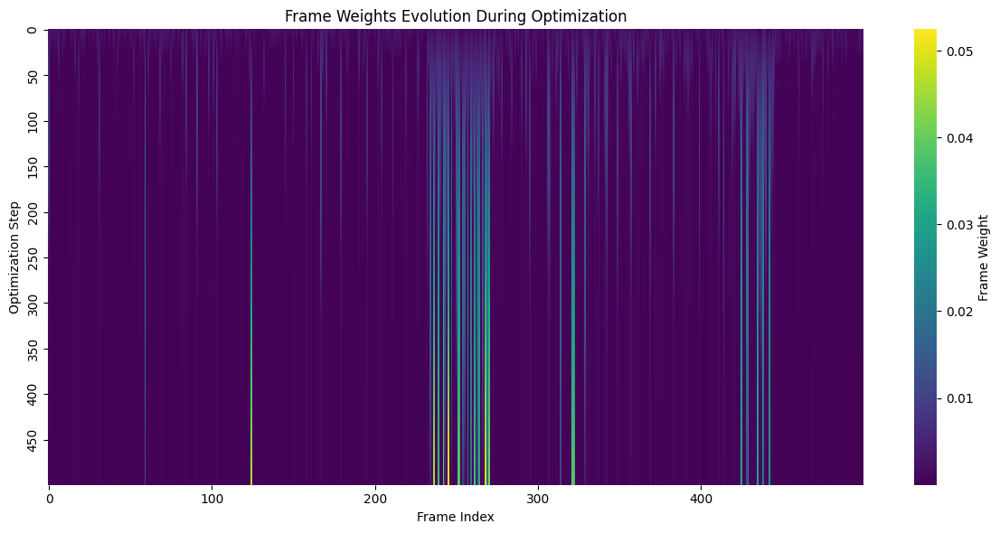

Simulation initialised successfully.
Running optimization for Dataset Seed 2/3, Replicate 4/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

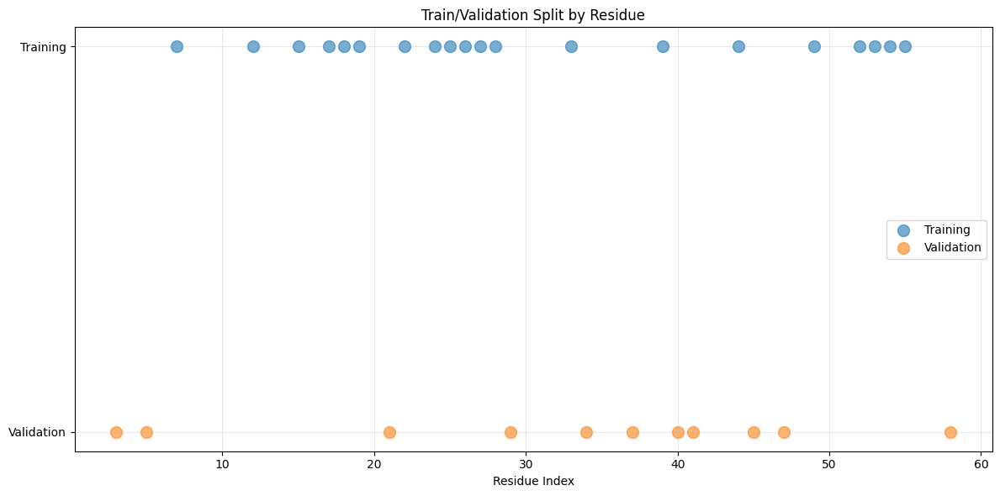

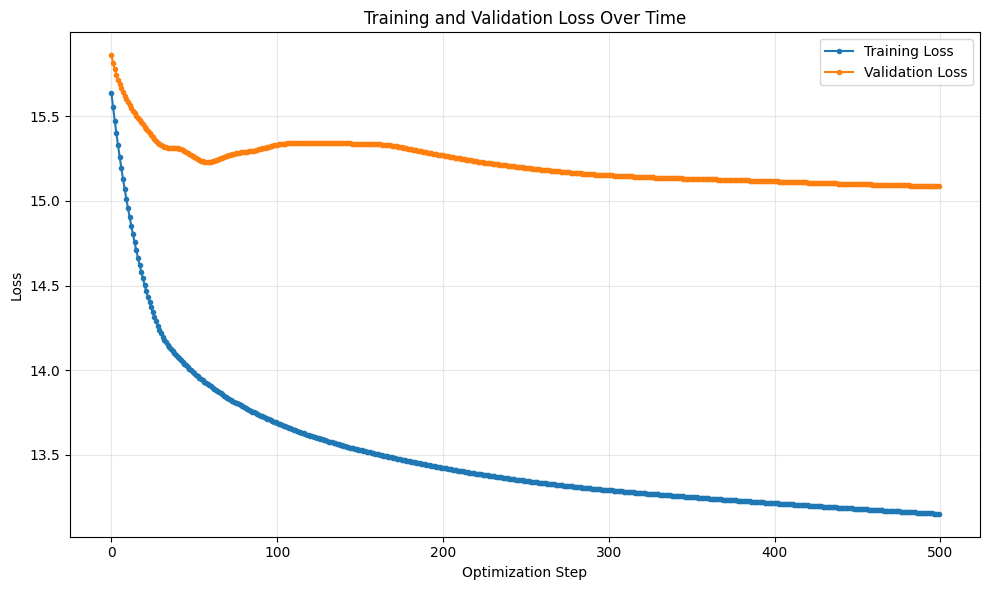

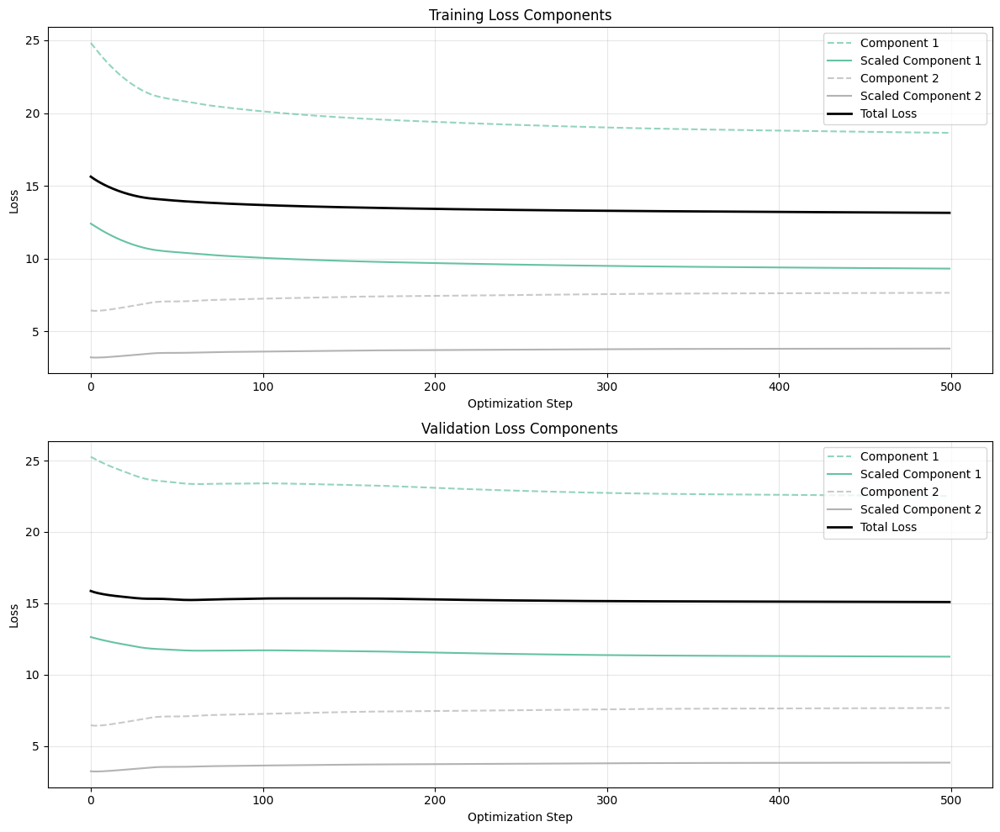

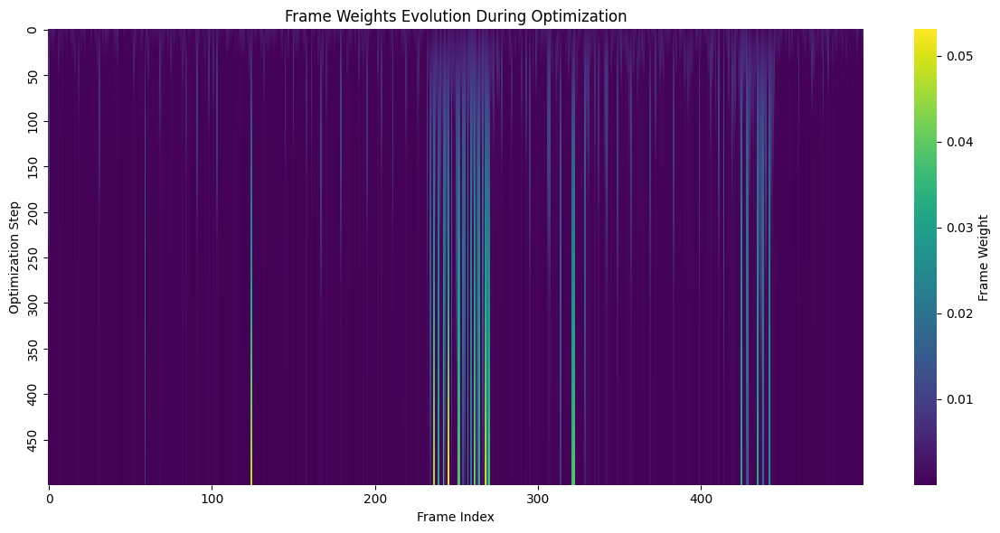

Simulation initialised successfully.
Running optimization for Dataset Seed 2/3, Replicate 5/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

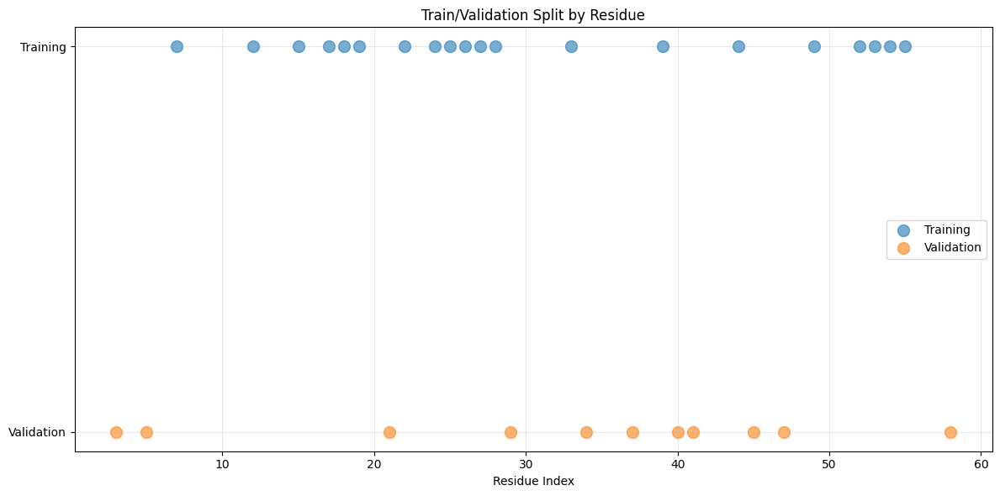

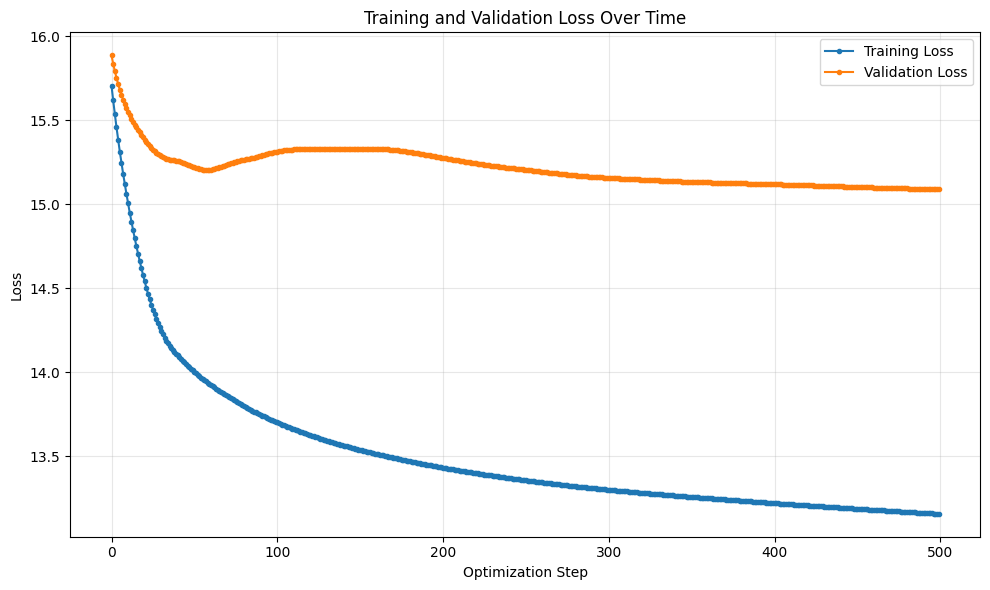

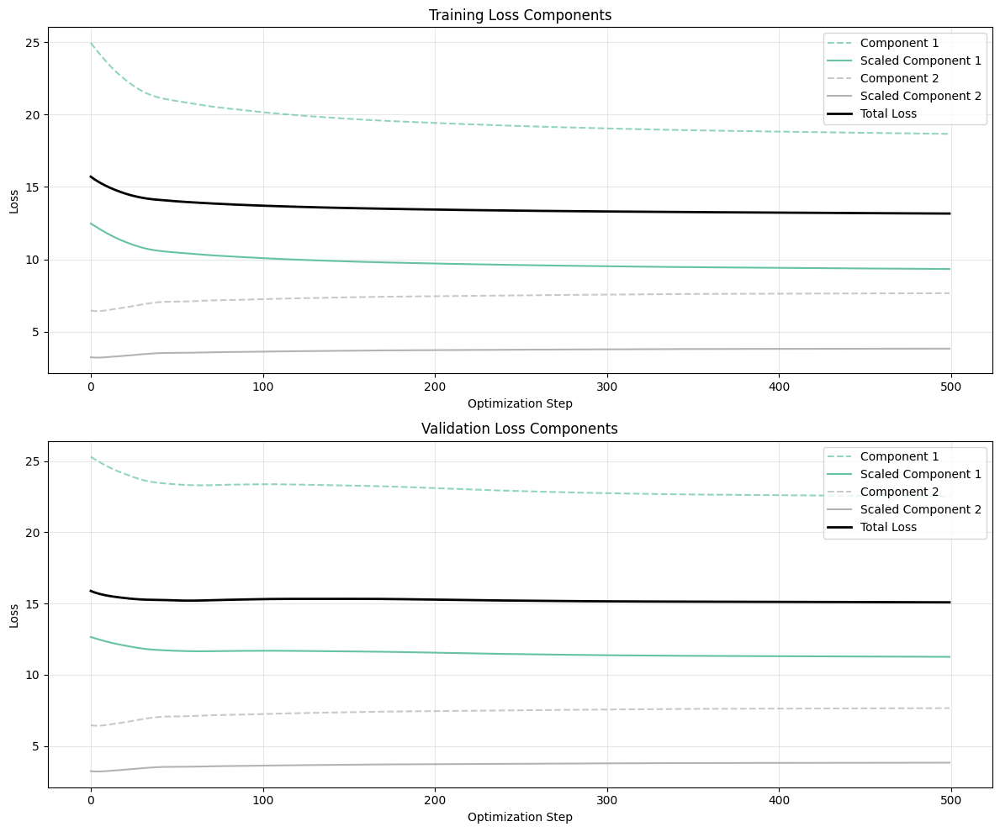

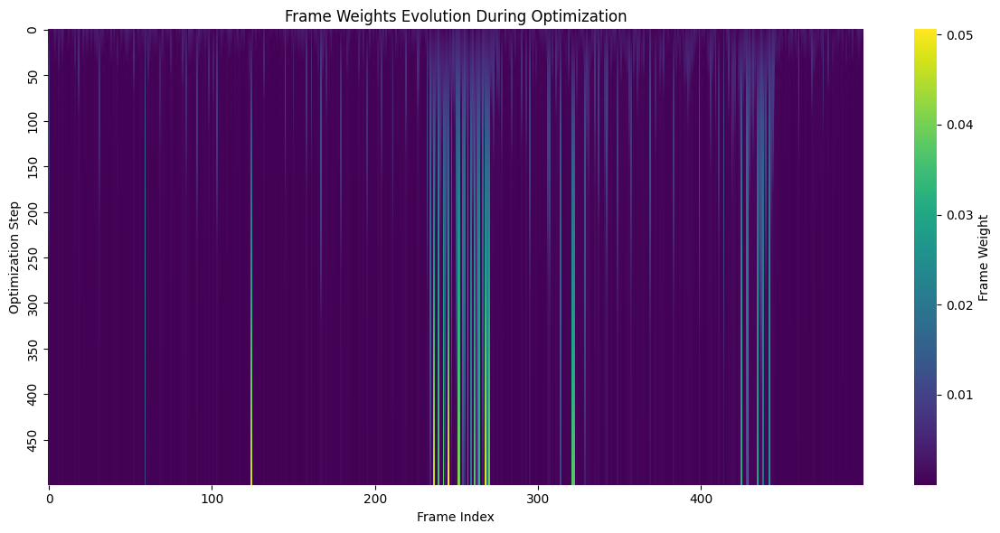

Simulation initialised successfully.
Running optimization for Dataset Seed 3/3, Replicate 1/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

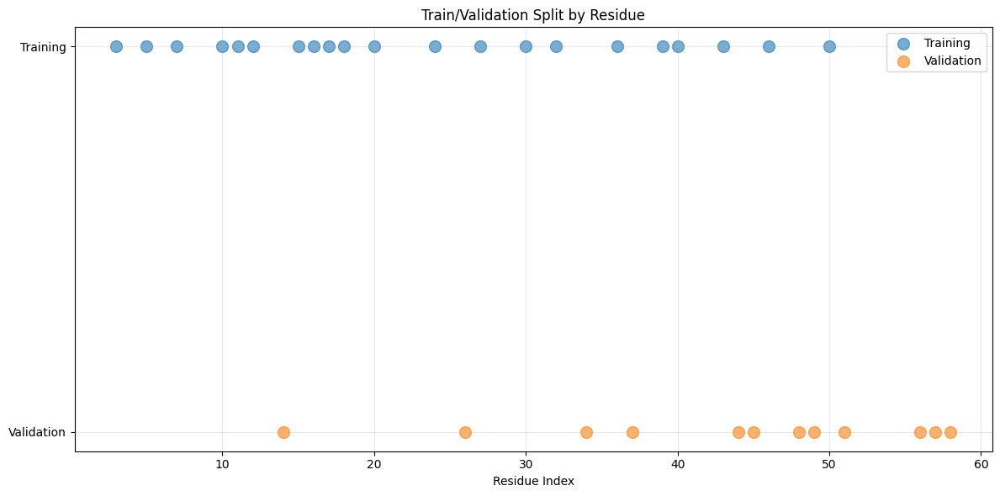

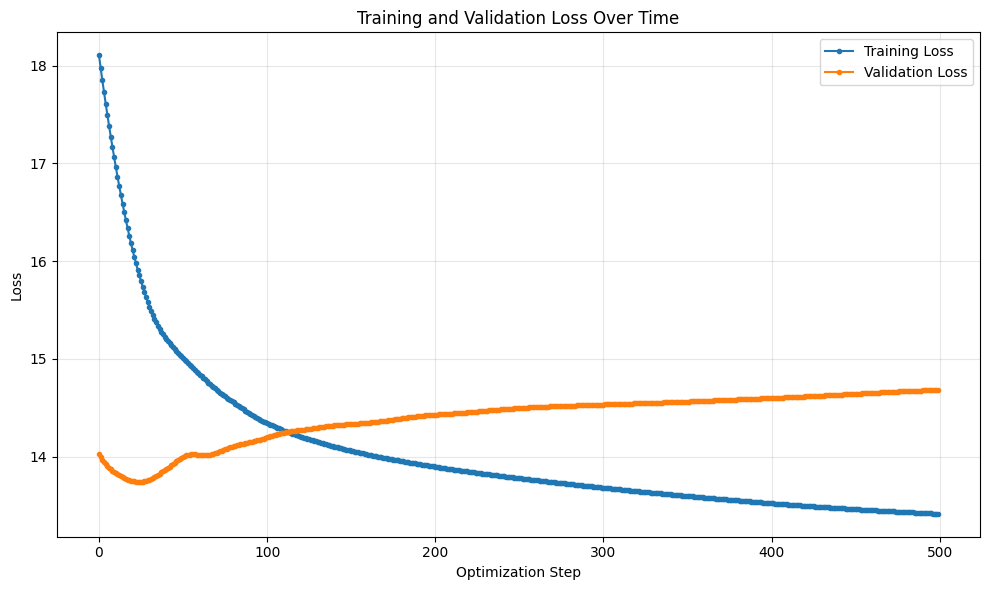

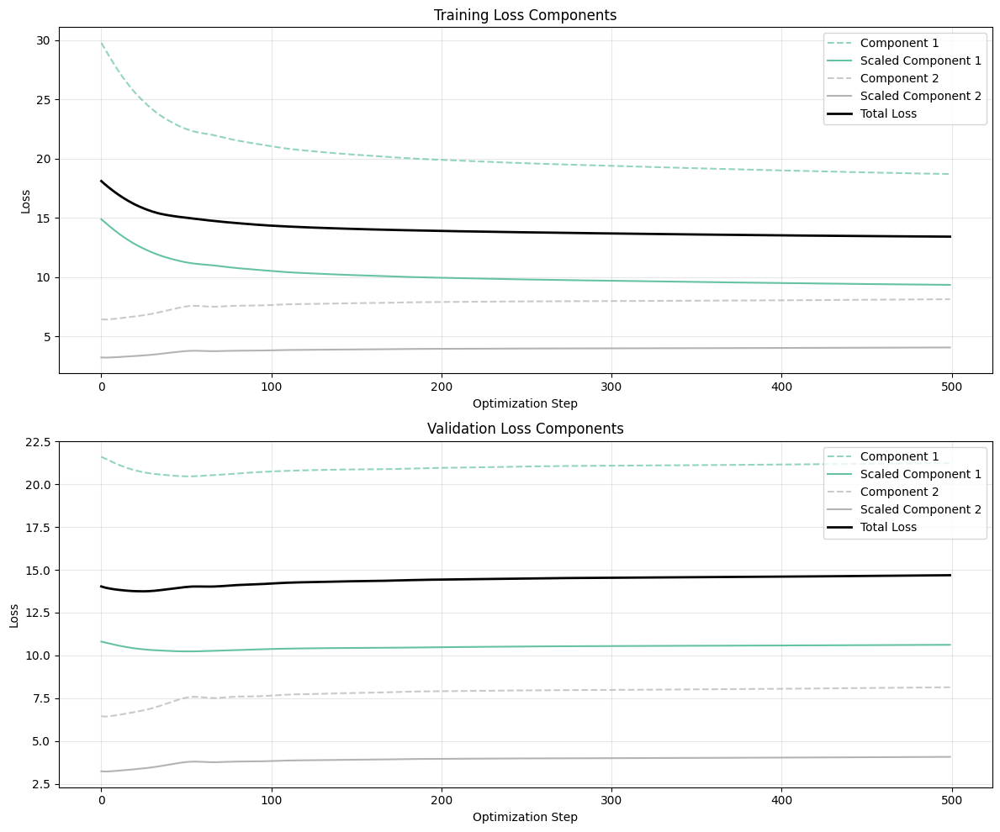

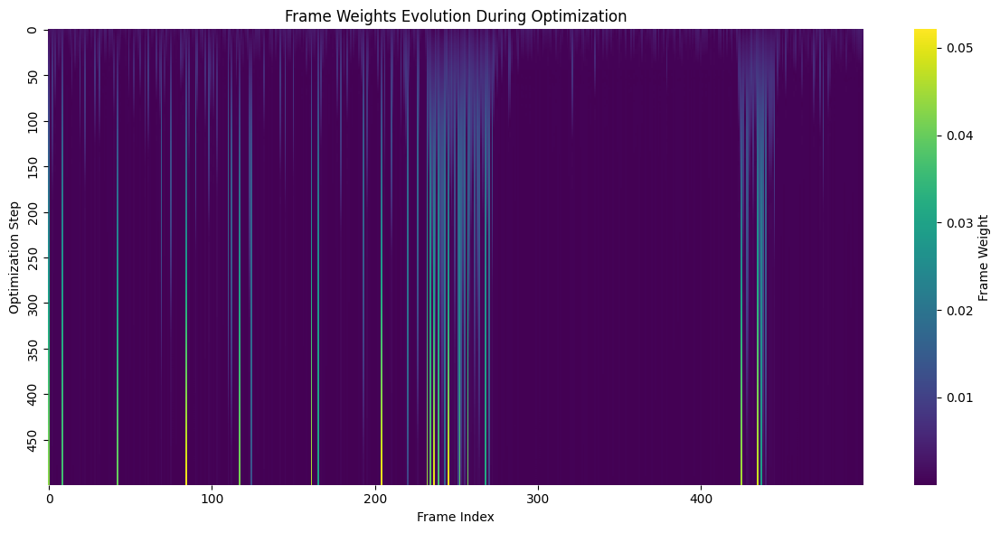

Simulation initialised successfully.
Running optimization for Dataset Seed 3/3, Replicate 2/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

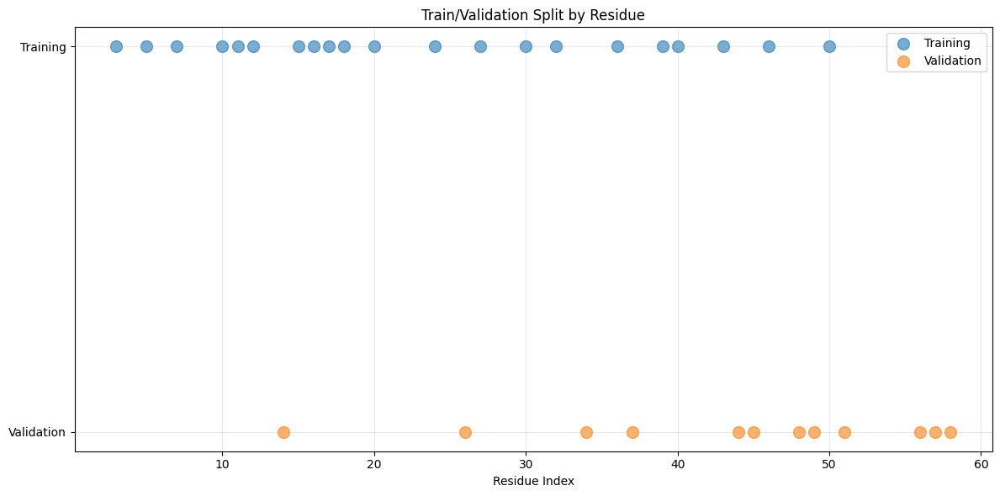

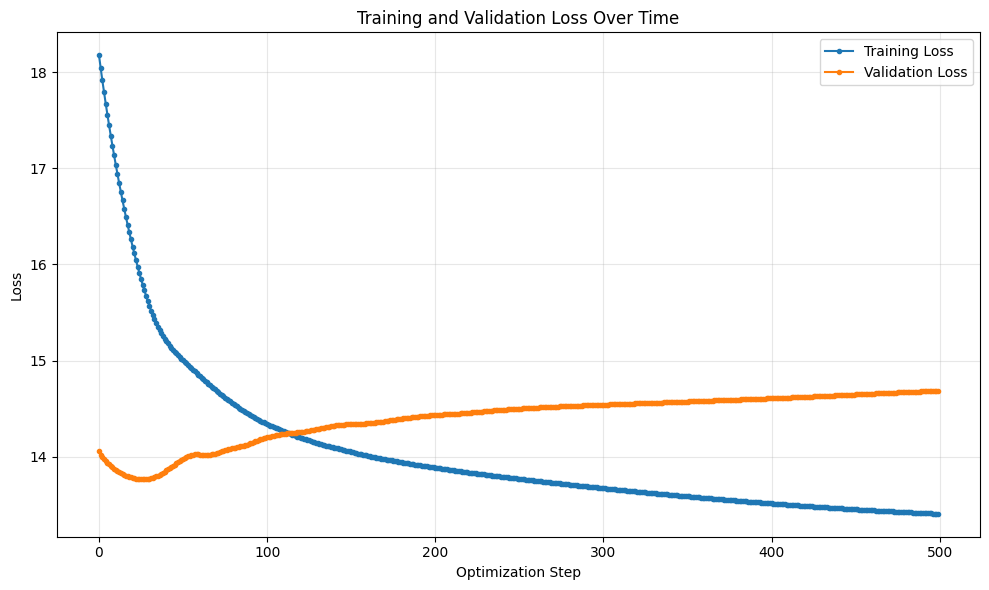

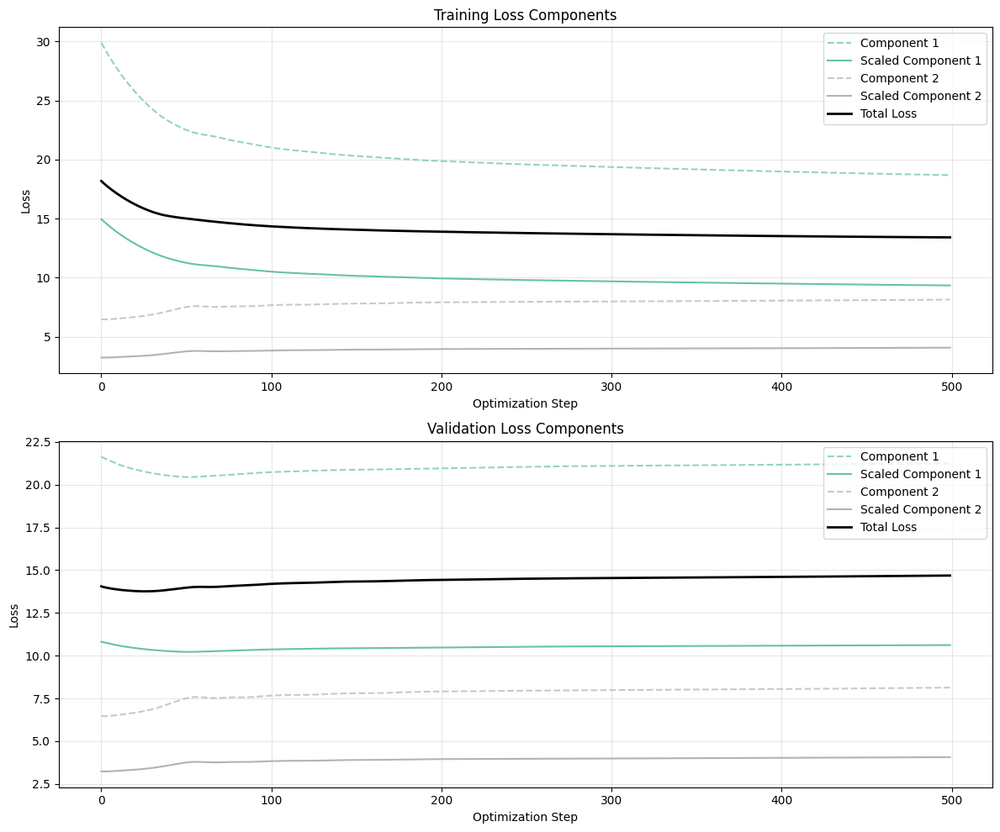

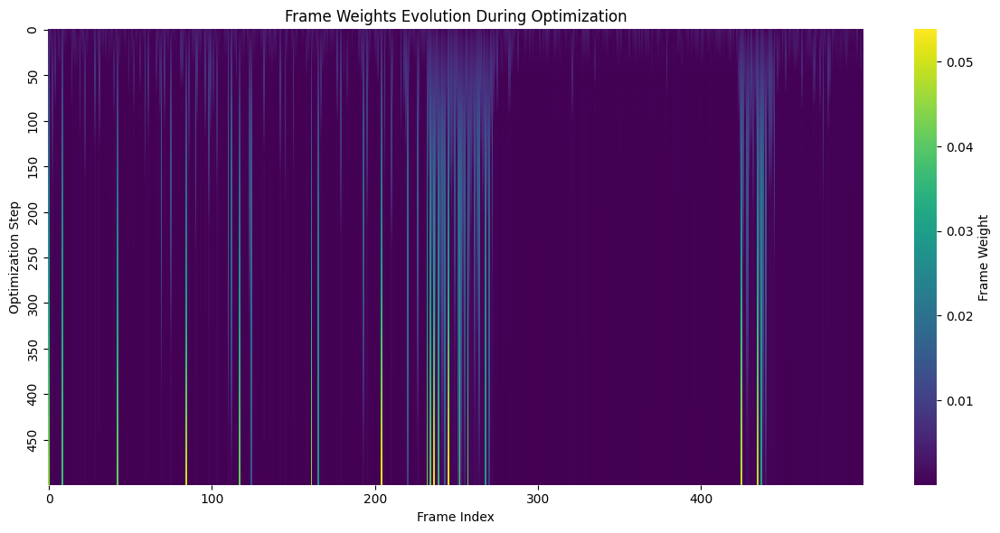

Simulation initialised successfully.
Running optimization for Dataset Seed 3/3, Replicate 3/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

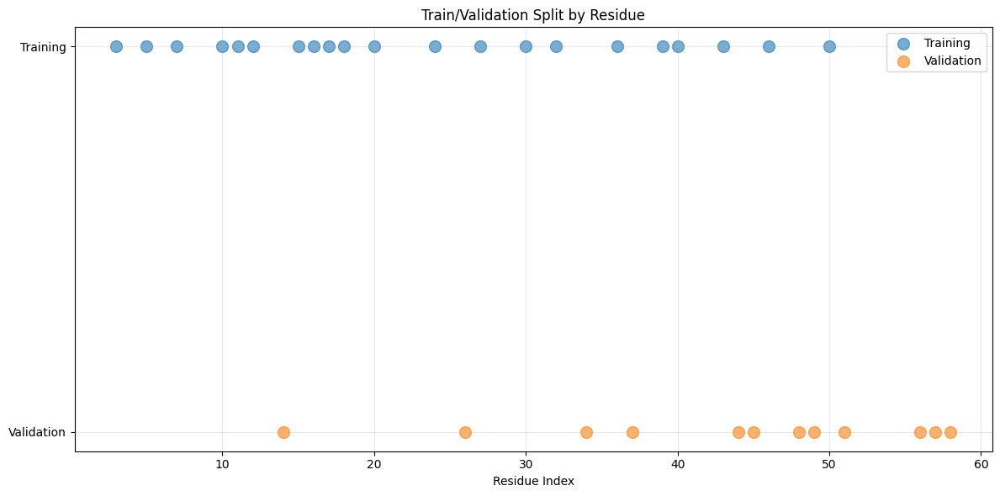

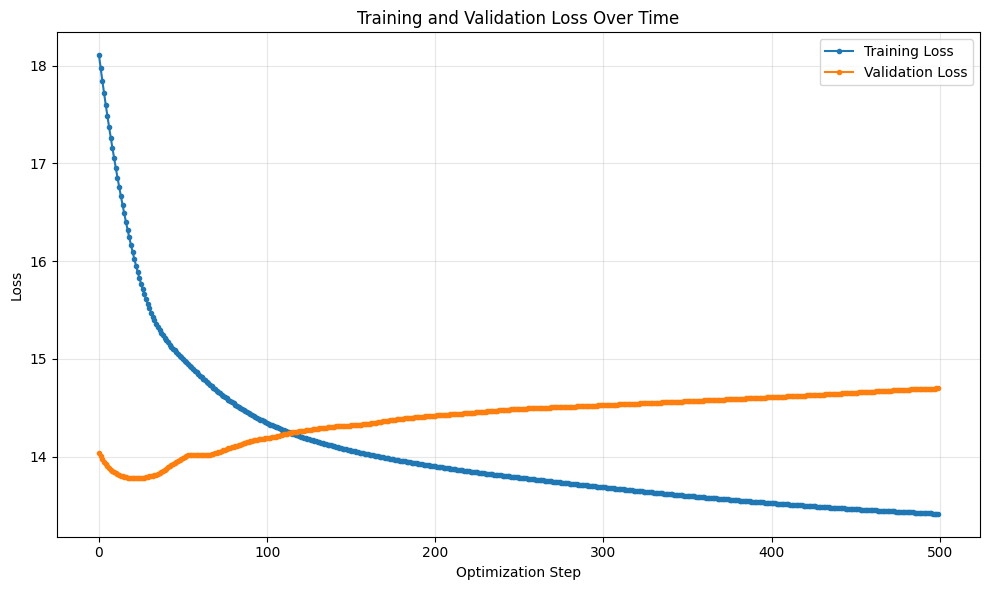

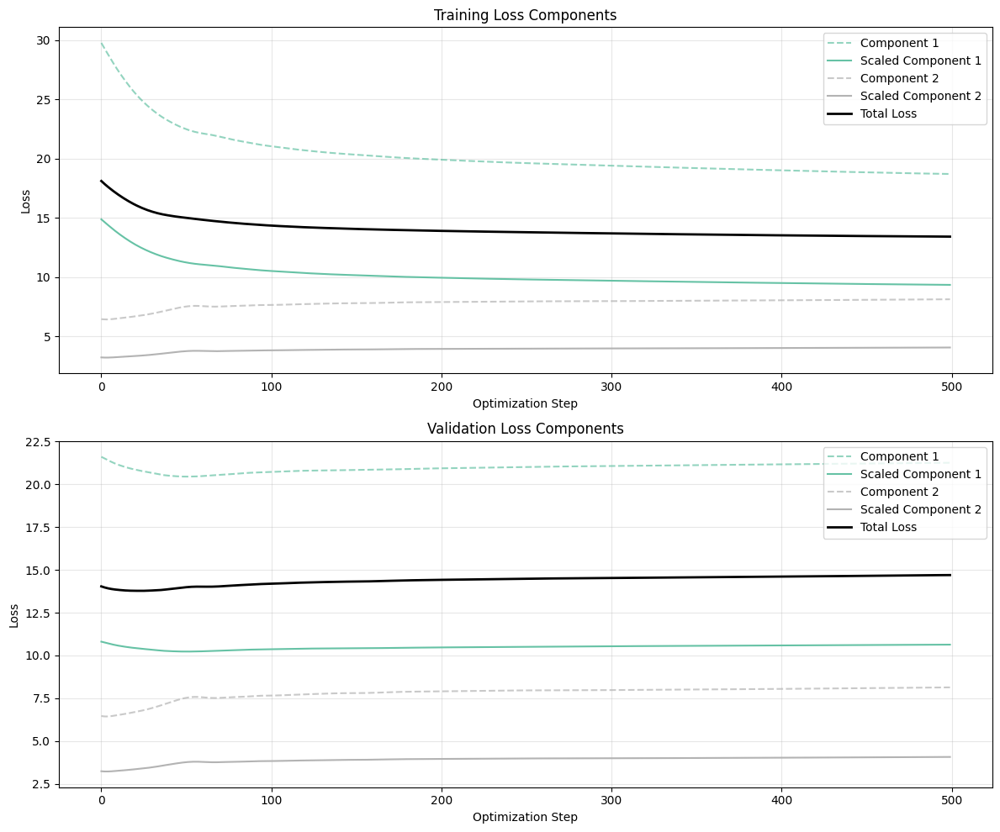

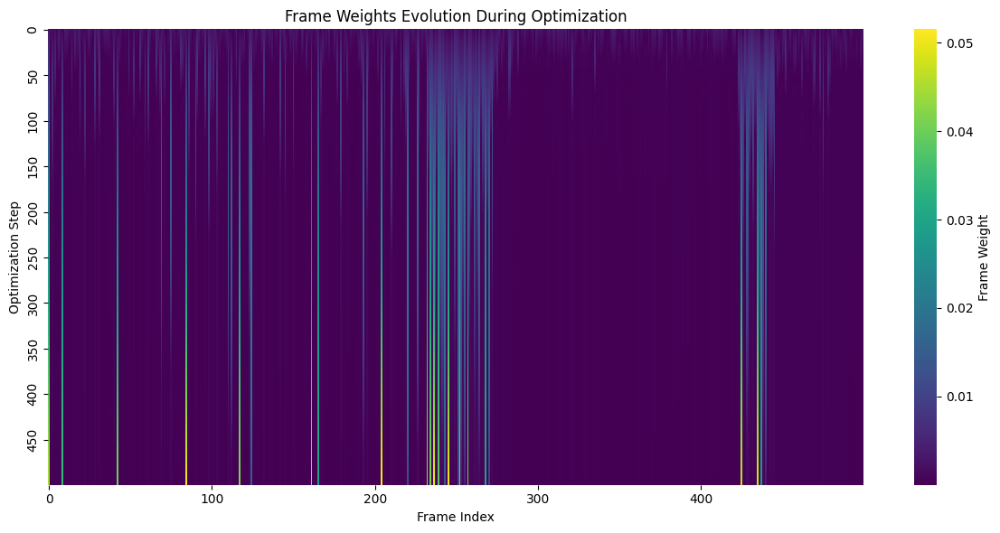

Simulation initialised successfully.
Running optimization for Dataset Seed 3/3, Replicate 4/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

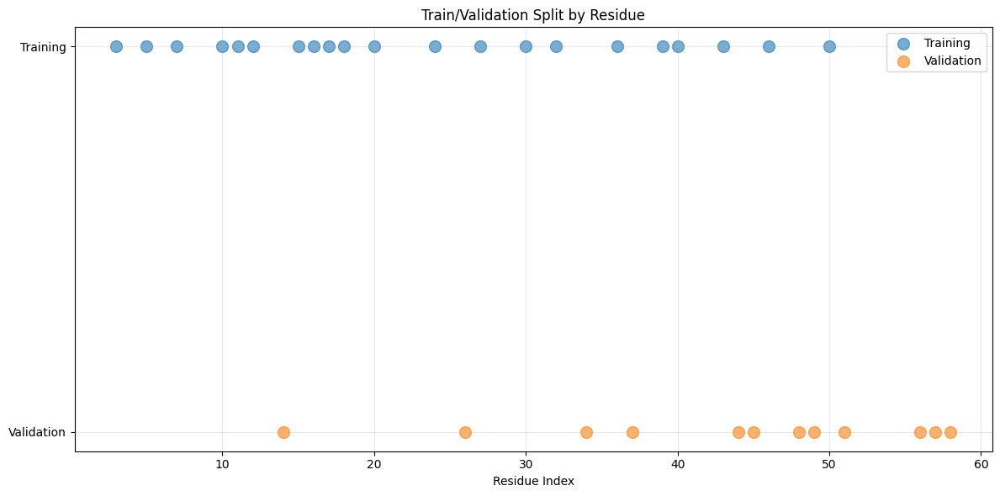

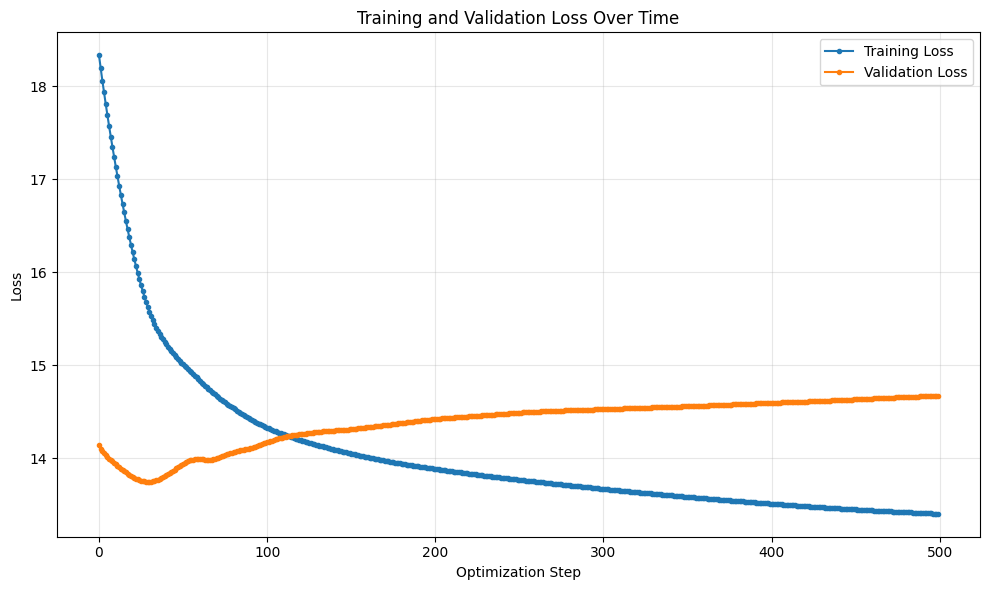

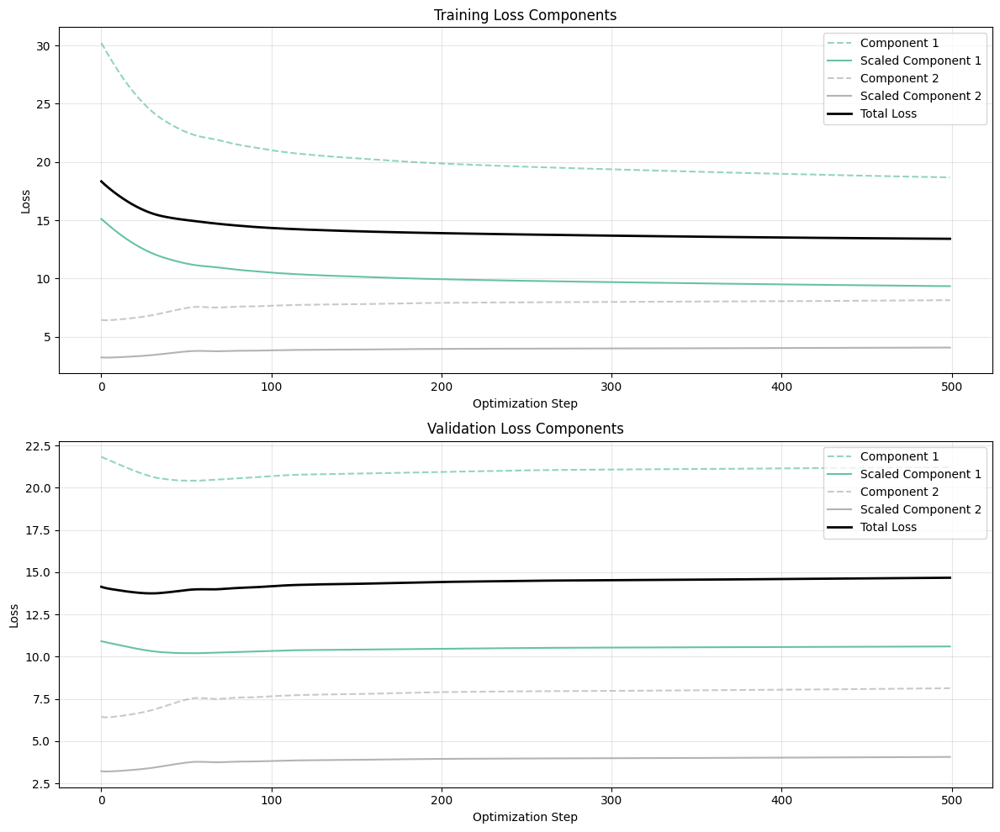

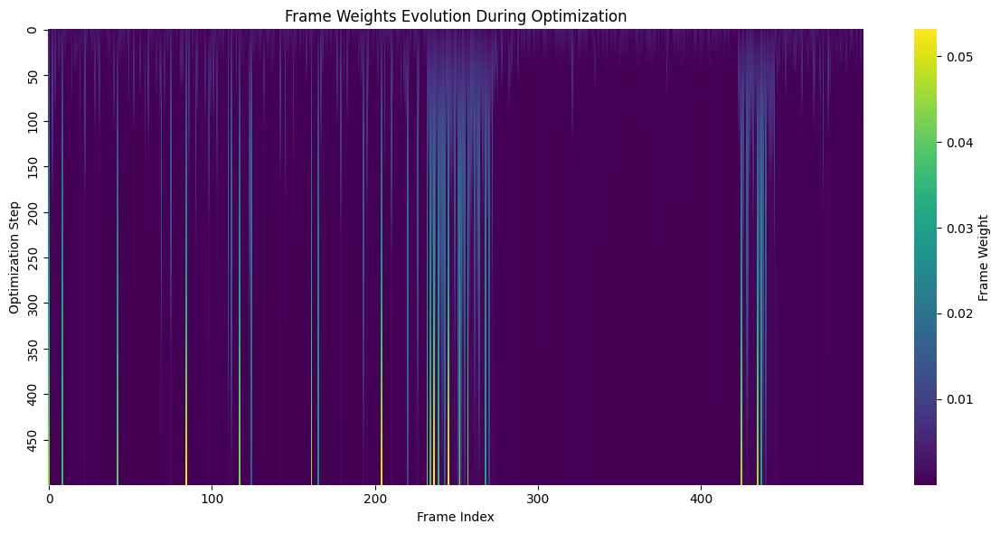

Simulation initialised successfully.
Running optimization for Dataset Seed 3/3, Replicate 5/5
Params structure: PyTreeDef(CustomNode(Simulation_Parameters[()], [*, *, [CustomNode(BV_Model_Parameters[()], [*, *, *])], *, *, *]))
{<Optimisable_Parameters.frame_weights: 0>}
Masks: frame=1.0, model=0.0, forward=0.0, frame_mask=0.0, scaling=0.0
Frame mask mask: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

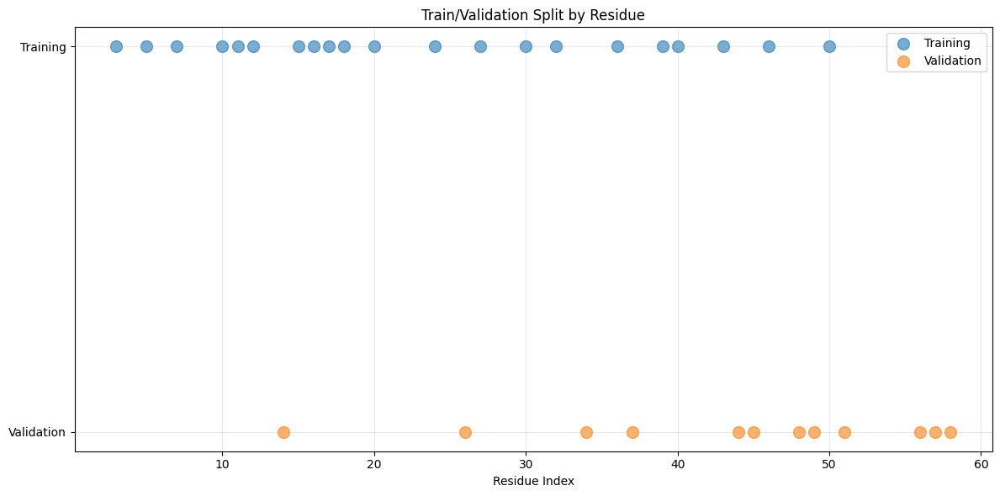

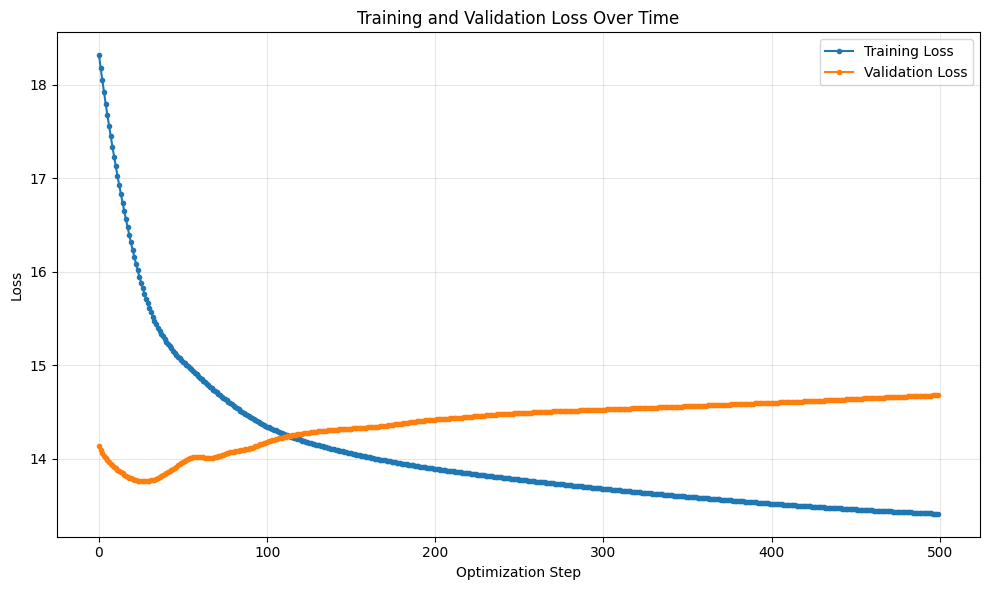

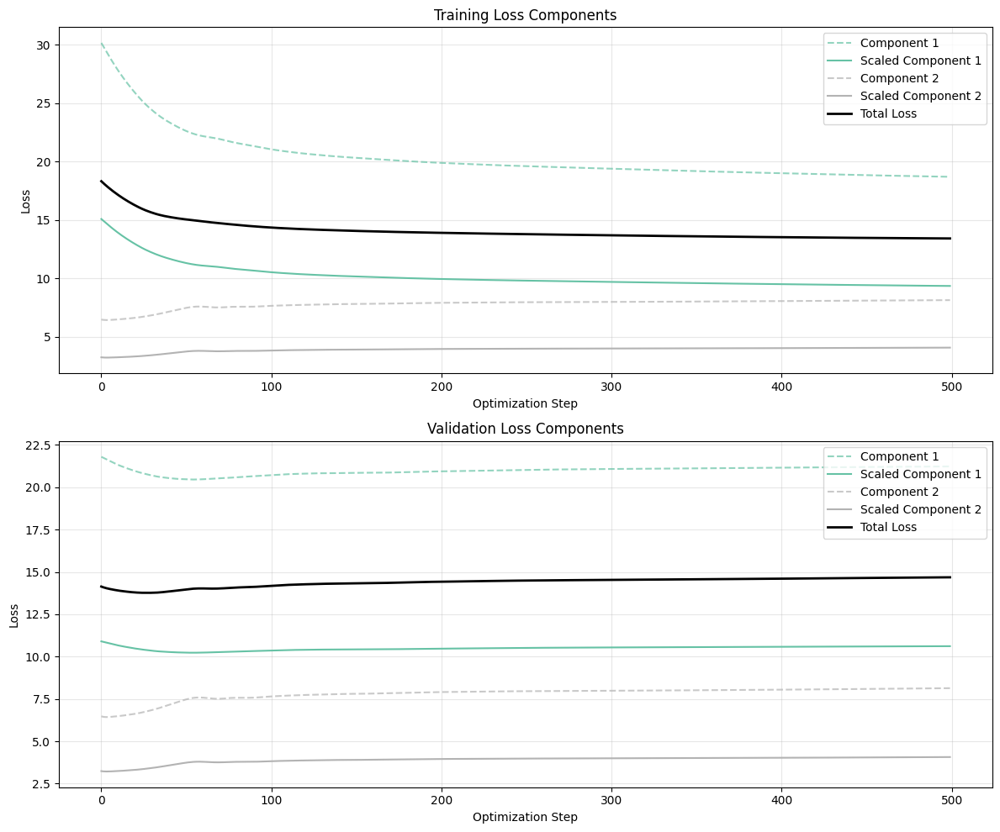

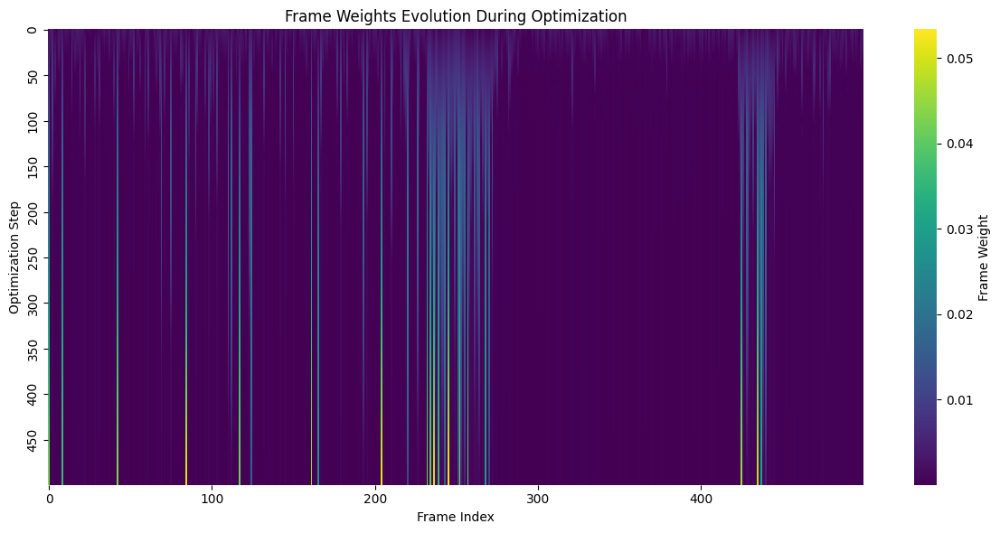

Computing test losses for Dataset Seed 1, Replicate 1


Replicate 1: 100%|██████████| 500/500 [00:36<00:00, 13.85it/s]


Computing test losses for Dataset Seed 1, Replicate 2


Replicate 2: 100%|██████████| 500/500 [00:33<00:00, 14.78it/s]


Computing test losses for Dataset Seed 1, Replicate 3


Replicate 3: 100%|██████████| 500/500 [00:32<00:00, 15.19it/s]


Computing test losses for Dataset Seed 1, Replicate 4


Replicate 4: 100%|██████████| 500/500 [00:34<00:00, 14.51it/s]


Computing test losses for Dataset Seed 1, Replicate 5


Replicate 5: 100%|██████████| 500/500 [00:33<00:00, 15.04it/s]


Computing test losses for Dataset Seed 2, Replicate 1


Replicate 1: 100%|██████████| 500/500 [00:33<00:00, 14.96it/s]


Computing test losses for Dataset Seed 2, Replicate 2


Replicate 2: 100%|██████████| 500/500 [00:34<00:00, 14.59it/s]


Computing test losses for Dataset Seed 2, Replicate 3


Replicate 3: 100%|██████████| 500/500 [00:32<00:00, 15.29it/s]


Computing test losses for Dataset Seed 2, Replicate 4


Replicate 4: 100%|██████████| 500/500 [00:32<00:00, 15.22it/s]


Computing test losses for Dataset Seed 2, Replicate 5


Replicate 5: 100%|██████████| 500/500 [00:32<00:00, 15.30it/s]


Computing test losses for Dataset Seed 3, Replicate 1


Replicate 1: 100%|██████████| 500/500 [00:33<00:00, 14.96it/s]


Computing test losses for Dataset Seed 3, Replicate 2


Replicate 2: 100%|██████████| 500/500 [00:33<00:00, 15.11it/s]


Computing test losses for Dataset Seed 3, Replicate 3


Replicate 3: 100%|██████████| 500/500 [00:32<00:00, 15.24it/s]


Computing test losses for Dataset Seed 3, Replicate 4


Replicate 4: 100%|██████████| 500/500 [00:33<00:00, 14.83it/s]


Computing test losses for Dataset Seed 3, Replicate 5


Replicate 5: 100%|██████████| 500/500 [00:32<00:00, 15.31it/s]


In [ ]:
me_optimization_results = run_max_ent_optimization_replicates(simulation, datasets, models, opt_settings, n_replicates)
me_test_losses = compute_test_losses(me_optimization_results, datasets)


Generating PCA visualization...


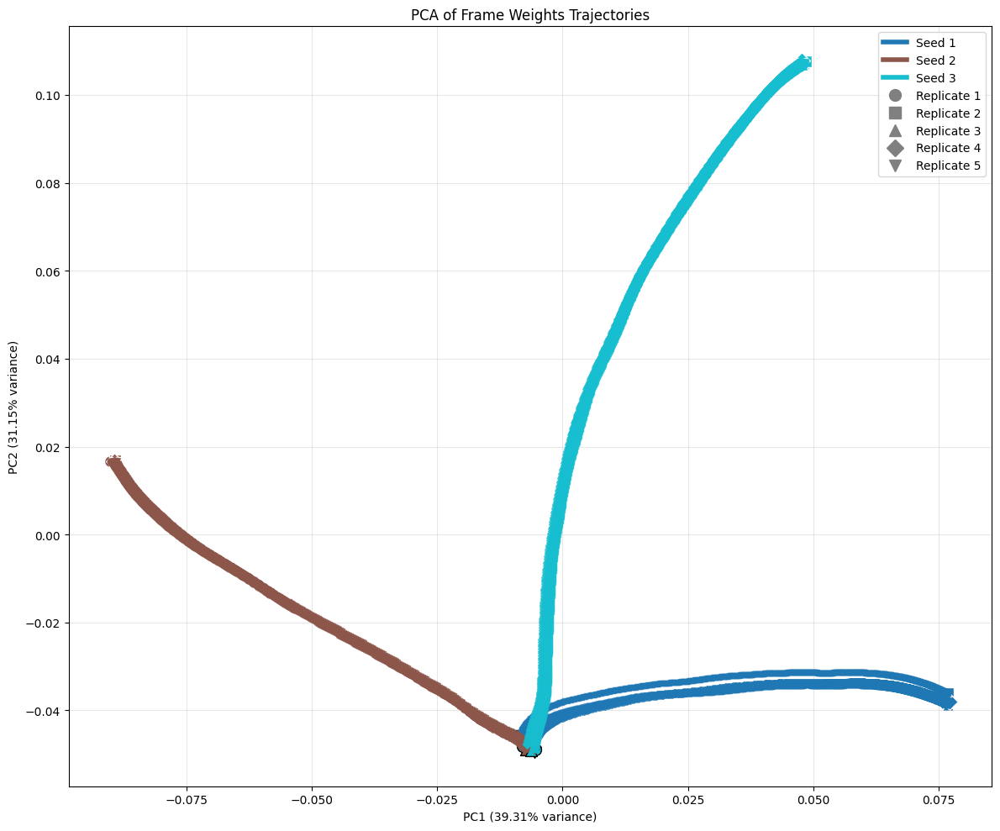

In [ ]:

# Visualize PCA trajectories
print("Generating PCA visualization...")
pca_fig = visualize_pca_trajectories(me_optimization_results, n_seeds, n_replicates)
# save_pca_visualization(pca_fig)
plt.show()

Generating 3D t-SNE visualization with residue-average test loss...


/Users/alexi/JAX-ENT/.venv/lib/python3.13/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


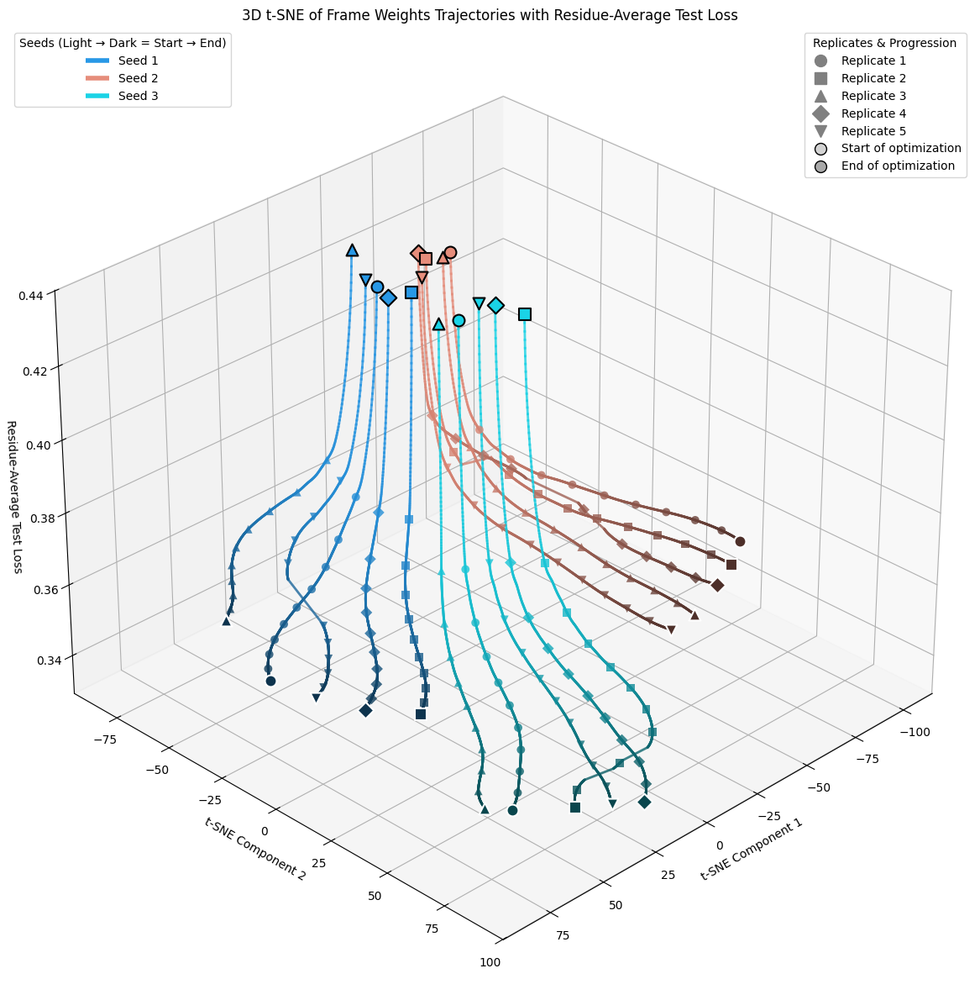

In [ ]:

print("Generating 3D t-SNE visualization with residue-average test loss...")
tsne3d_fig = visualize_tsne_3d_loss(me_optimization_results, me_test_losses, n_seeds, n_replicates)
plt.show()

In [19]:

# Function to run optimization for each dataset seed and replicate
def run_MAE_max_ent_optimization_replicates(simulation, datasets, models, opt_settings, n_replicates):
    """
    Runs optimization for each dataset and replicate with randomized frame weights.
    
    Parameters:
    -----------
    simulation : Simulation
        Simulation object
    datasets : list
        List of dataset objects
    models : list
        List of forward model objects
    opt_settings : OptimiserSettings
        Optimization settings
    n_replicates : int
        Number of replicates per dataset
        
    Returns:
    --------
    results : dict
        Dictionary of optimization results for each dataset and replicate
    """
    results = {}
    rng_key = jax.random.PRNGKey(0)

    prior_params = simulation.params
    
    for i, dataset in enumerate(datasets):
        seed_results = []
        
        for j in range(n_replicates):
            try:
                # Generate a new random key for each replicate
                rng_key, subkey = jax.random.split(rng_key)
                
                # Get the trajectory length from simulation
                trajectory_length = simulation.input_features[0].features_shape[2]
                
                # Randomize frame weights
                random_weights = jax.random.uniform(subkey, shape=(trajectory_length,))
                random_weights = simulation.params.frame_weights + random_weights
                random_weights = random_weights / jnp.sum(random_weights)  # Normalize
                
                # Create new parameters with random weights, preserving all other values
                new_params = Simulation_Parameters(
                    frame_weights=random_weights,
                    frame_mask=simulation.params.frame_mask,
                    model_parameters=simulation.params.model_parameters,
                    forward_model_weights=jnp.array([1,5*(j+1),1],dtype=jnp.float32),
                    forward_model_scaling=jnp.array([1.0,1.0,1.0],dtype=jnp.float32),
                    normalise_loss_functions=jnp.array([0.0,0.0,0.0],dtype=jnp.float32),
                )
                
                # Create a new simulation with the updated parameters
                new_simulation = Simulation(
                    forward_models=simulation.forward_models,
                    input_features=simulation.input_features,
                    params=new_params
                )
                new_simulation.initialise()
                
                new_simulation.forward(new_params)

                test_prediction = new_simulation.outputs

                pf_prior = [
                    HDX_protection_factor(protection_factor=pf, top=top)
                    for pf, top in zip(test_prediction[0].log_Pf, top_segments)
                ]

                pf_prior_data = Experimental_Dataset(data=pf_prior)

                prior_splitter = DataSplitter(pf_prior_data, random_seed=42, ensemble=universes)
                prior_train_data, prior_val_data = prior_splitter.random_split()

                prior_train_sparse_map = create_sparse_map(features[0], feature_topology[0], prior_train_data)

                prior_val_sparse_map = create_sparse_map(features[0], feature_topology[0], prior_val_data)

                pf_prior_data.train = Dataset(
                    data=prior_train_data,
                    y_true=jnp.array([data.extract_features() for data in prior_train_data]),
                    residue_feature_ouput_mapping=prior_train_sparse_map,
                )

                pf_prior_data.val = Dataset(
                    data=prior_val_data,
                    y_true=jnp.array([data.extract_features() for data in prior_val_data]),
                    residue_feature_ouput_mapping=prior_val_sparse_map,
                )
                optimiser = OptaxOptimizer(parameter_masks={Optimisable_Parameters.frame_weights})
                # Run optimization
                print(f"Running optimization for Dataset Seed {i+1}/{len(datasets)}, Replicate {j+1}/{n_replicates}")
                opt_result = run_optimise(
                    new_simulation,
                    optimizer=optimiser,
                    data_to_fit=(dataset,prior_params,pf_prior_data),
                    config=opt_settings,
                    forward_models=models,
                    indexes=[0, 0, 0],
                    loss_functions=[hdx_pf_l2_loss, max_entropy_loss, hdx_pf_mae_loss],
                )
                
                # Store the result
                seed_results.append(opt_result)
                
                # Visualize this optimization run
                print(f"Visualizing results for Dataset Seed {i+1}/{len(datasets)}, Replicate {j+1}/{n_replicates}")
                visualize_optimization_results(
                    dataset.train.data, 
                    dataset.val.data, 
                    dataset.test.data, 
                    opt_result
                )
            except Exception as e:
                print(f"Error in Dataset Seed {i+1}, Replicate {j+1}: {e}")
                # Add a placeholder for failed runs to maintain indexing
                seed_results.append(None)
        
        results[f"seed_{i}"] = seed_results
    
    return results

In [33]:
bv_config = BV_model_Config()
opt_settings = OptimiserSettings(name="test", n_steps=500, learning_rate=1e-3, convergence=1e-5)

featuriser_settings = FeaturiserSettings(name="BV", batch_size=None)

topology_path = "/Users/alexi/JAX-ENT/tests/inst/clean/HOIP/train_HOIP_max_plddt_1/HOIP_apo697_1_af_sample_127_10000_protonated_max_plddt_1969.pdb"
topology_path = "/Users/alexi/JAX-ENT/tests/inst/clean/BPTI/BPTI_overall_combined_stripped.pdb"
# trajectory_path = "/Users/alexi/JAX-ENT/tests/inst/clean/BPTI/BPTI_sampled_500.xtc"
topology_path = "/Users/alexi/JAX-ENT/tests/inst/clean/BPTI/BPTI_overall_combined_stripped.pdb"
trajectory_path = "/Users/alexi/JAX-ENT/tests/inst/clean/BPTI/BPTI_sampled_500.xtc"
test_universe = Universe(topology_path, trajectory_path)

universes = [test_universe]

models = [BV_model(bv_config)]

ensemble = Experiment_Ensemble(universes, models)

features, feature_topology = run_featurise(ensemble, featuriser_settings)
top_segments = find_common_residues(
    universes, ignore_mda_selection="(resname PRO or resid 1) "
)[0]

Initialising <jaxent.src.forwardmodels.models.BV_model object at 0x34aedc9e0>


Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

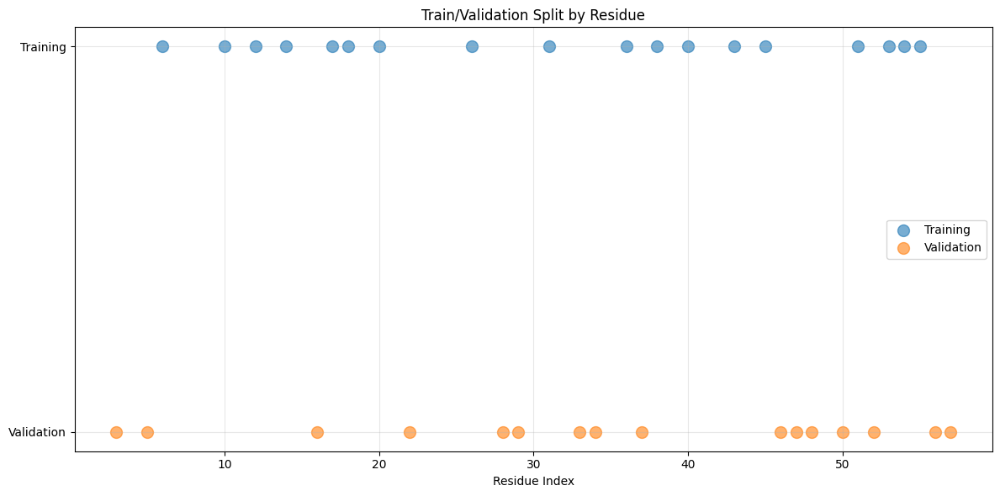

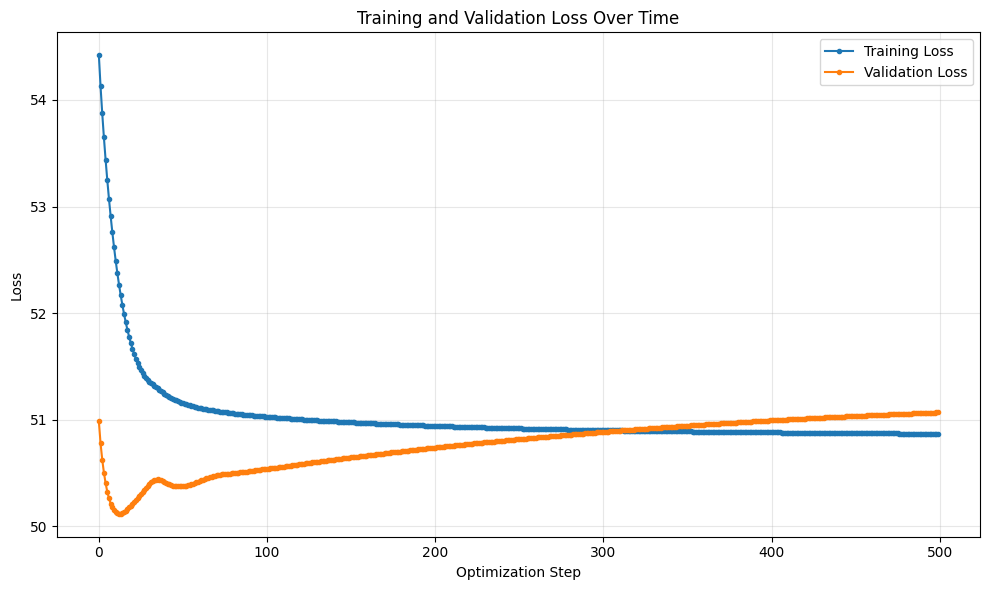

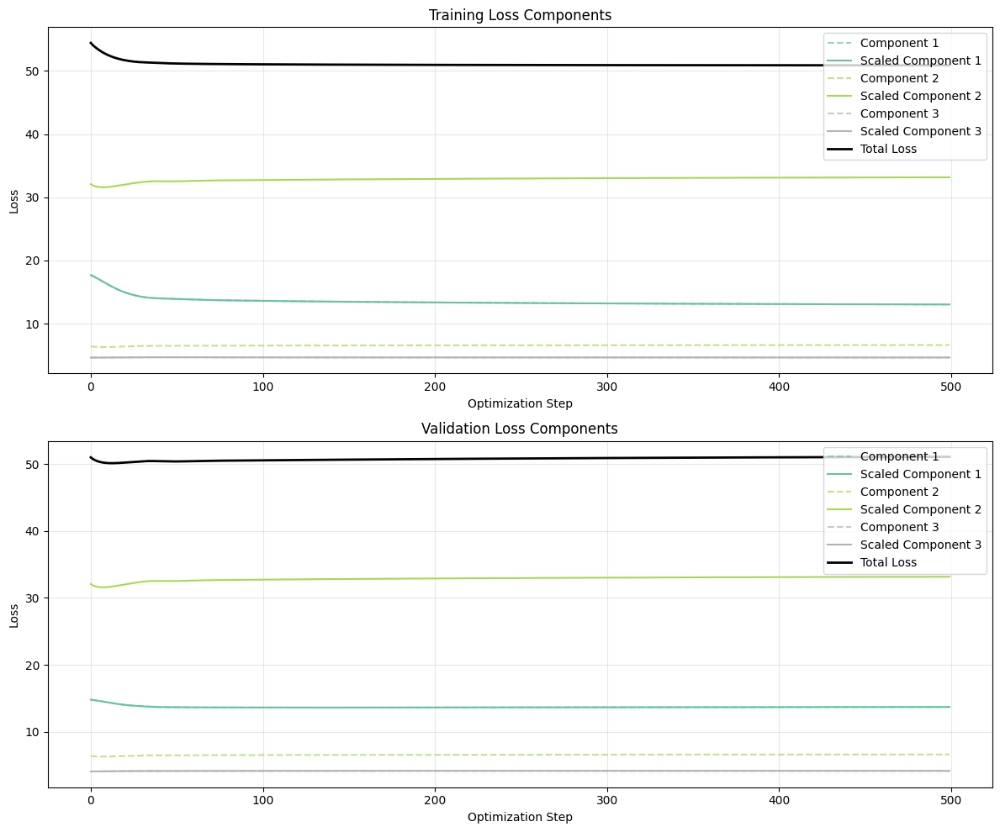

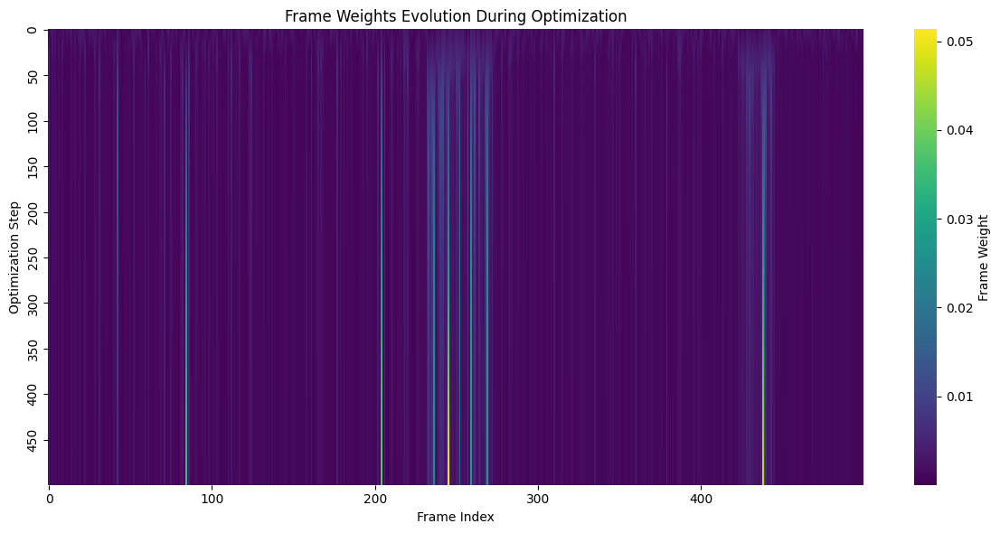

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

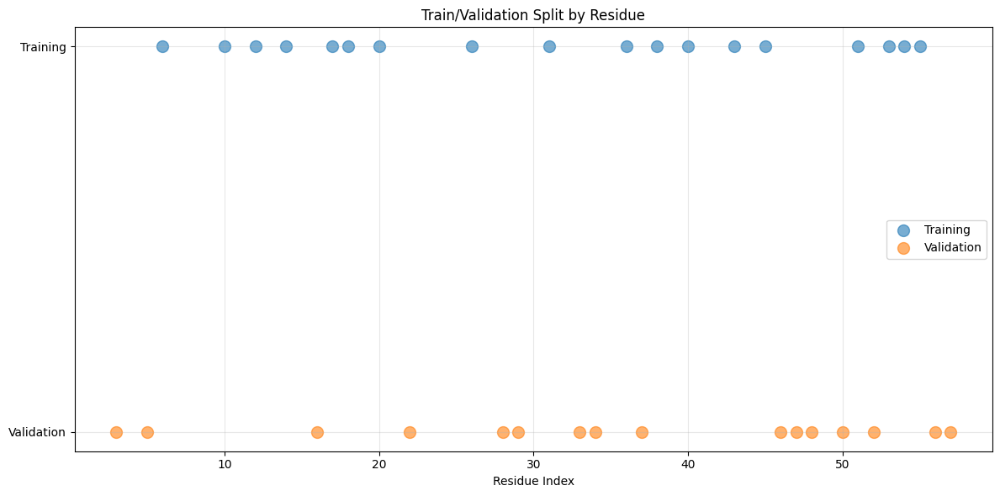

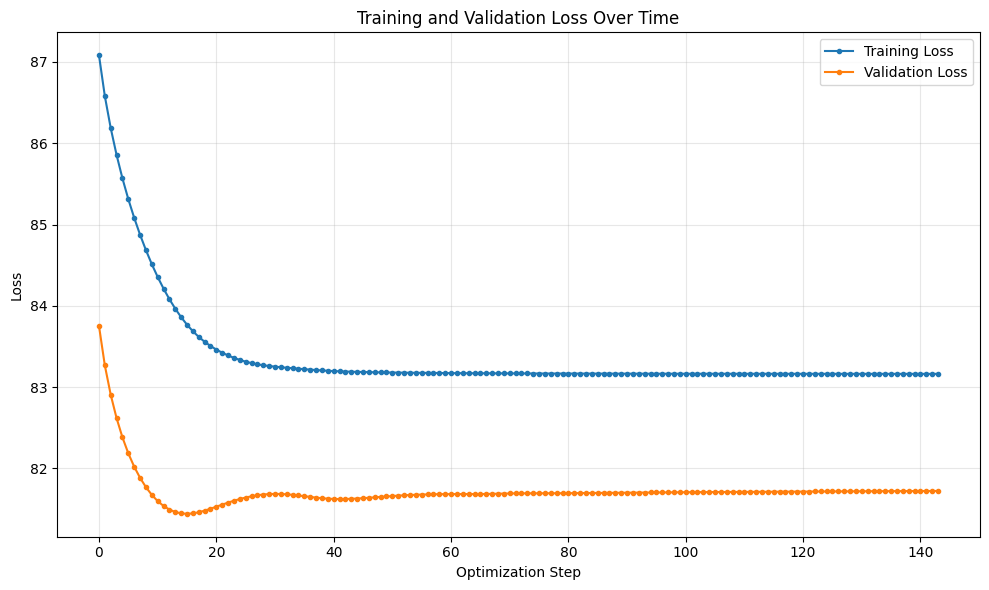

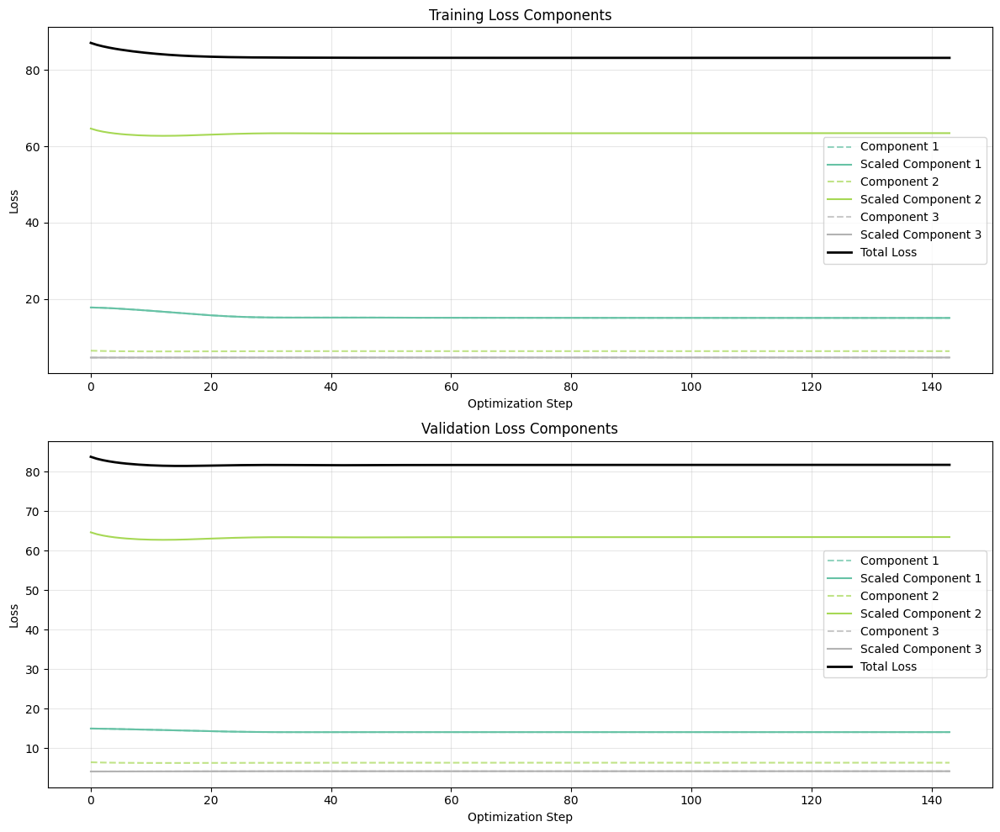

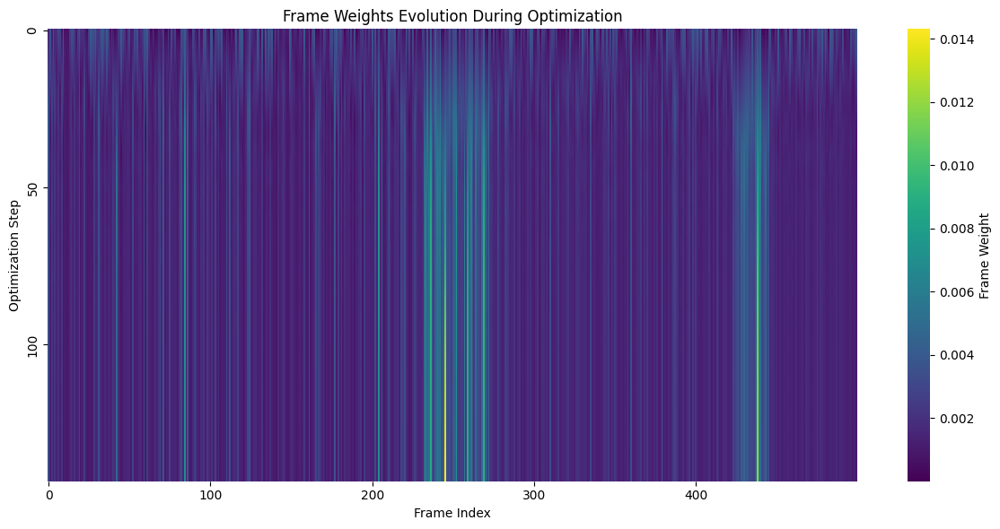

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

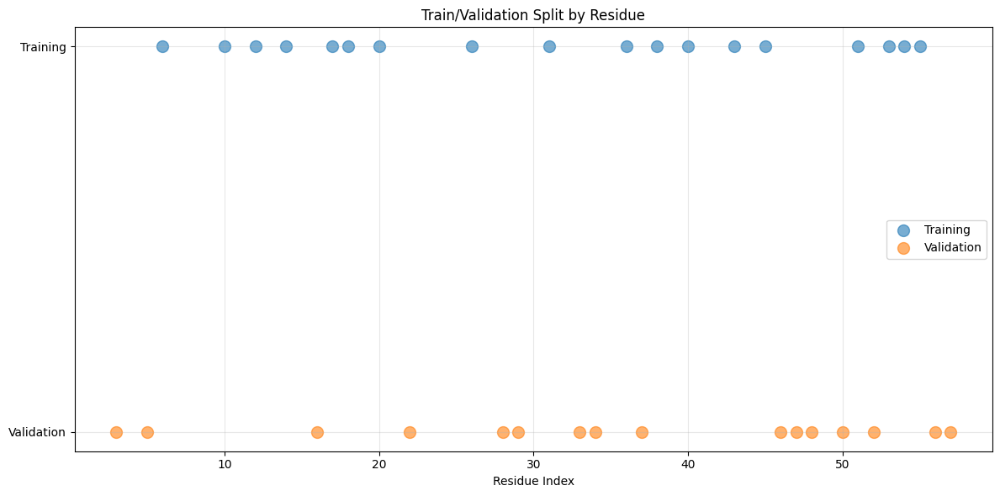

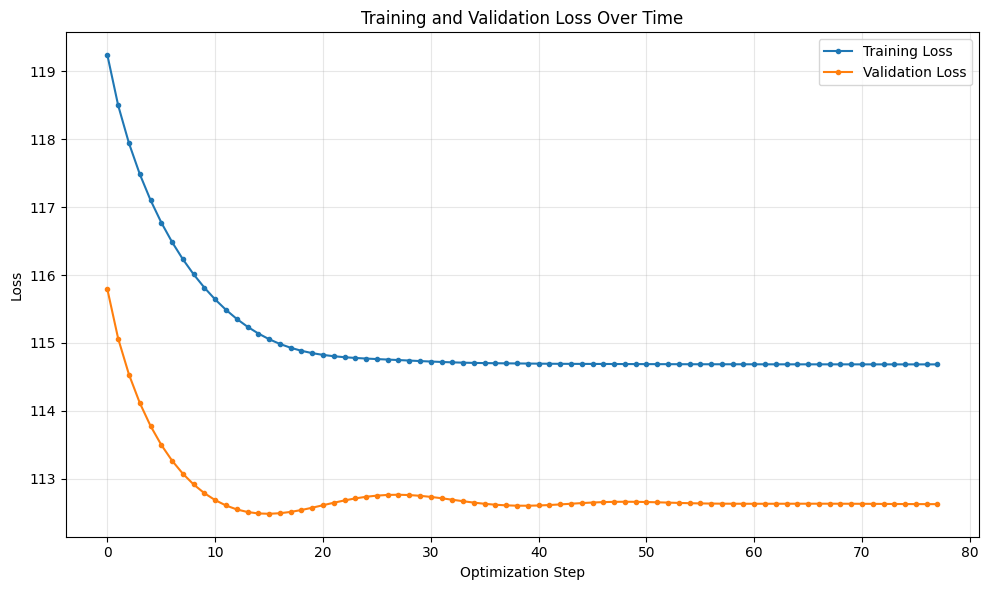

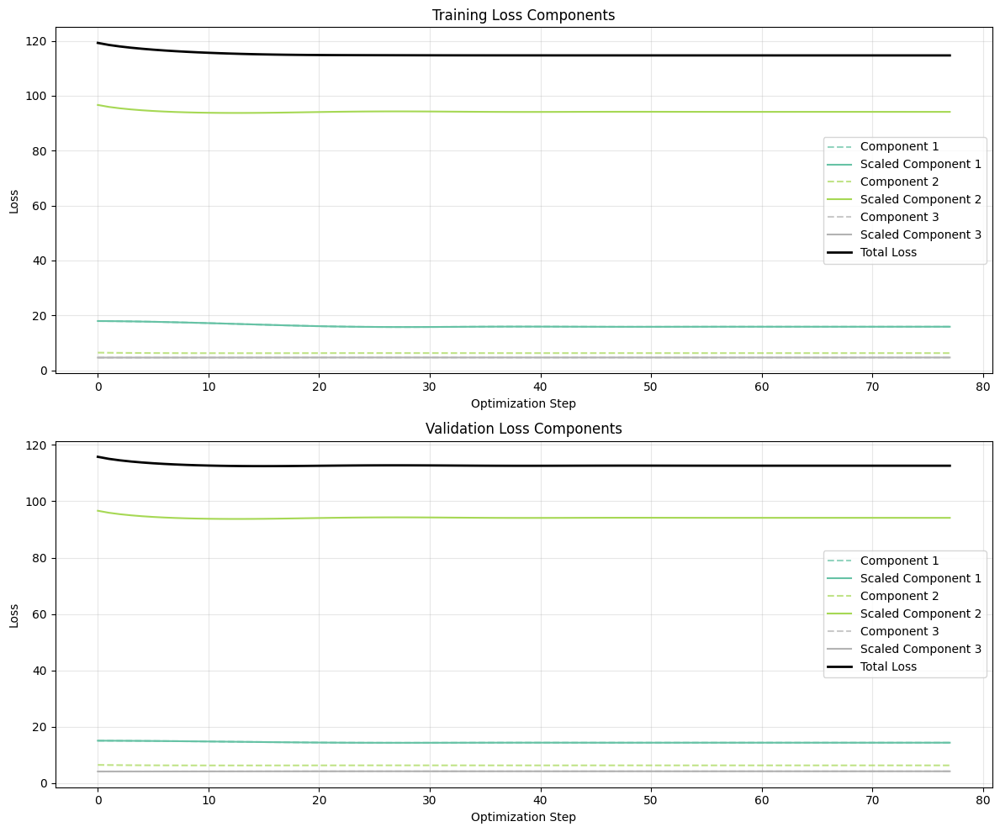

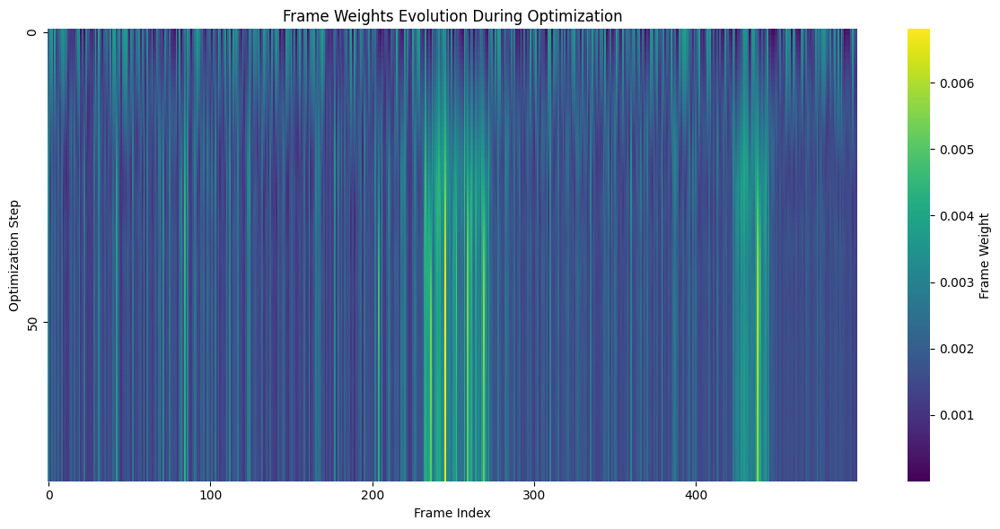

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

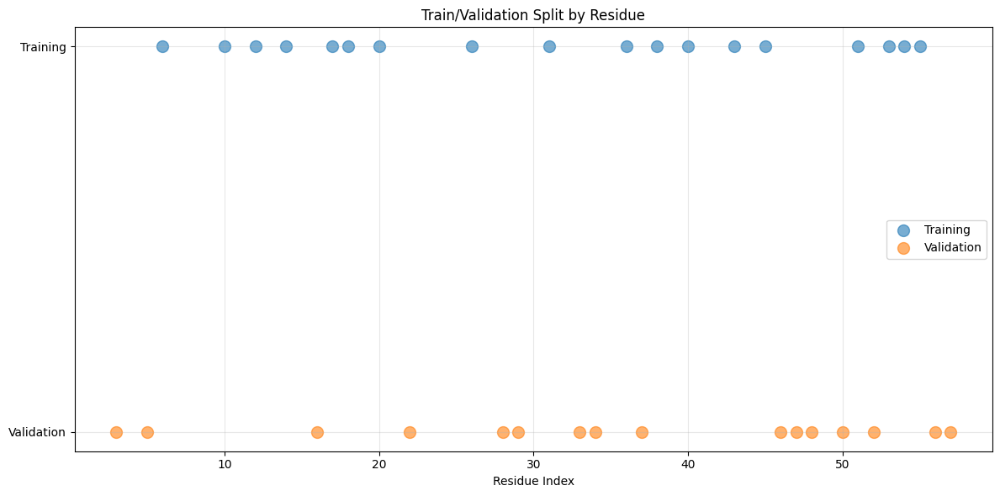

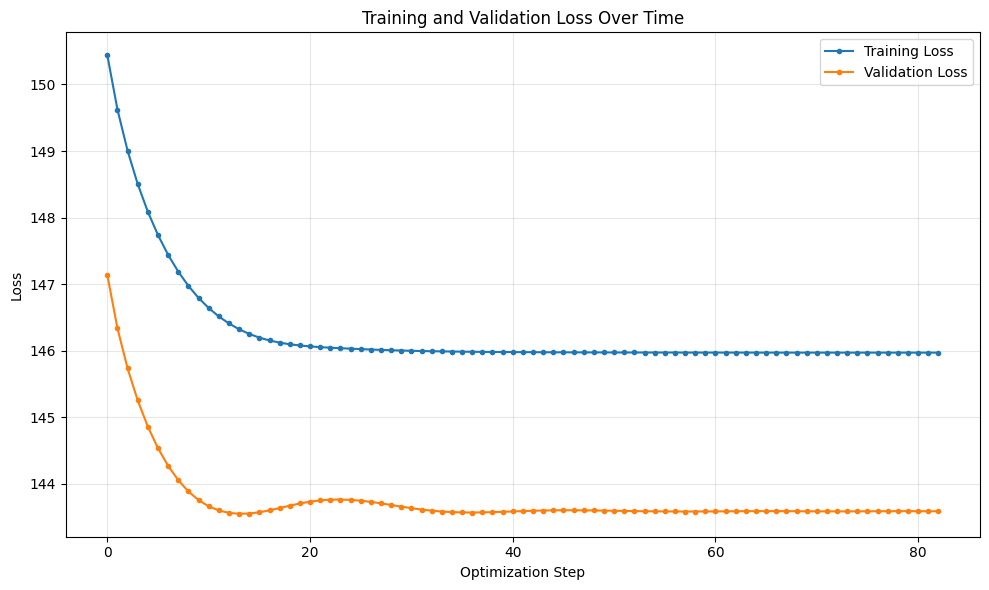

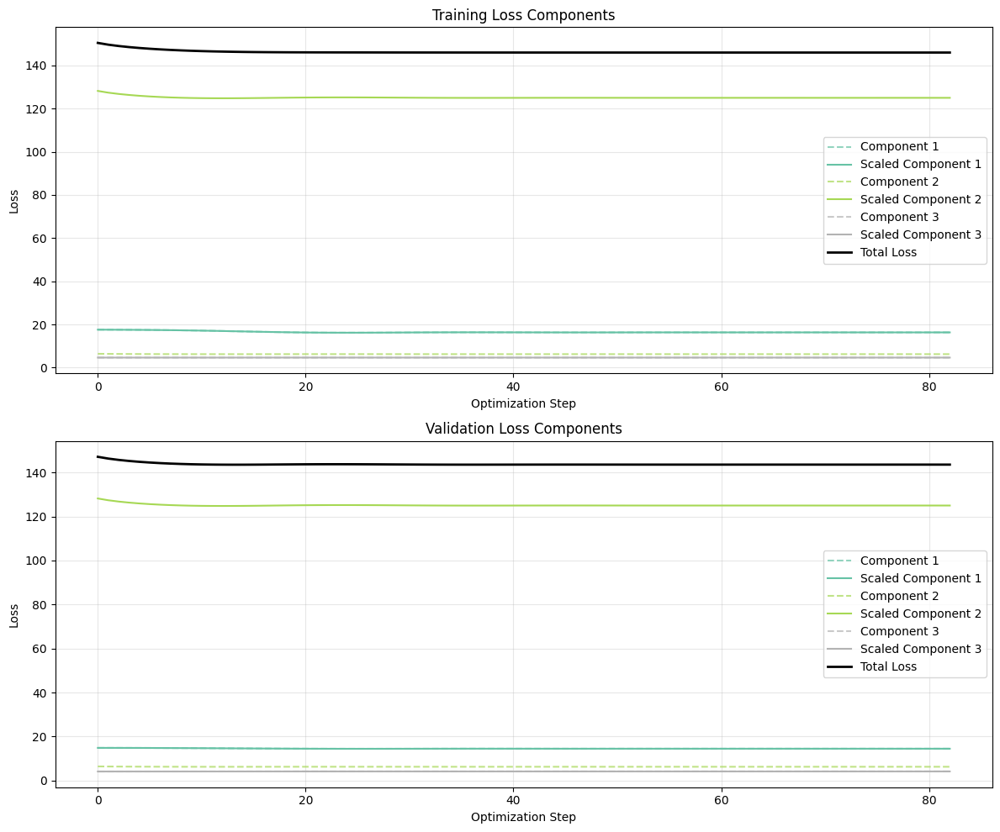

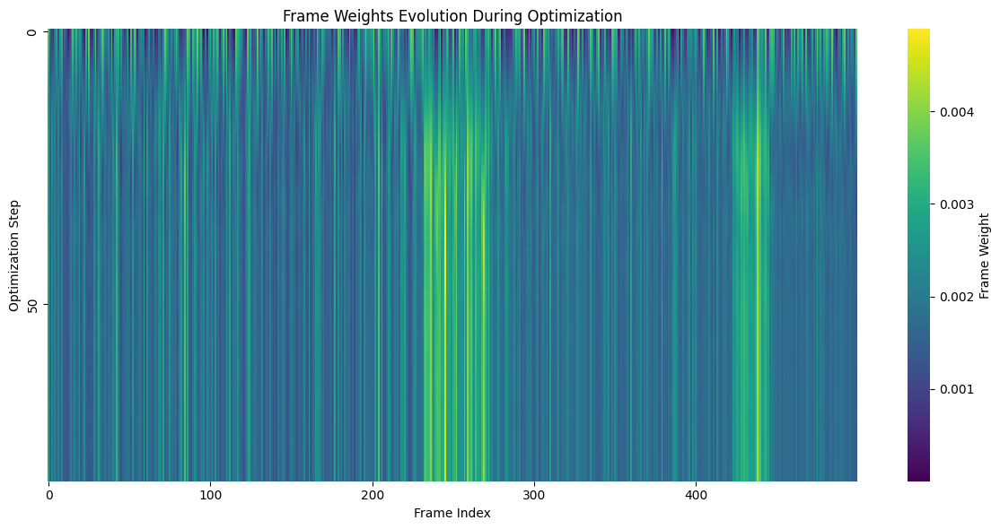

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

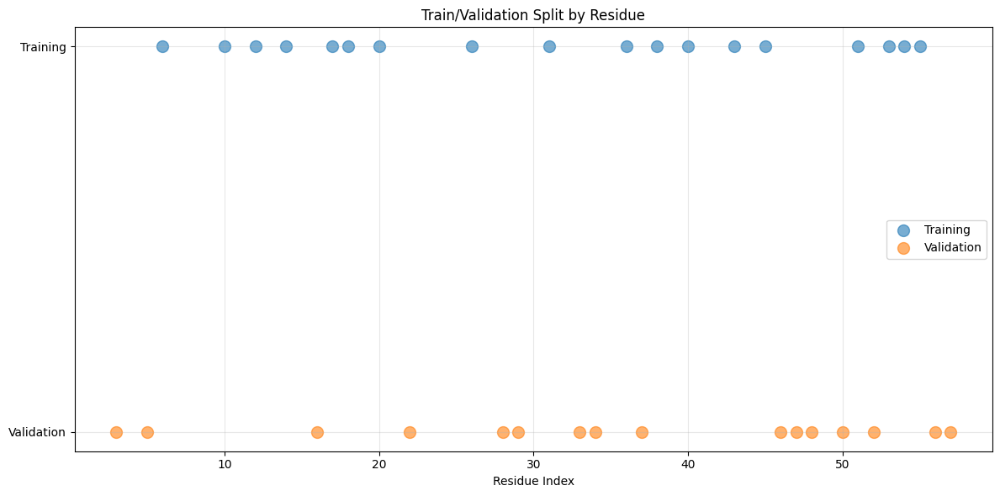

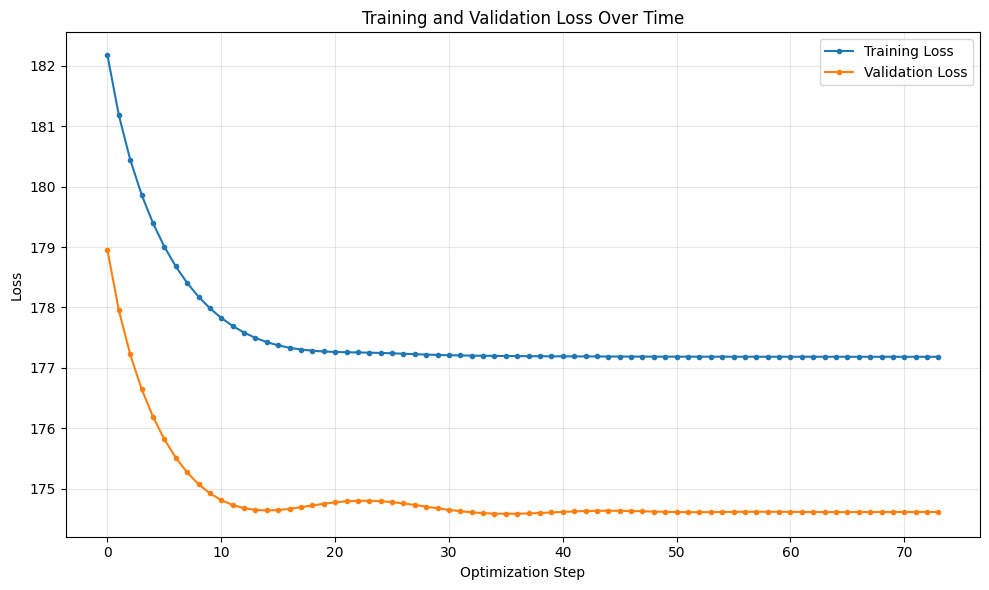

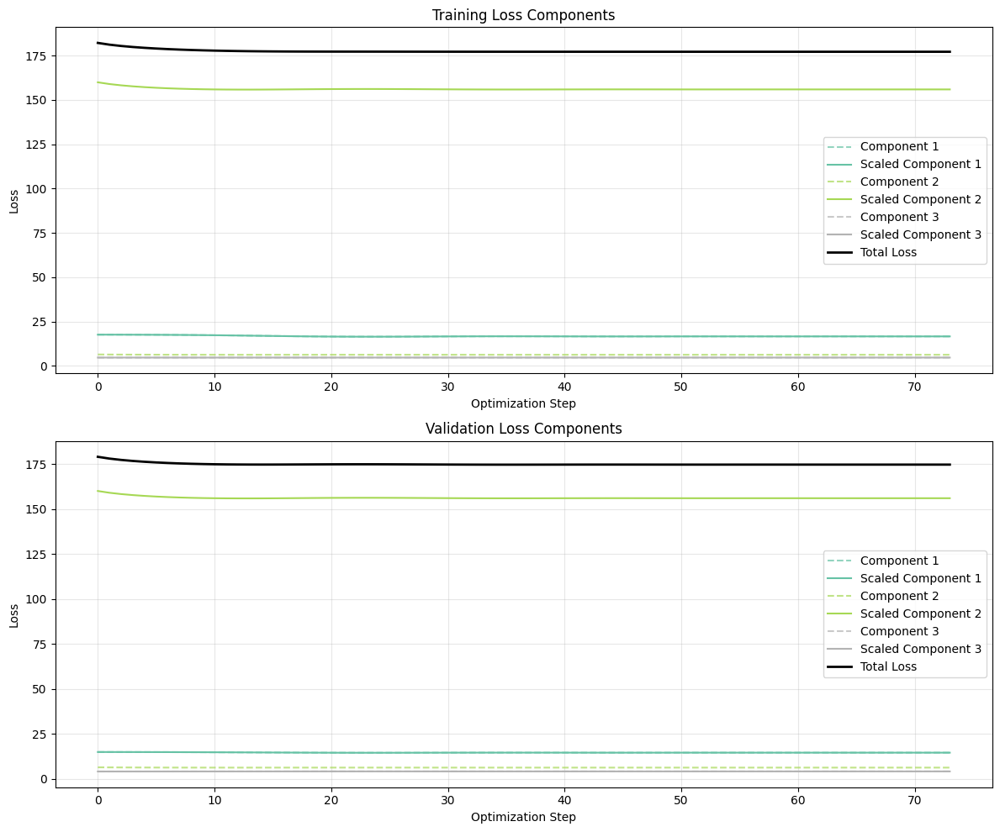

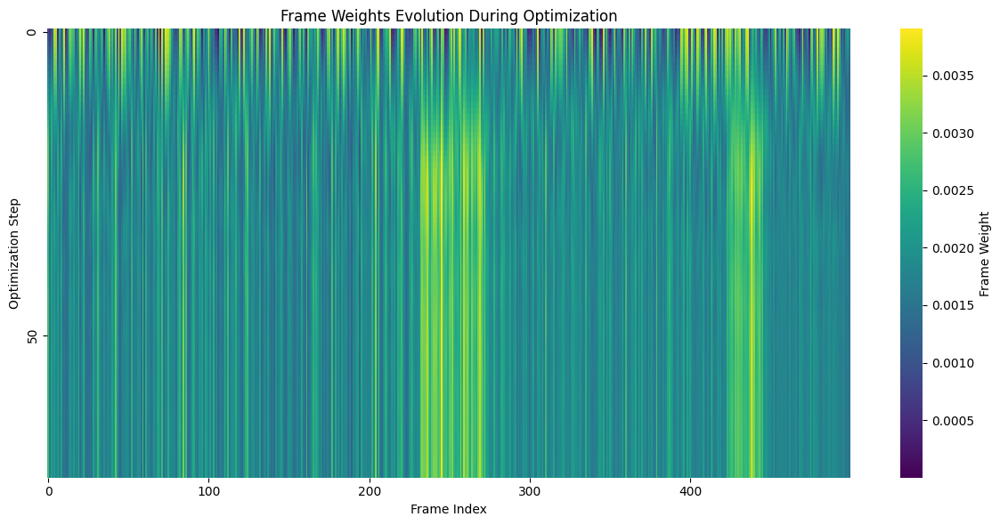

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

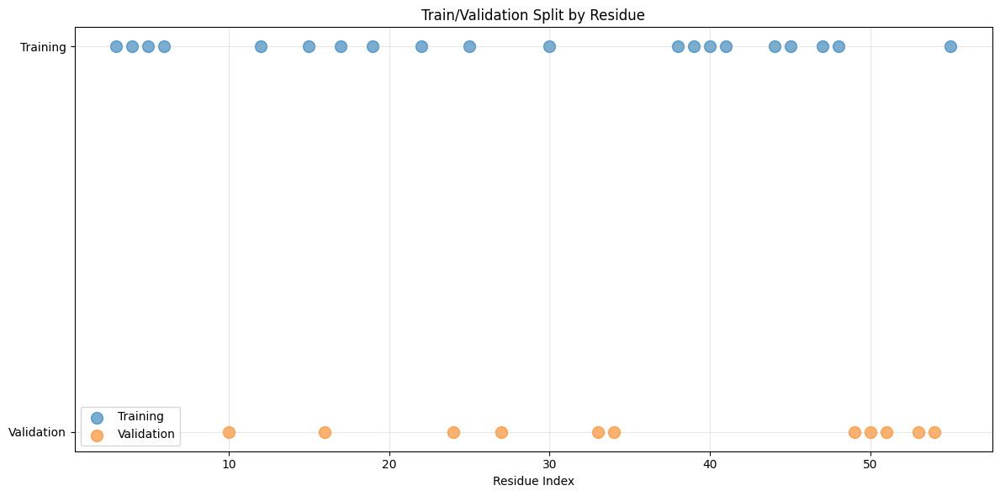

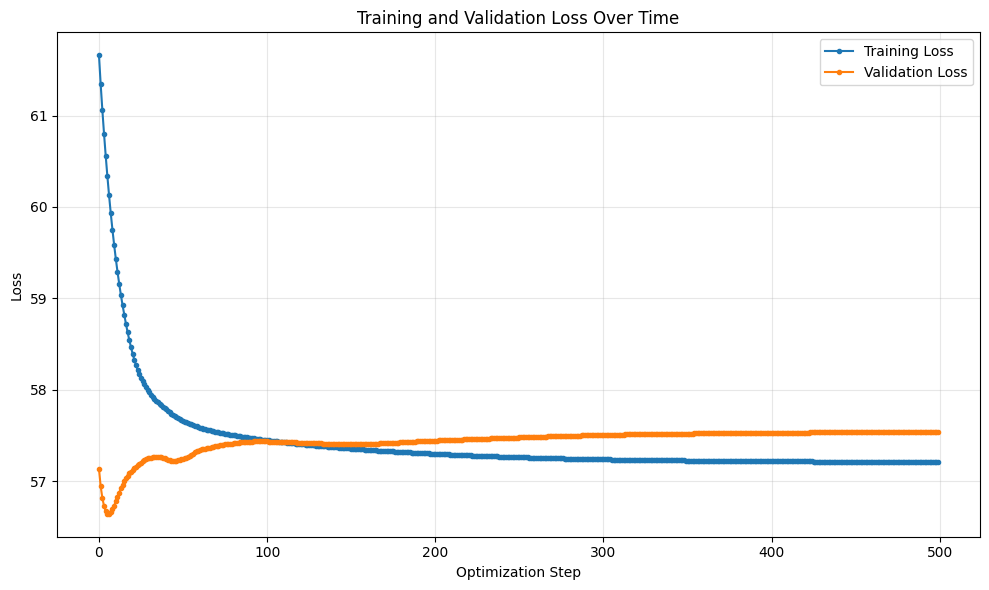

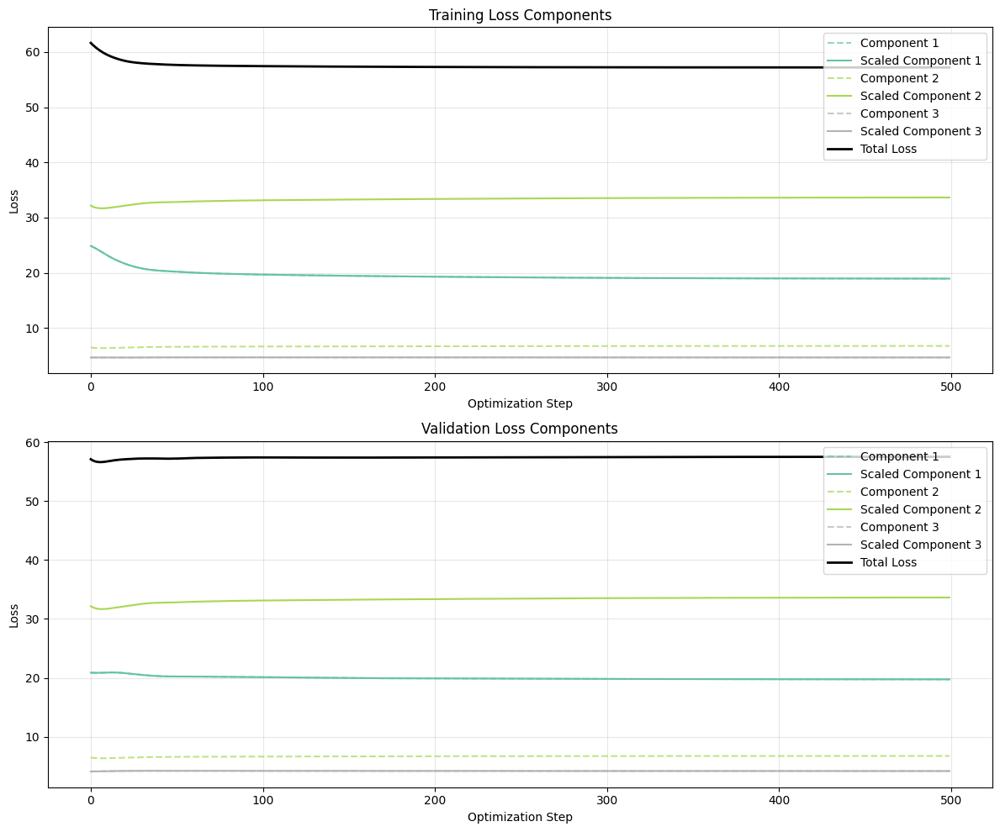

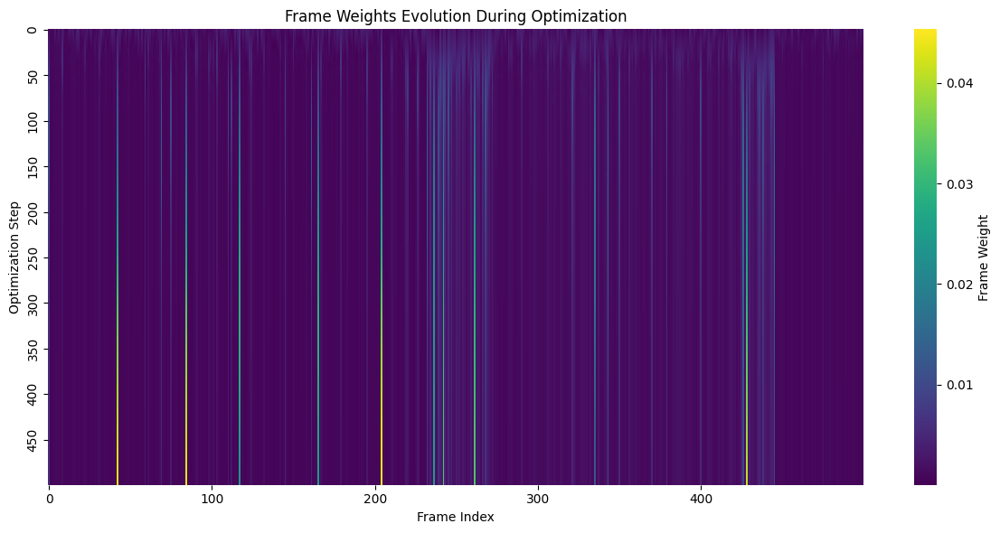

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

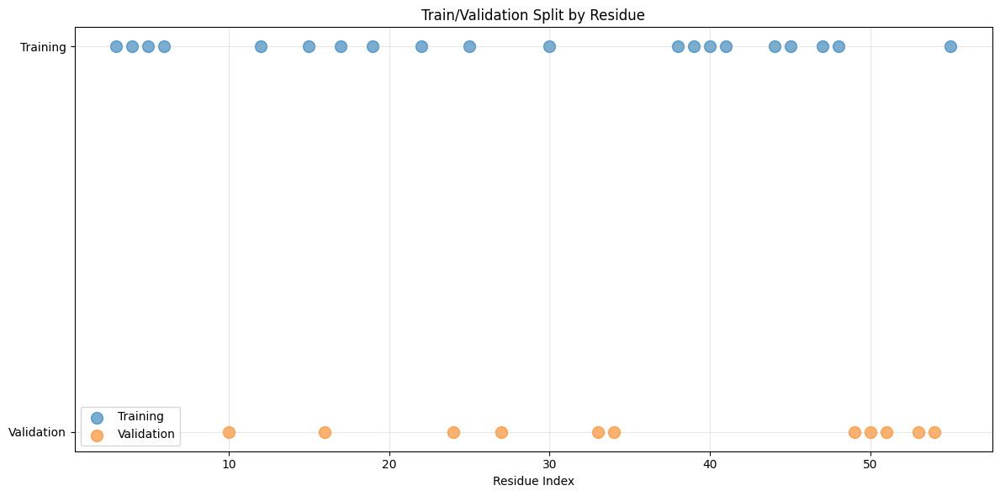

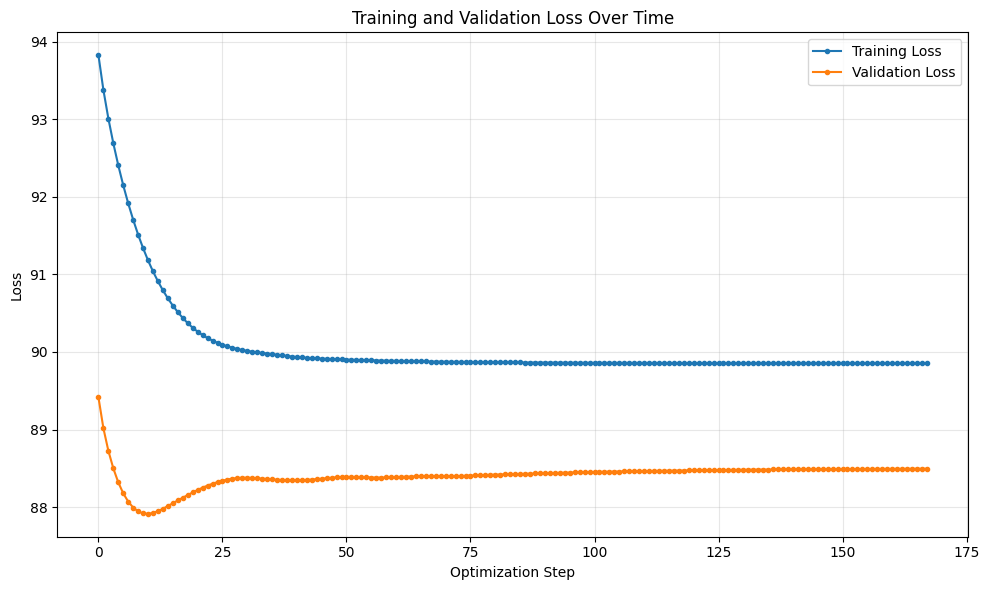

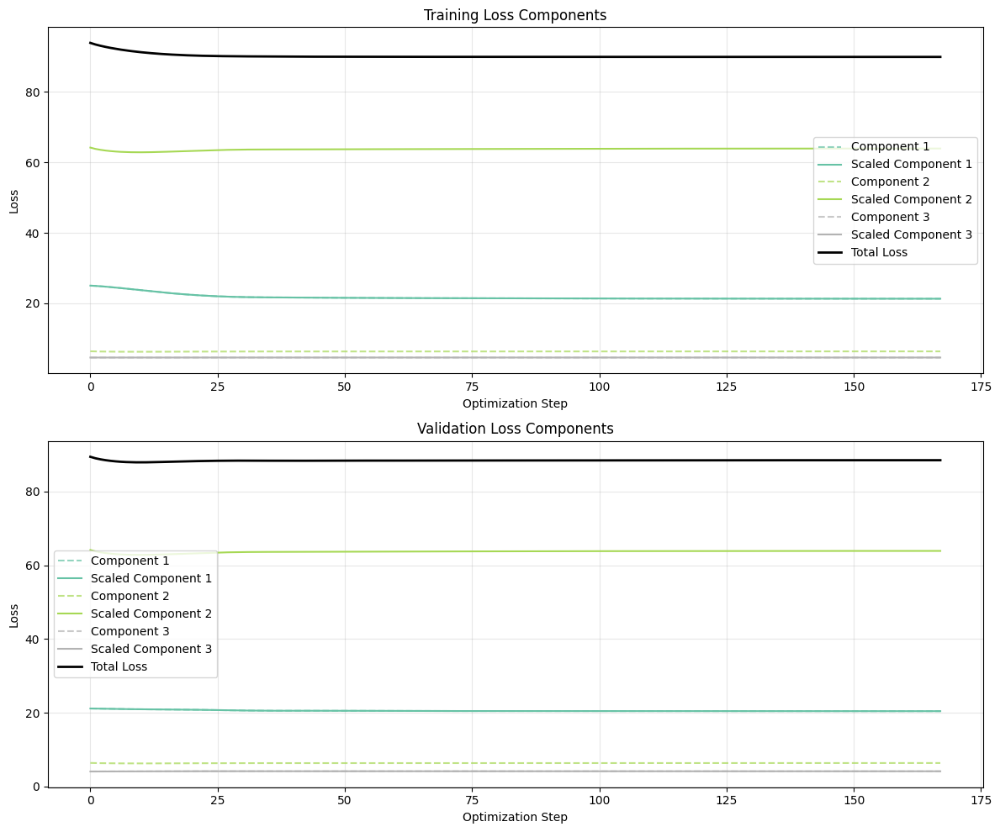

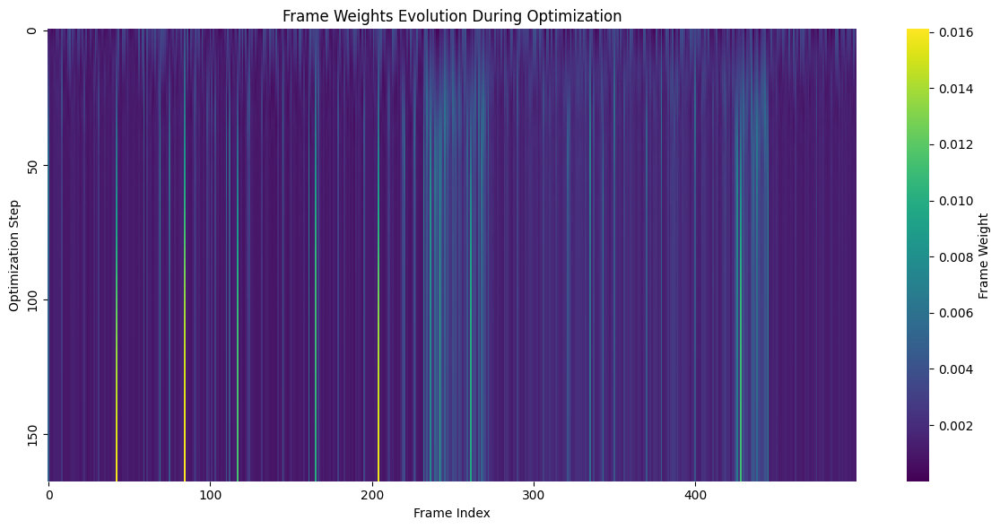

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

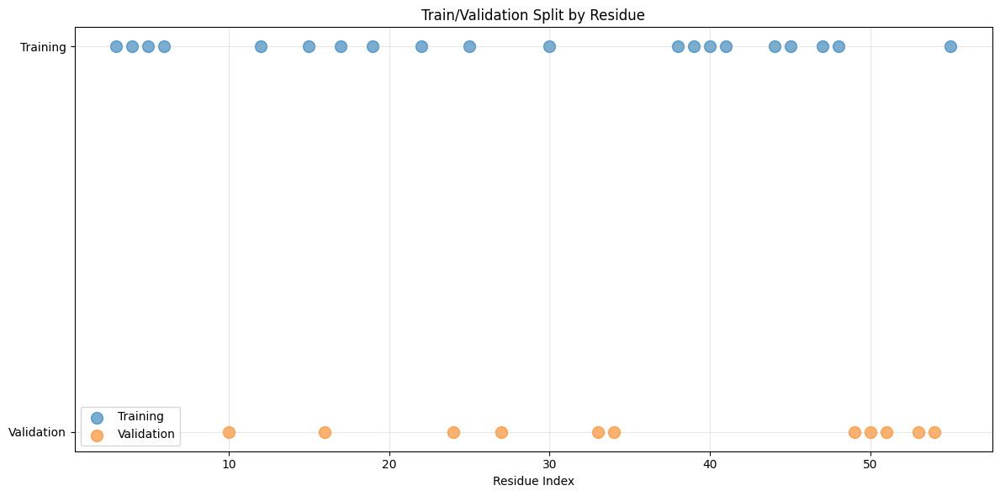

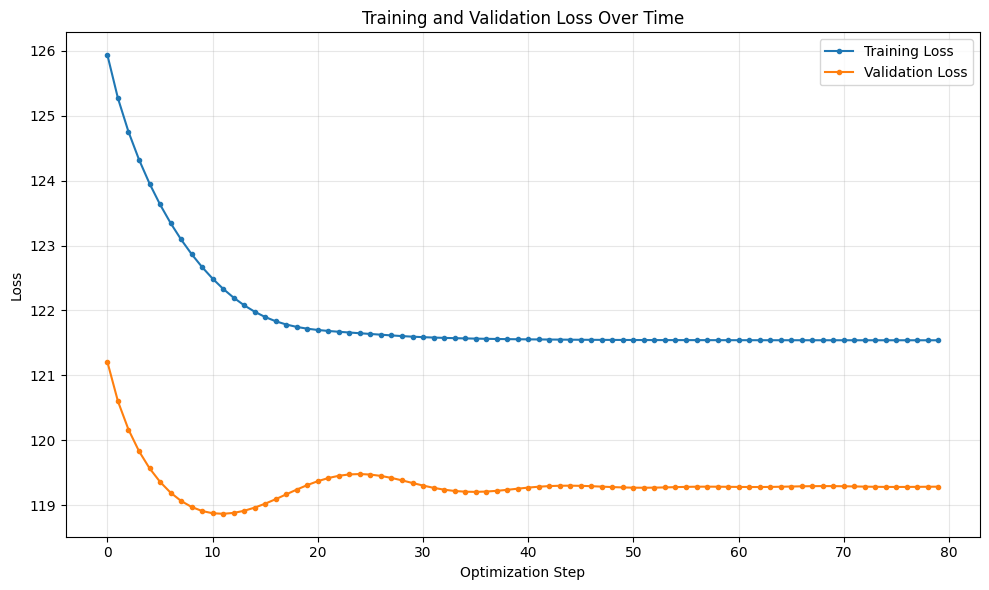

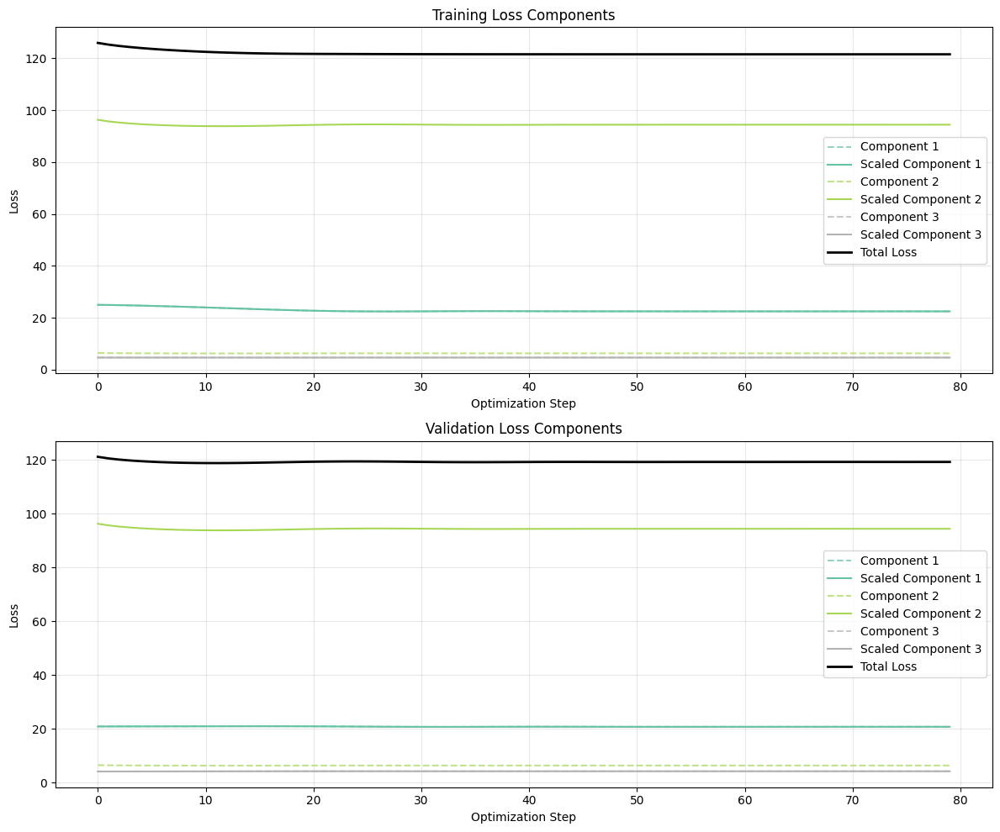

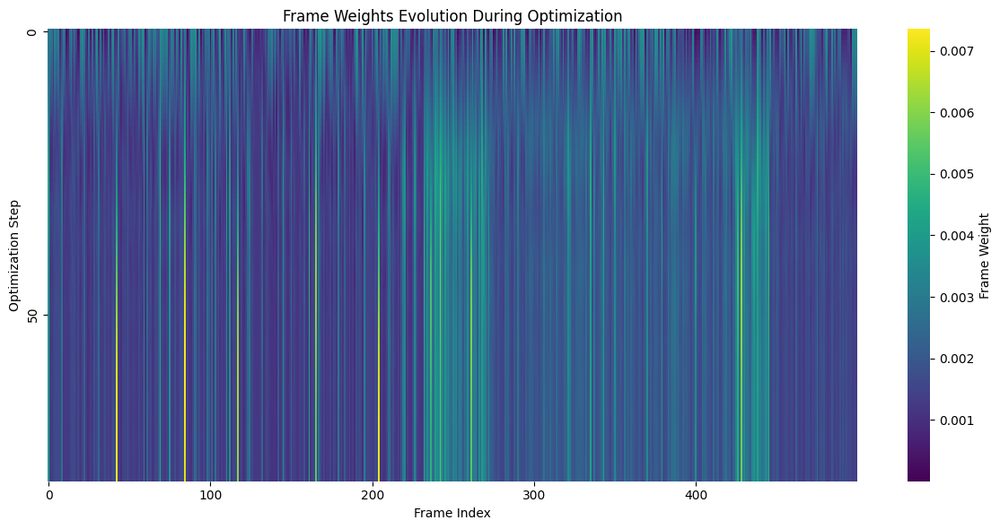

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

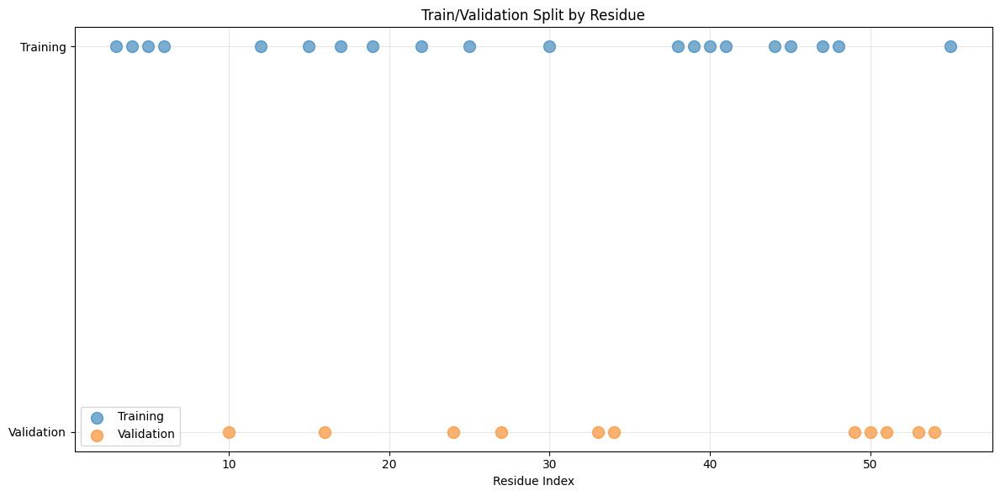

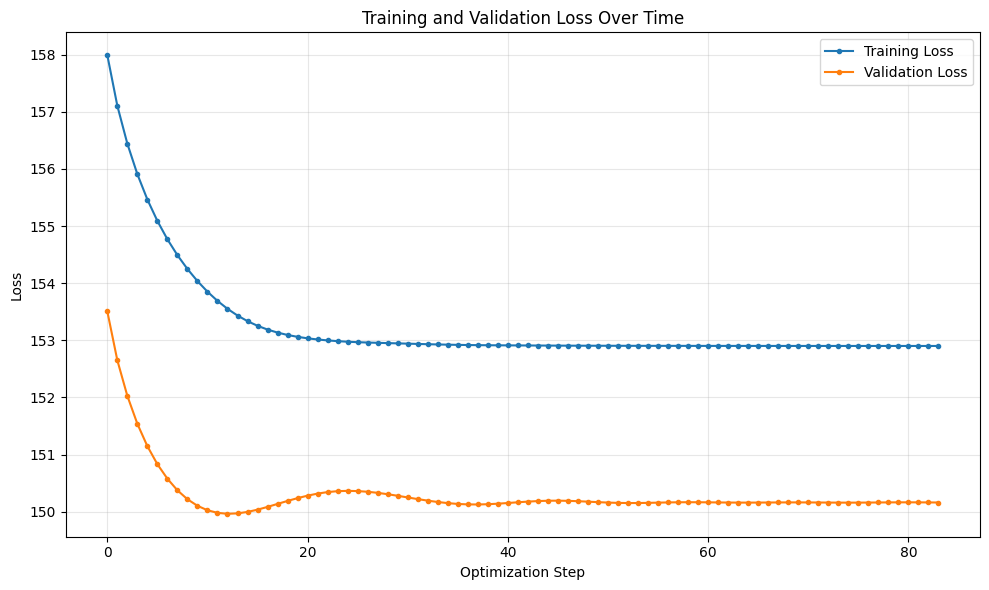

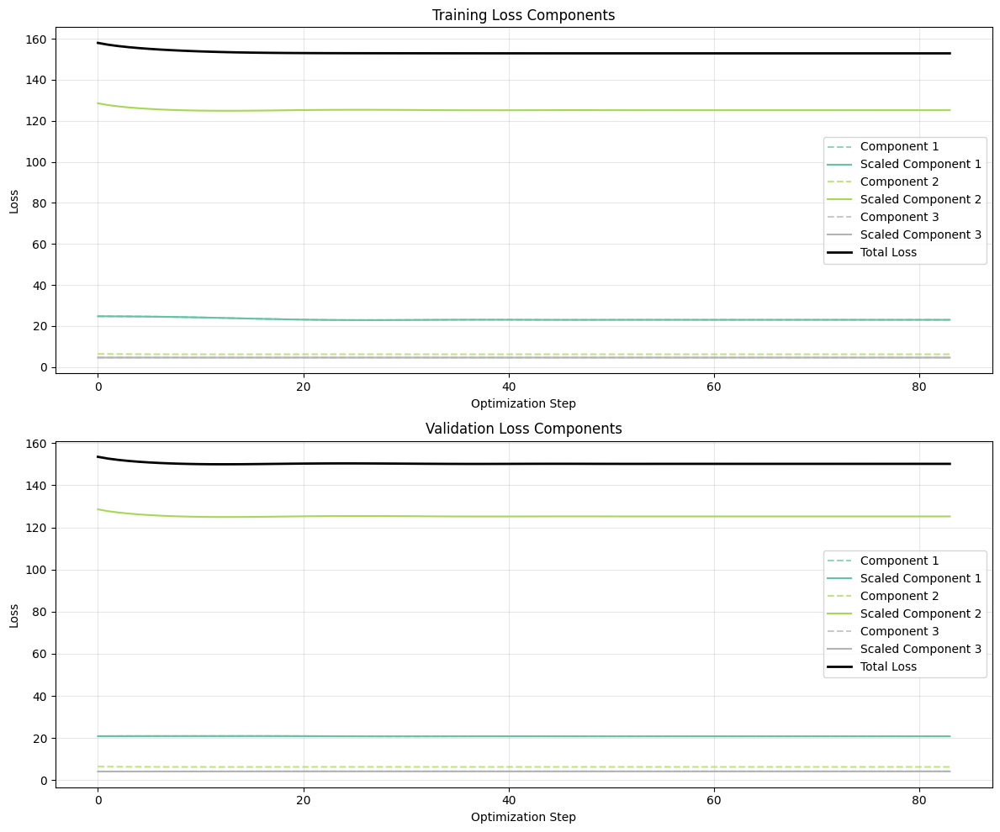

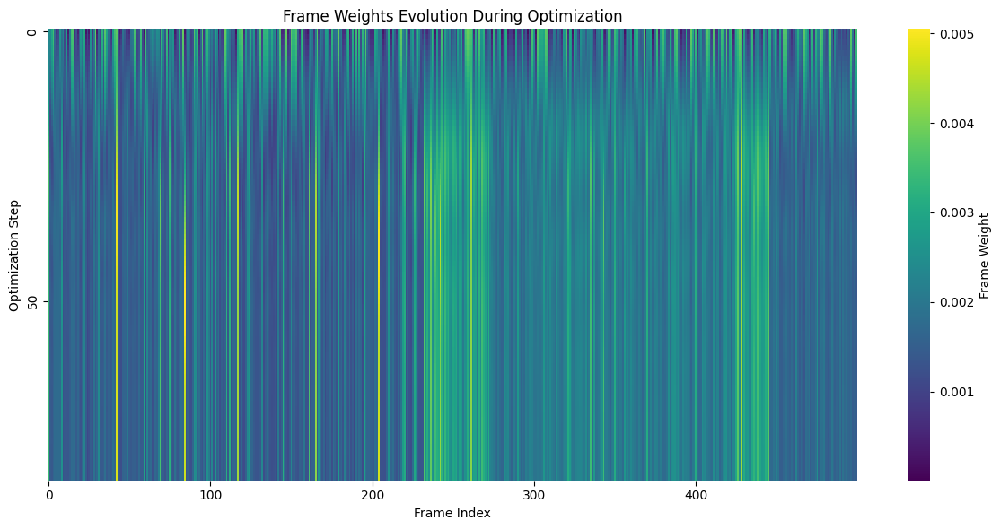

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

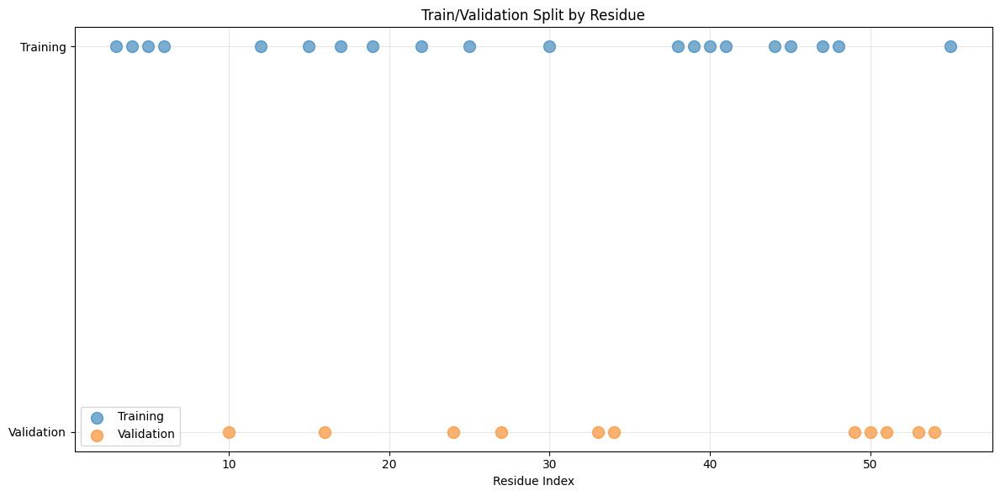

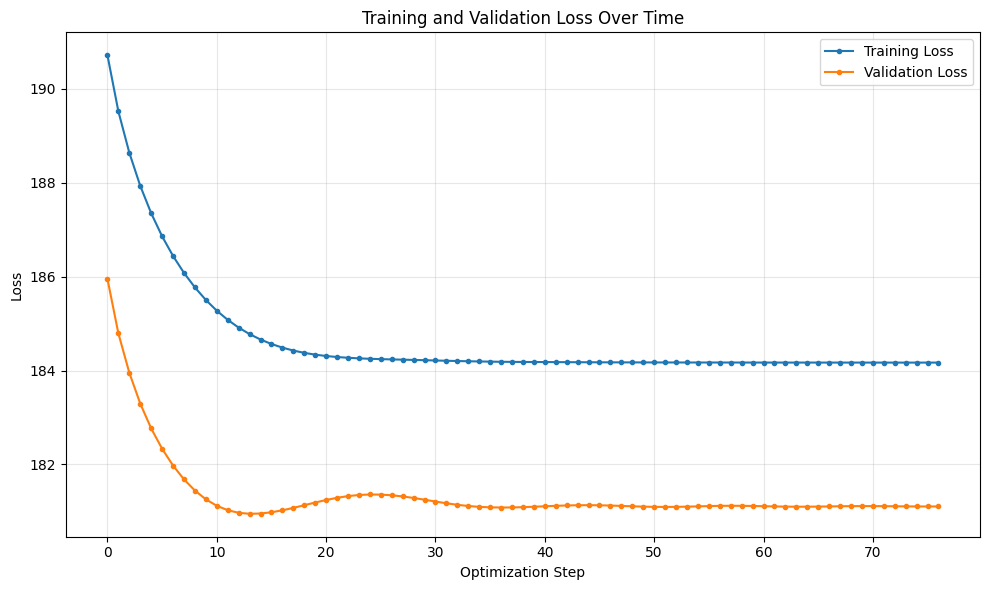

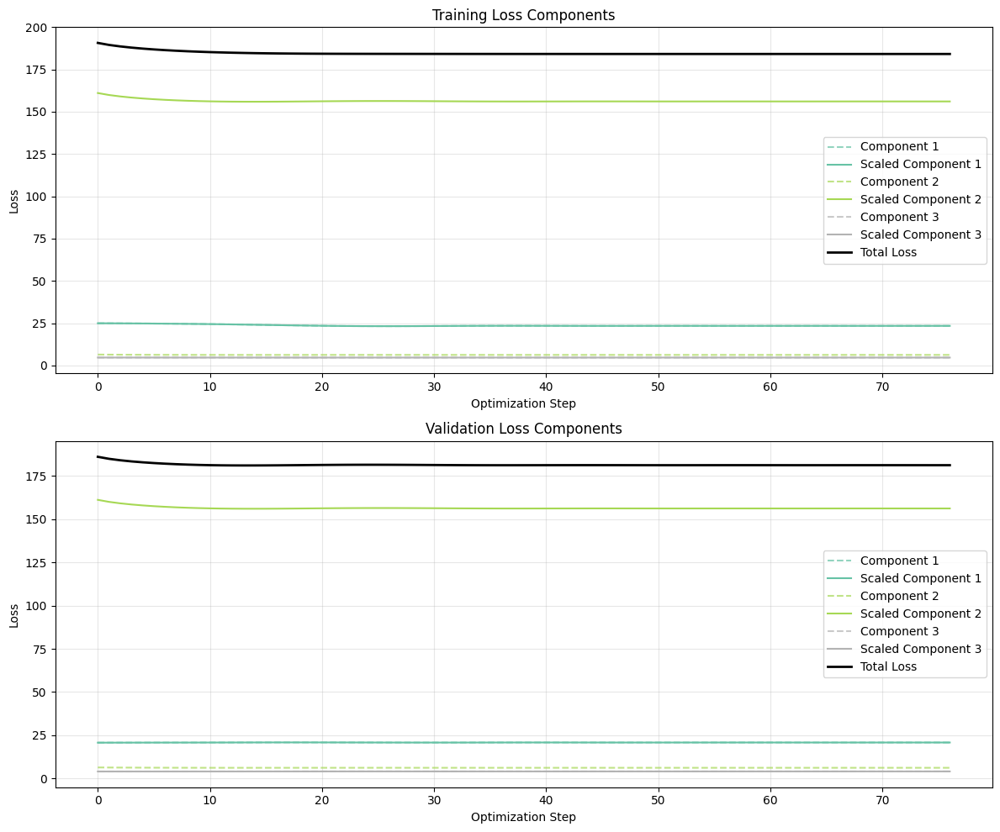

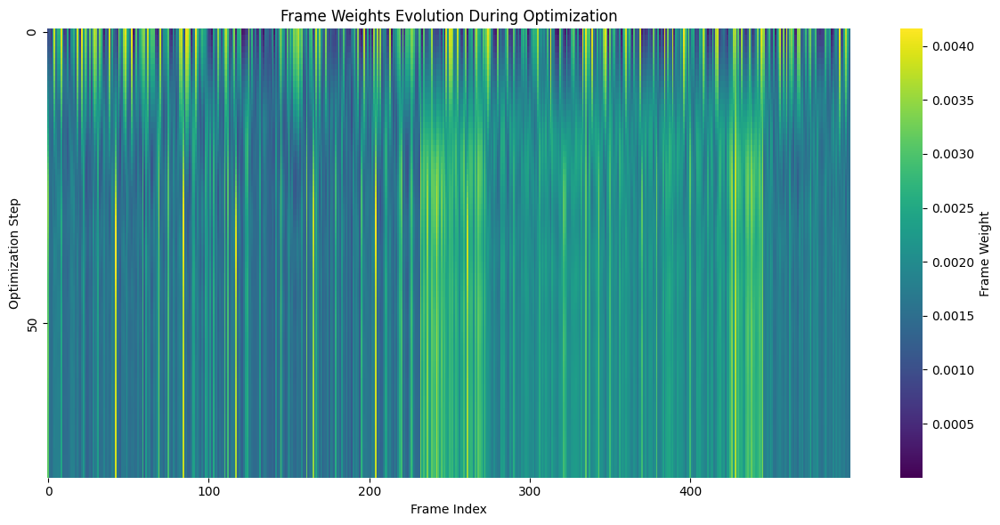

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

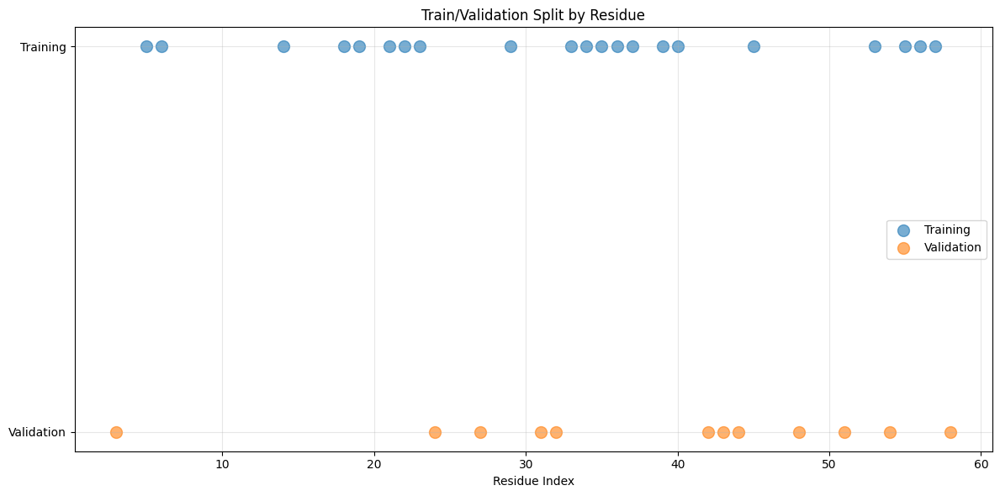

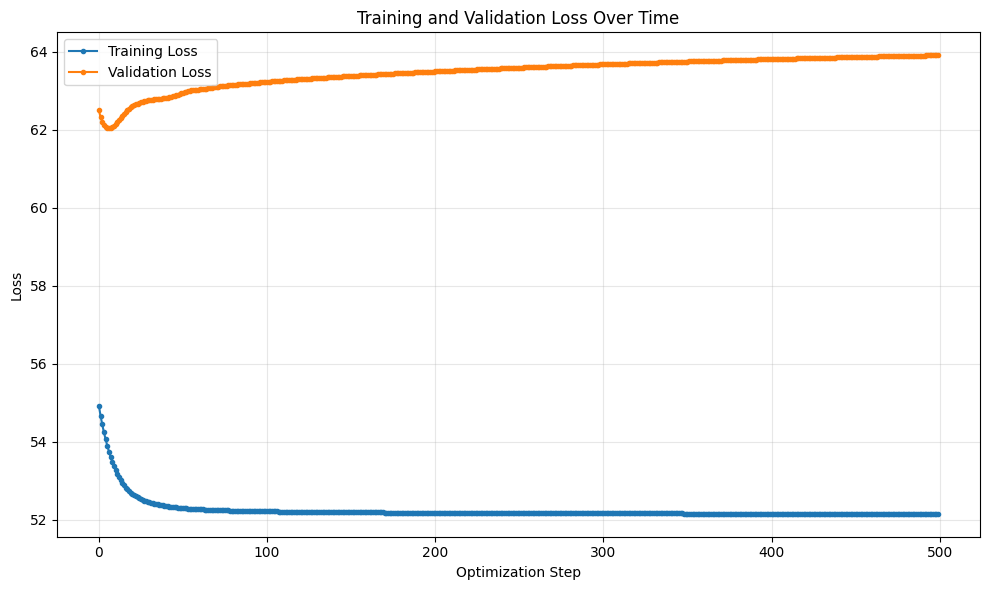

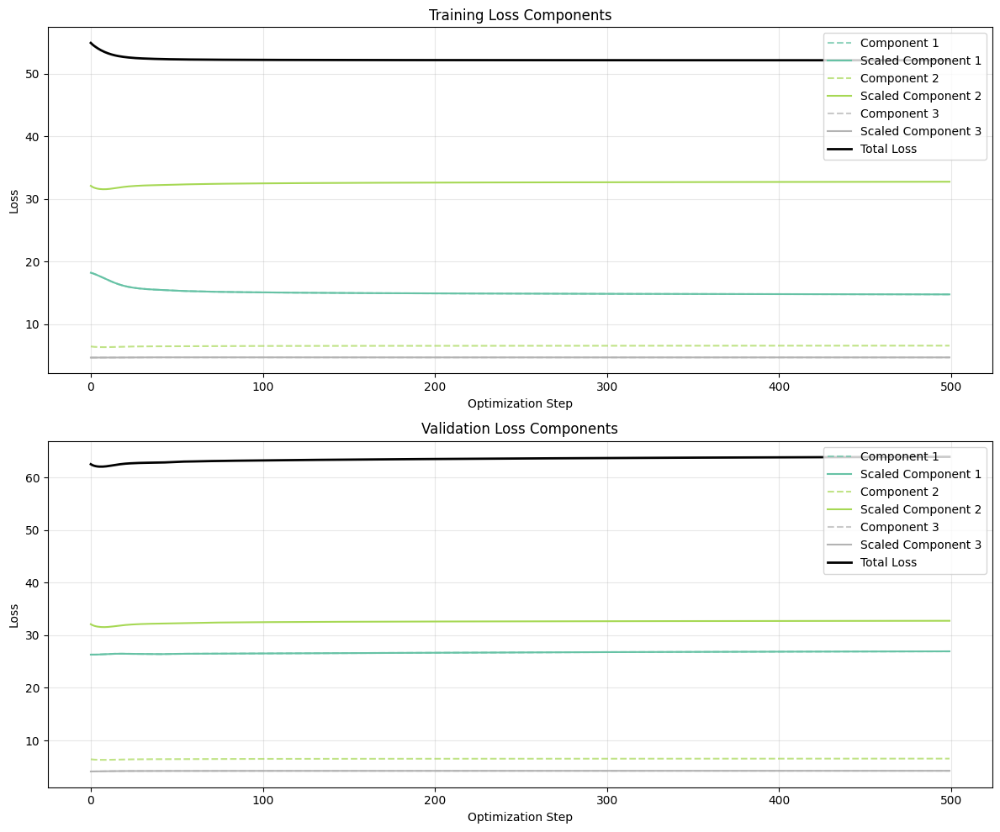

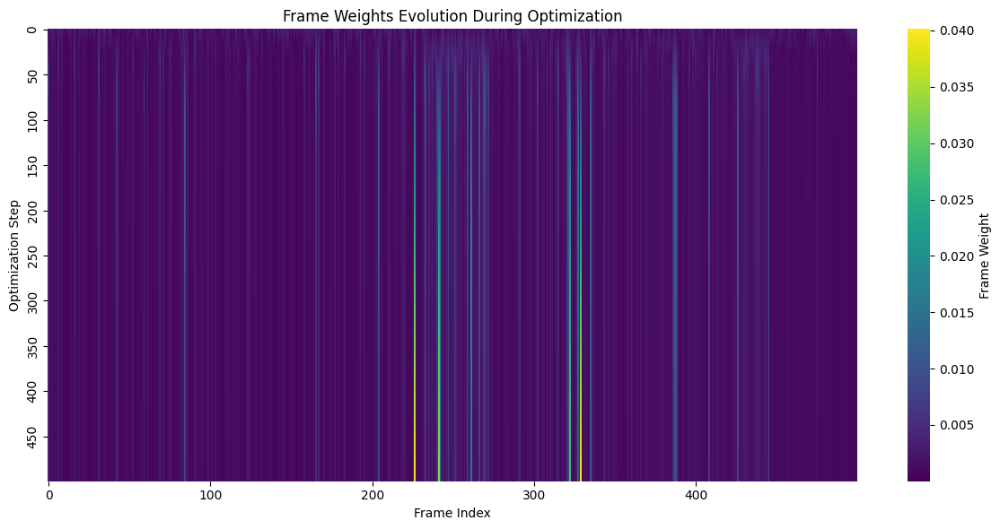

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

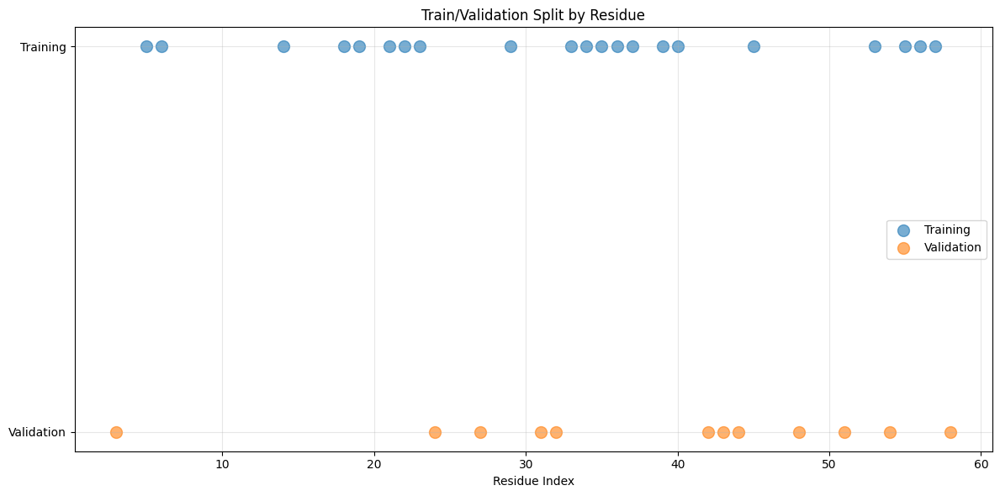

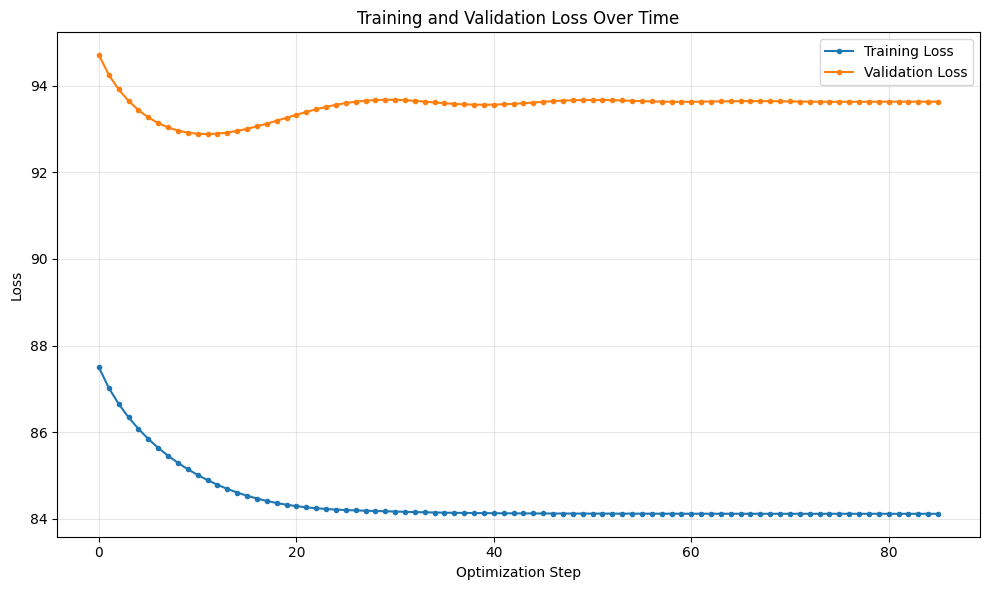

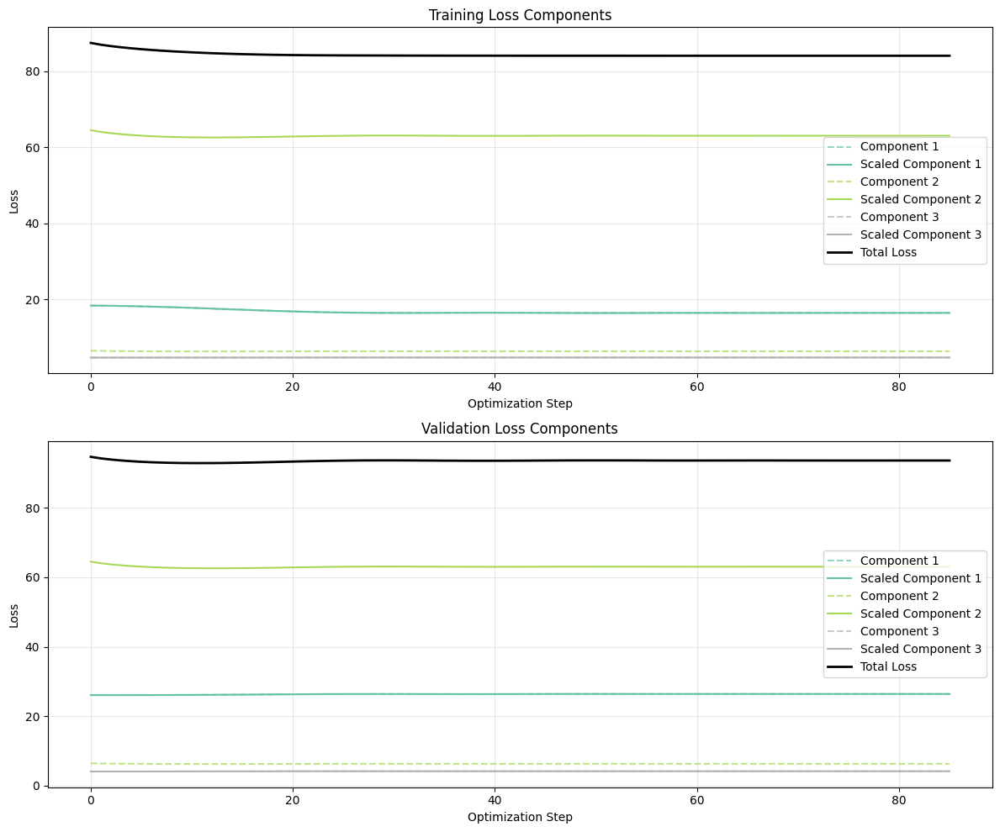

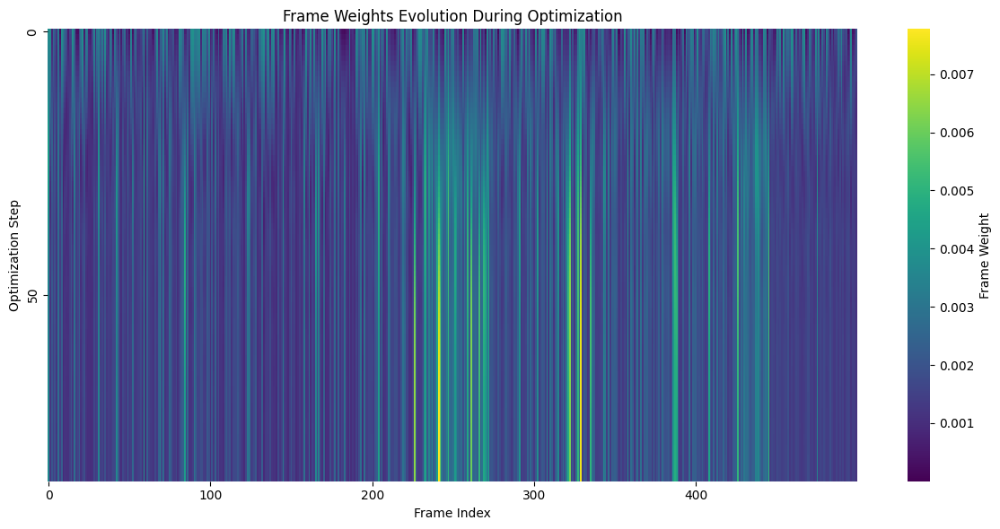

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

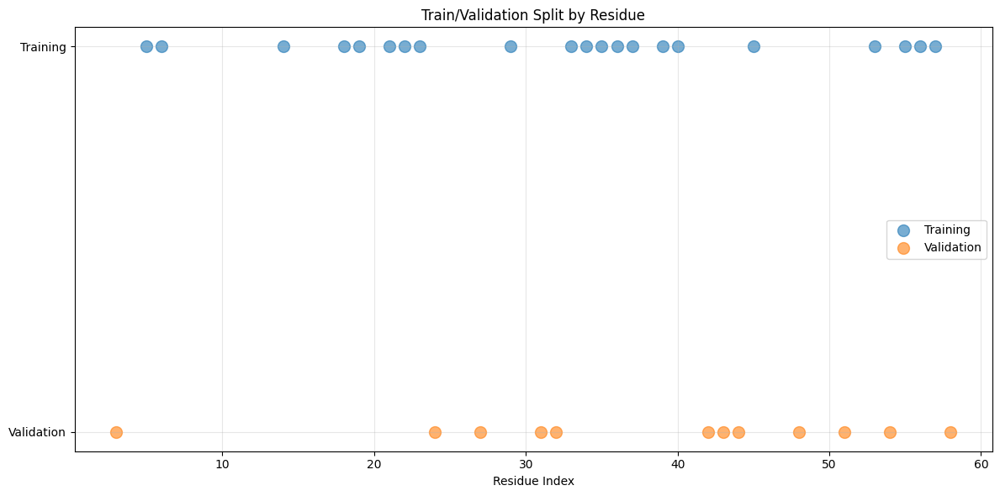

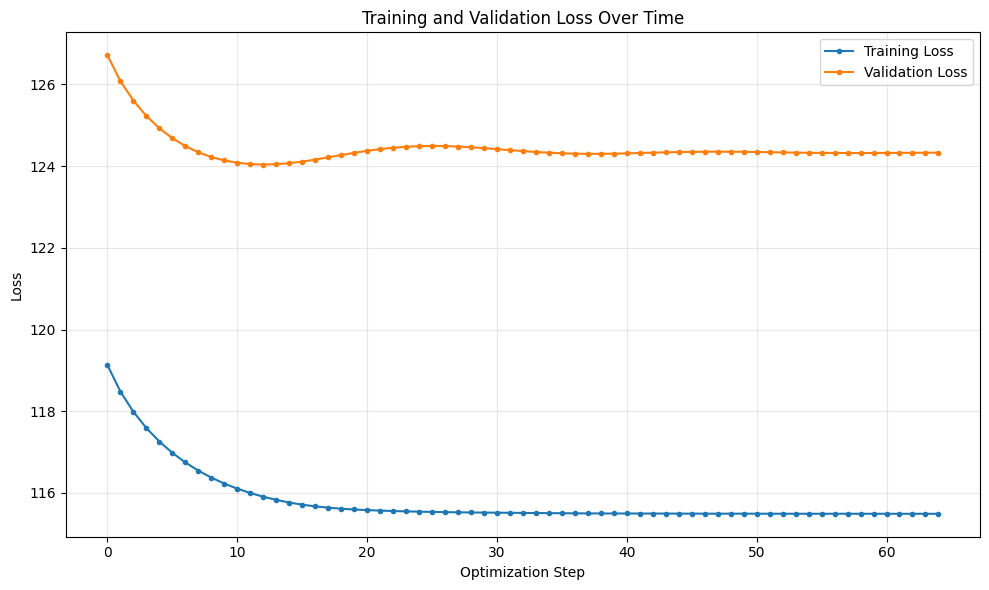

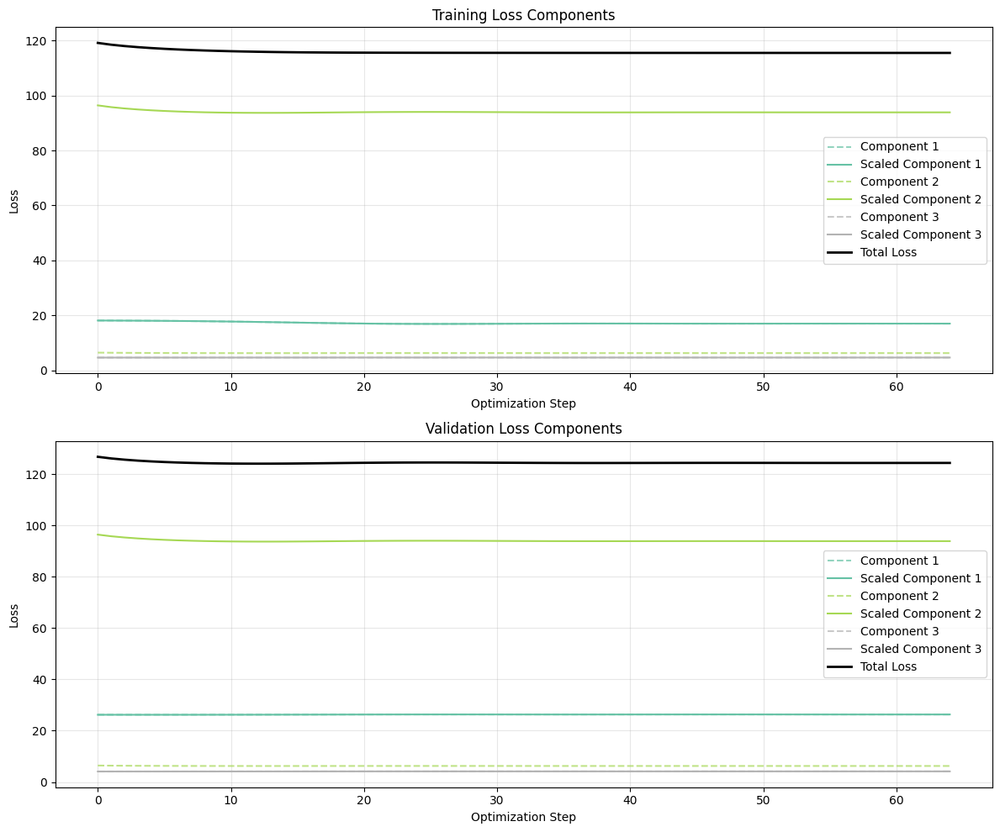

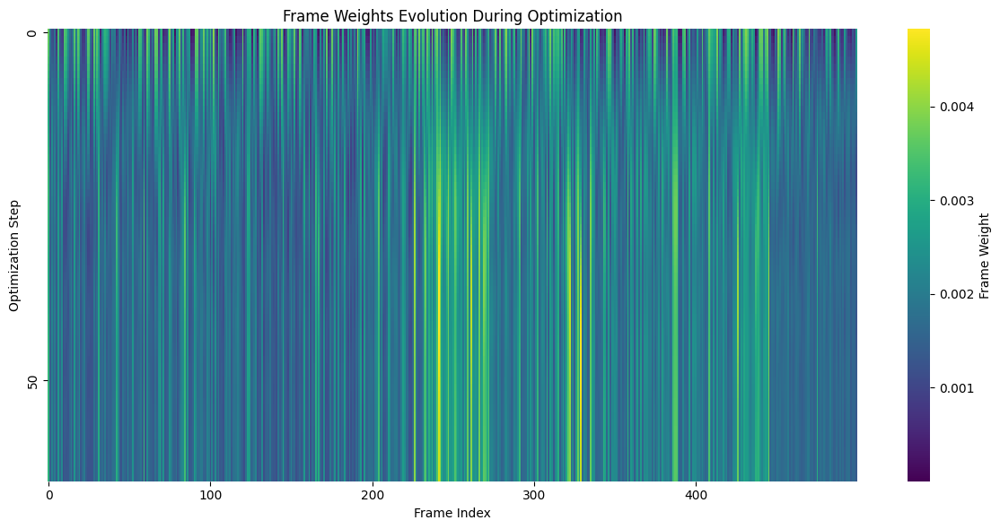

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

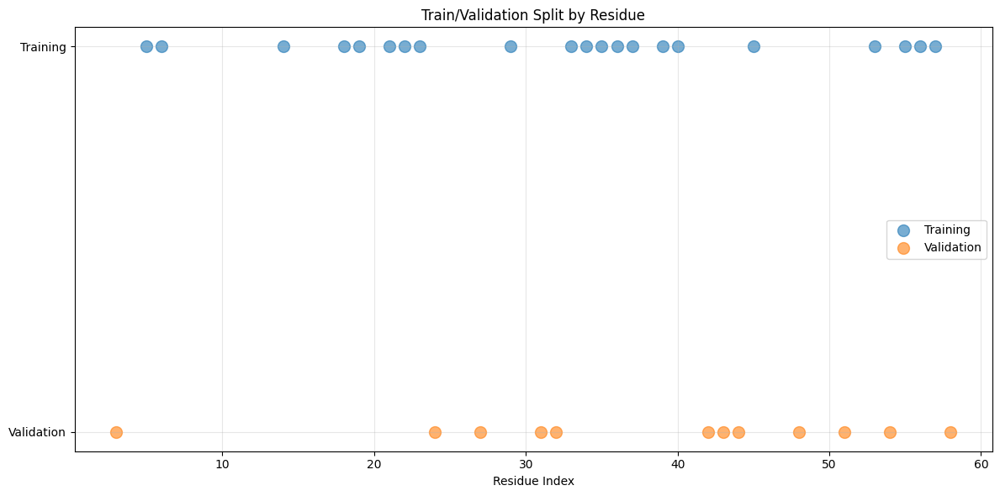

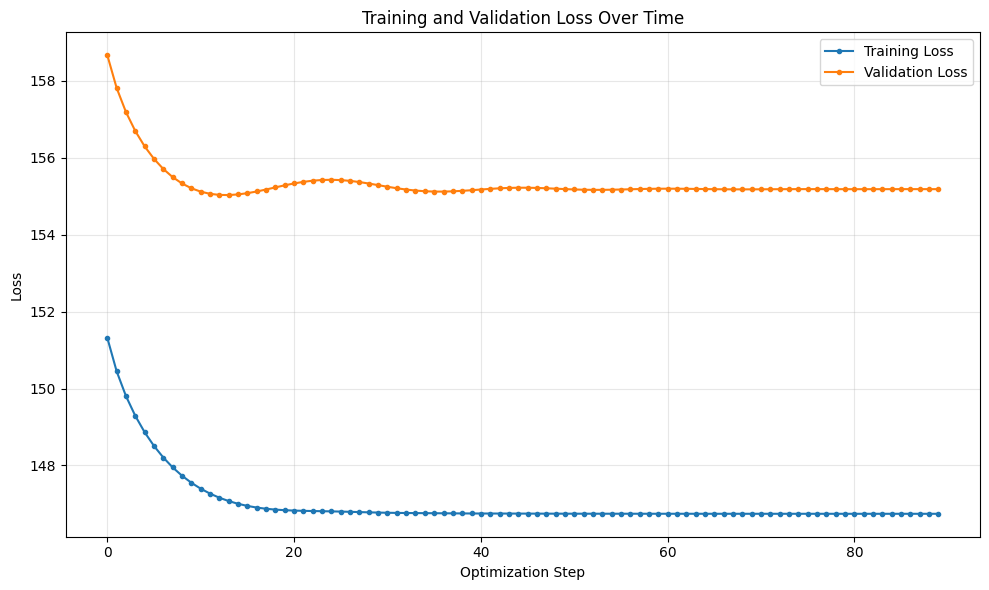

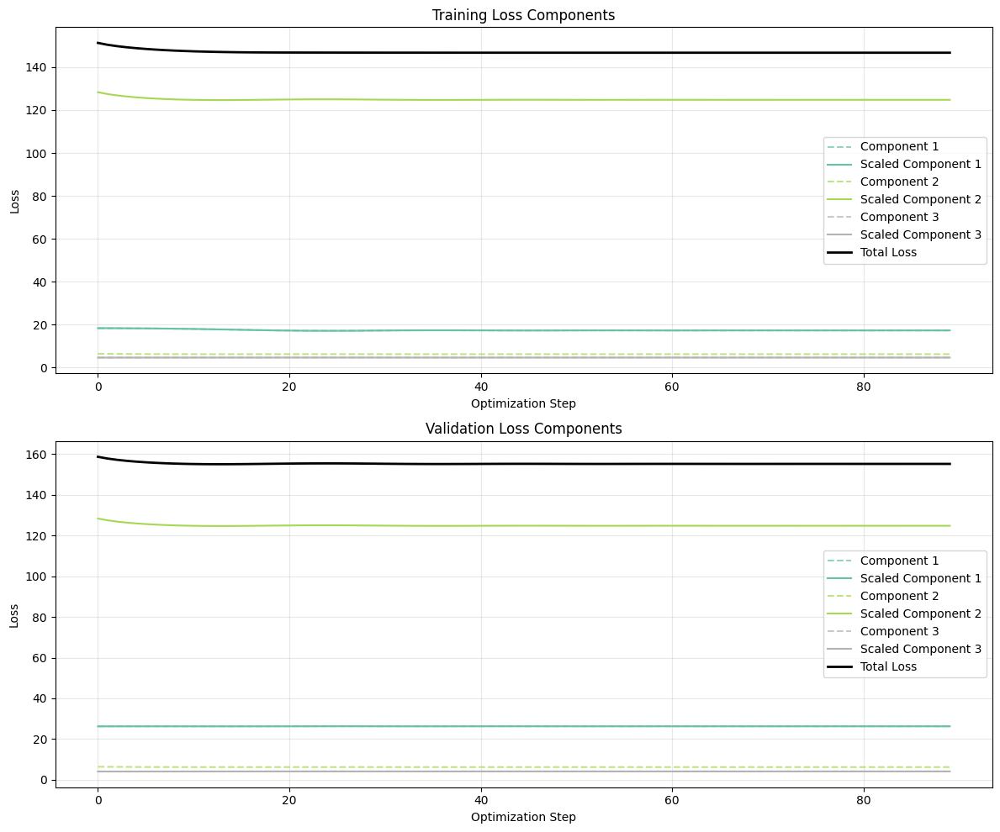

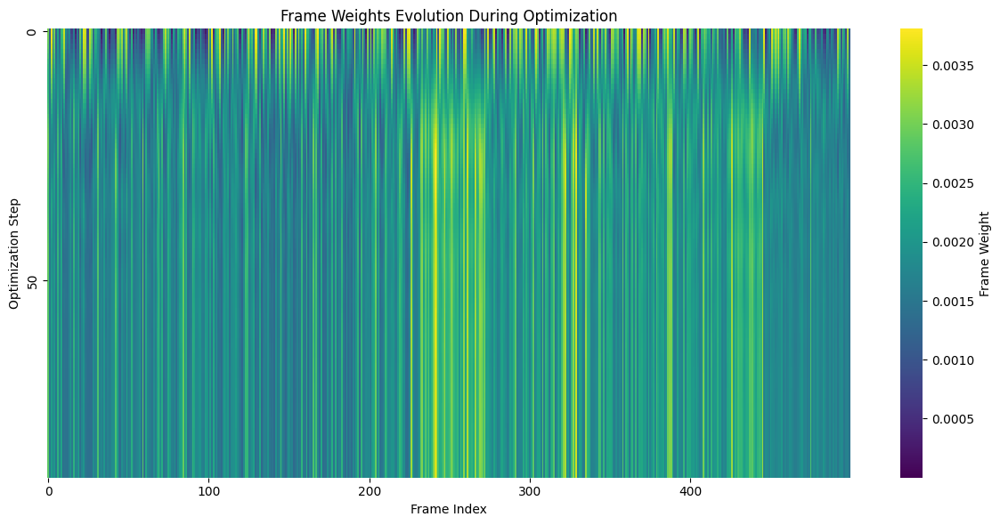

Simulation initialised successfully.
Sampling data by centrality
Threshold: 0.9
Max Centrality: 0
Number of training fragments: 23
Number of validation fragments: 18
Number of intersecting fragments: 0
Split is valid - continuing
Input shapes:
Input features shape: (53, 53, 500)
Number of feature topology fragments: 53
Number of output features: 23

Sample feature topology:
Fragment 0: chain=SYST, start=3, end=3
Fragment 1: chain=SYST, start=4, end=4
Fragment 2: chain=SYST, start=5, end=5

Sample output features:
Fragment 0: chain=SYST, start=55, end=55
Fragment 1: chain=SYST, start=55, end=55
Fragment 2: chain=SYST, start=51, end=51
Number of non-zero elements: 23
Matrix shape: (23, 53)
Indices shape: (2, 23)
Values shape: (23,)
Debug info before BCOO creation:
indices array shape: (2, 23)
values array shape: (23,)
target matrix shape: (23, 53)
Sample indices: [[ 0  1  2  3  4]
 [49 49 45 48 37]]
Sample values: [1. 1. 1. 1. 1.]
Input shapes:
Input features shape: (53, 53, 500)
Number 

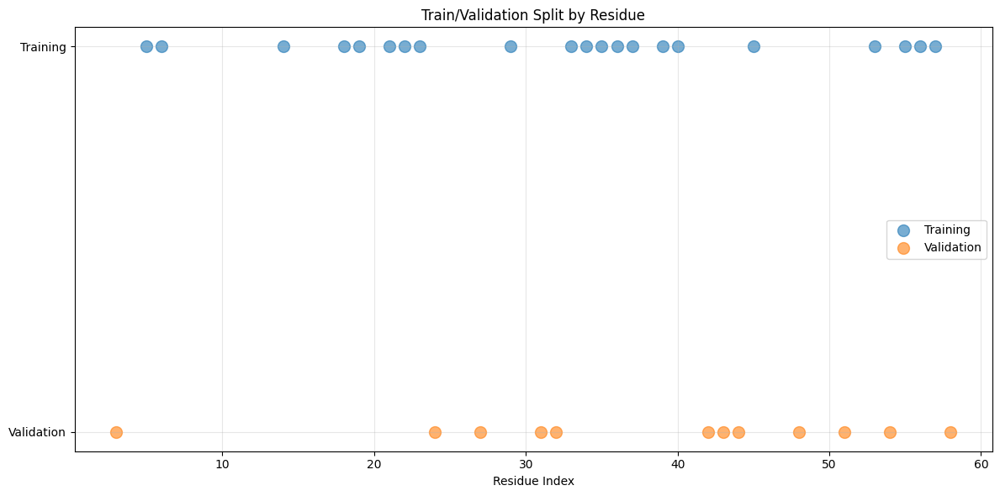

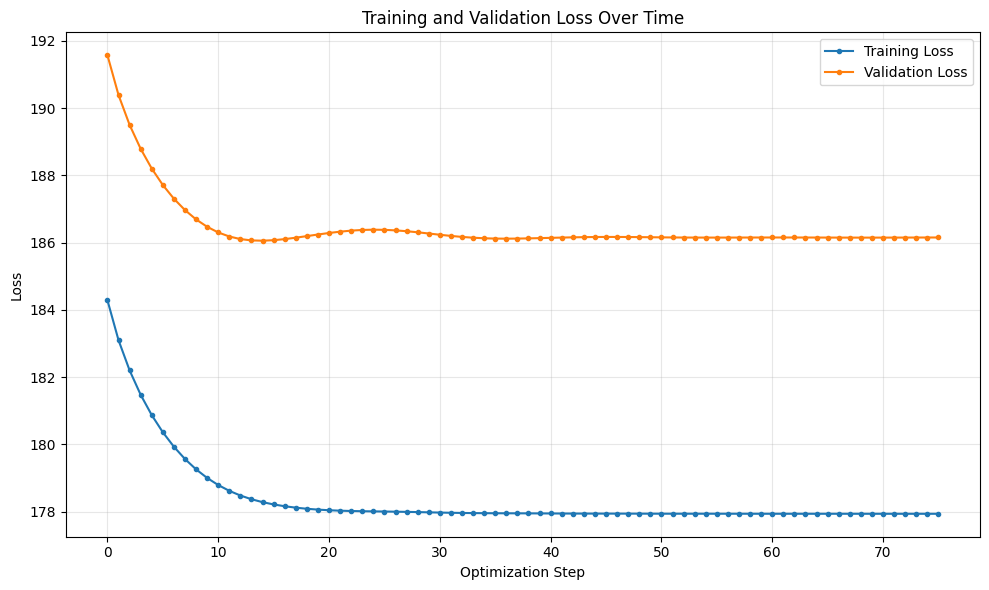

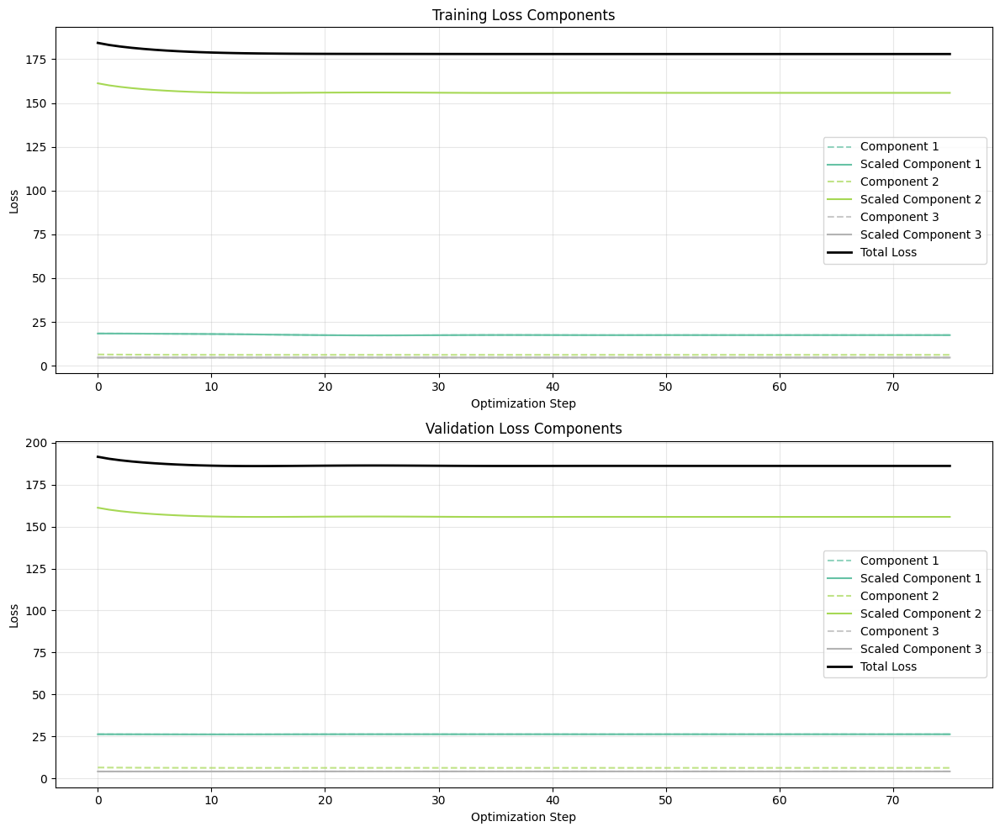

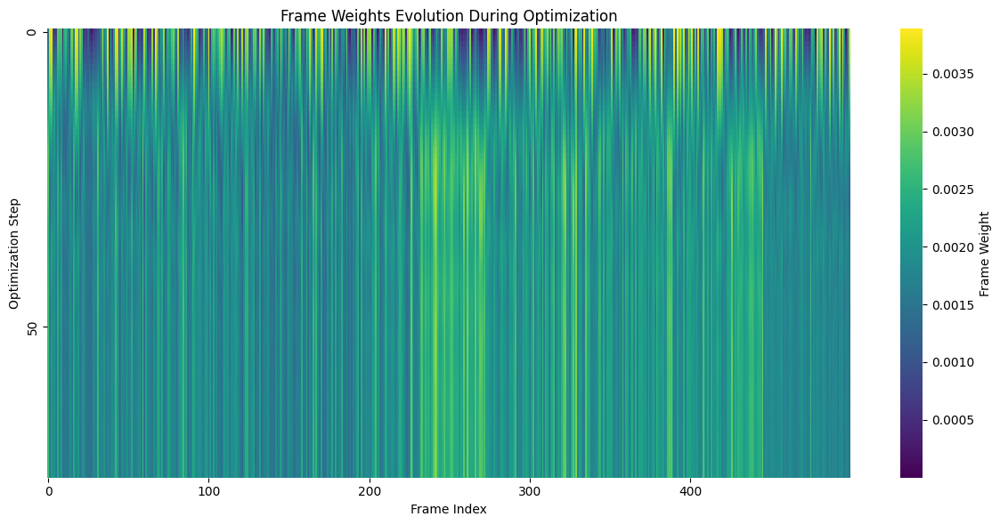

Computing test losses for Dataset Seed 1, Replicate 1


Replicate 1: 100%|██████████| 500/500 [00:35<00:00, 14.19it/s]


Computing test losses for Dataset Seed 1, Replicate 2


Replicate 2: 100%|██████████| 144/144 [00:10<00:00, 14.14it/s]


Computing test losses for Dataset Seed 1, Replicate 3


Replicate 3: 100%|██████████| 78/78 [00:05<00:00, 14.50it/s]


Computing test losses for Dataset Seed 1, Replicate 4


Replicate 4: 100%|██████████| 83/83 [00:05<00:00, 14.04it/s]


Computing test losses for Dataset Seed 1, Replicate 5


Replicate 5: 100%|██████████| 74/74 [00:05<00:00, 13.93it/s]


Computing test losses for Dataset Seed 2, Replicate 1


Replicate 1: 100%|██████████| 500/500 [00:35<00:00, 14.15it/s]


Computing test losses for Dataset Seed 2, Replicate 2


Replicate 2: 100%|██████████| 168/168 [00:12<00:00, 13.98it/s]


Computing test losses for Dataset Seed 2, Replicate 3


Replicate 3: 100%|██████████| 80/80 [00:05<00:00, 13.72it/s]


Computing test losses for Dataset Seed 2, Replicate 4


Replicate 4: 100%|██████████| 84/84 [00:06<00:00, 13.69it/s]


Computing test losses for Dataset Seed 2, Replicate 5


Replicate 5: 100%|██████████| 77/77 [00:05<00:00, 14.36it/s]


Computing test losses for Dataset Seed 3, Replicate 1


Replicate 1: 100%|██████████| 500/500 [00:35<00:00, 14.03it/s]


Computing test losses for Dataset Seed 3, Replicate 2


Replicate 2: 100%|██████████| 86/86 [00:06<00:00, 13.67it/s]


Computing test losses for Dataset Seed 3, Replicate 3


Replicate 3: 100%|██████████| 65/65 [00:04<00:00, 13.49it/s]


Computing test losses for Dataset Seed 3, Replicate 4


Replicate 4: 100%|██████████| 90/90 [00:06<00:00, 14.10it/s]


Computing test losses for Dataset Seed 3, Replicate 5


Replicate 5: 100%|██████████| 76/76 [00:05<00:00, 14.43it/s]


In [34]:
# %% Run the experiment
# Set up parameters
n_seeds = 3
seeds = [42+i for i in range(n_seeds)]
n_replicates = 5



mre_me_optimization_results = run_MAE_max_ent_optimization_replicates(simulation, datasets, models, opt_settings, n_replicates)
mre_me_test_losses = compute_test_losses(mre_me_optimization_results, datasets)

Generating PCA visualization...


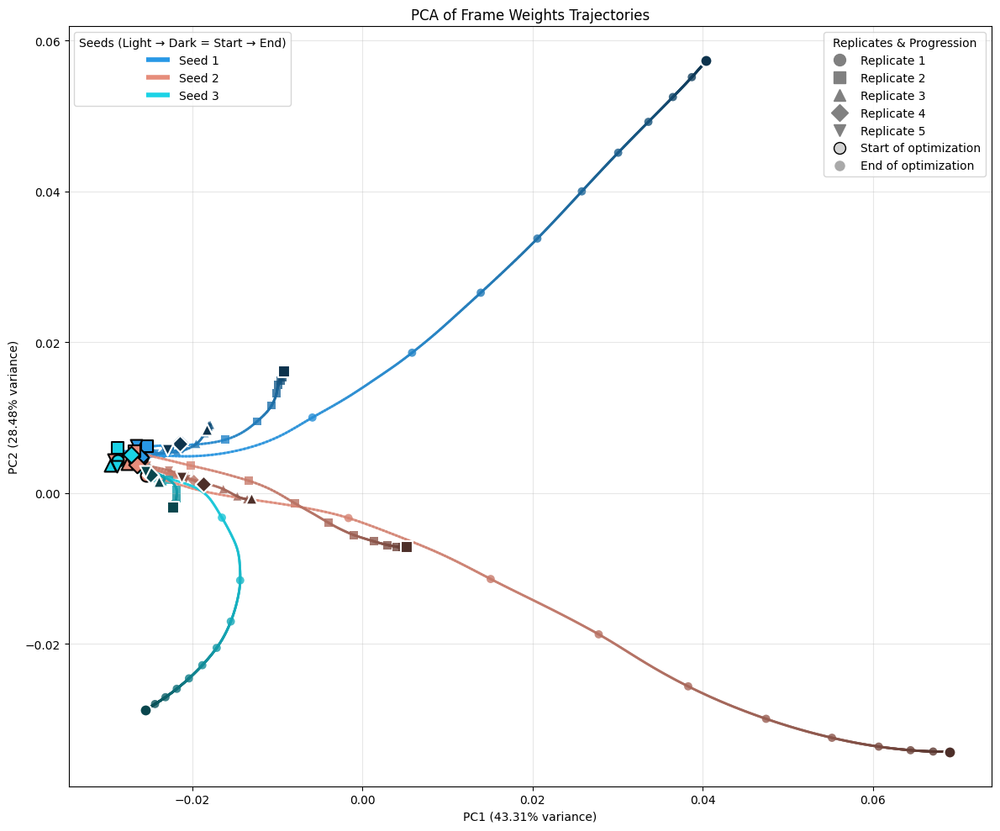

In [48]:

# Visualize PCA trajectories
print("Generating PCA visualization...")
pca_fig = visualize_pca_trajectories(mre_me_optimization_results, n_seeds, n_replicates)
# save_pca_visualization(pca_fig)
plt.show()

Generating 3D PCA visualization with residue-average test loss...


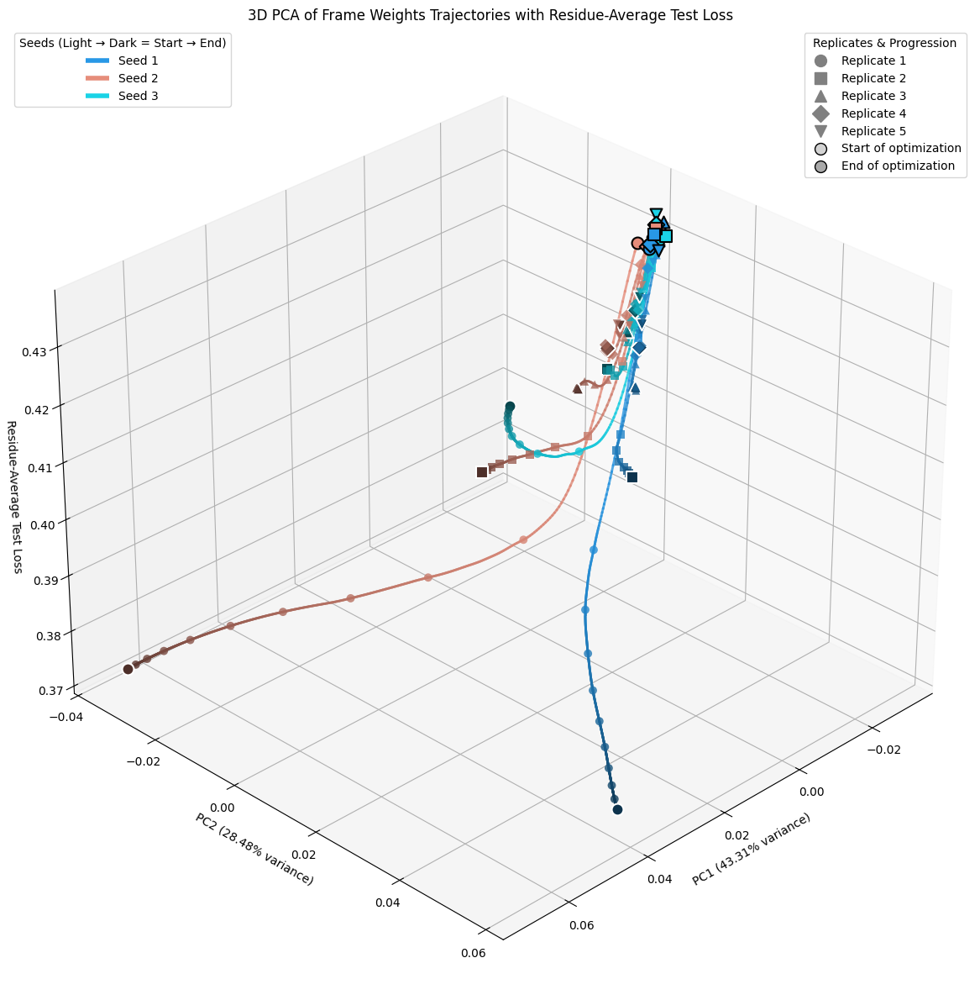

In [36]:
print("Generating 3D PCA visualization with residue-average test loss...")
pca3d_fig = visualize_pca_3d_test_loss(mre_me_optimization_results, mre_me_test_losses, n_seeds, n_replicates)
plt.show()

Generating 3D t-SNE visualization with residue-average test loss...


/Users/alexi/JAX-ENT/.venv/lib/python3.13/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


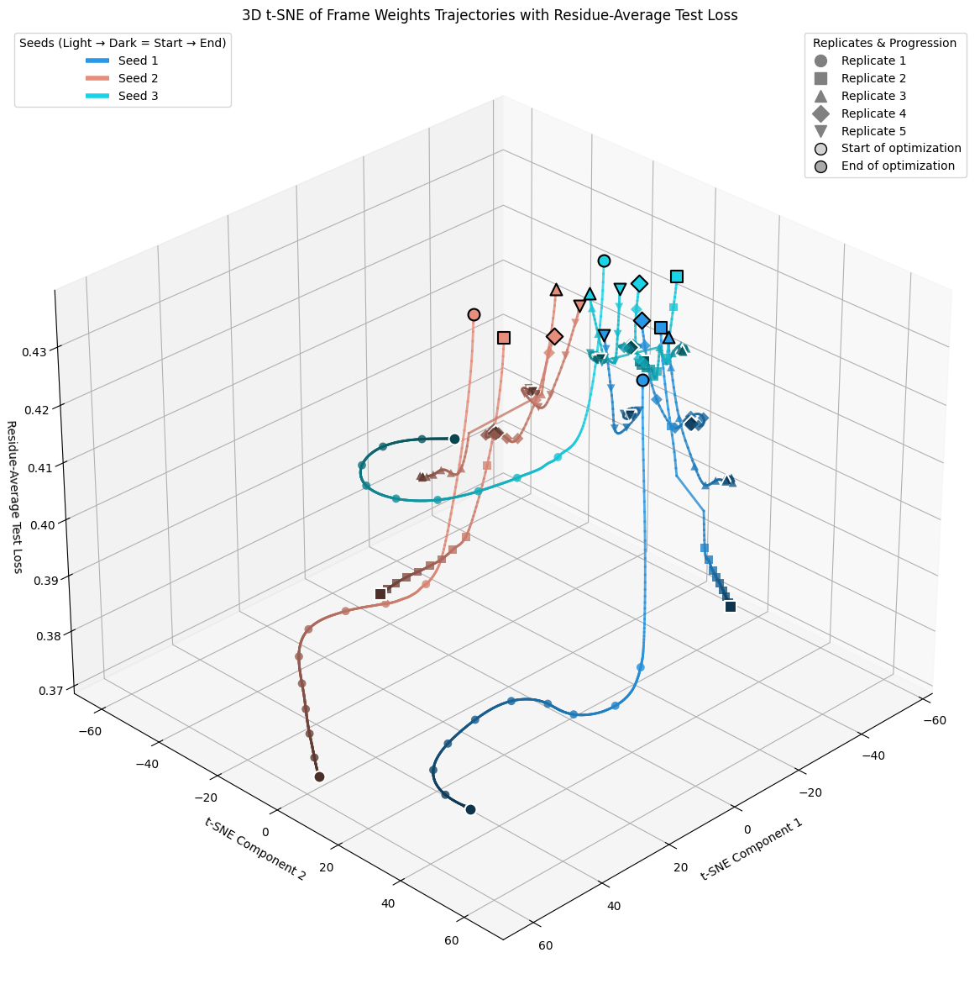

In [37]:

print("Generating 3D t-SNE visualization with residue-average test loss...")
tsne3d_fig = visualize_tsne_3d_loss(mre_me_optimization_results, mre_me_test_losses, n_seeds, n_replicates)
plt.show()

Performing t-SNE with perplexity=30, n_iter=1000...


/Users/alexi/JAX-ENT/.venv/lib/python3.13/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


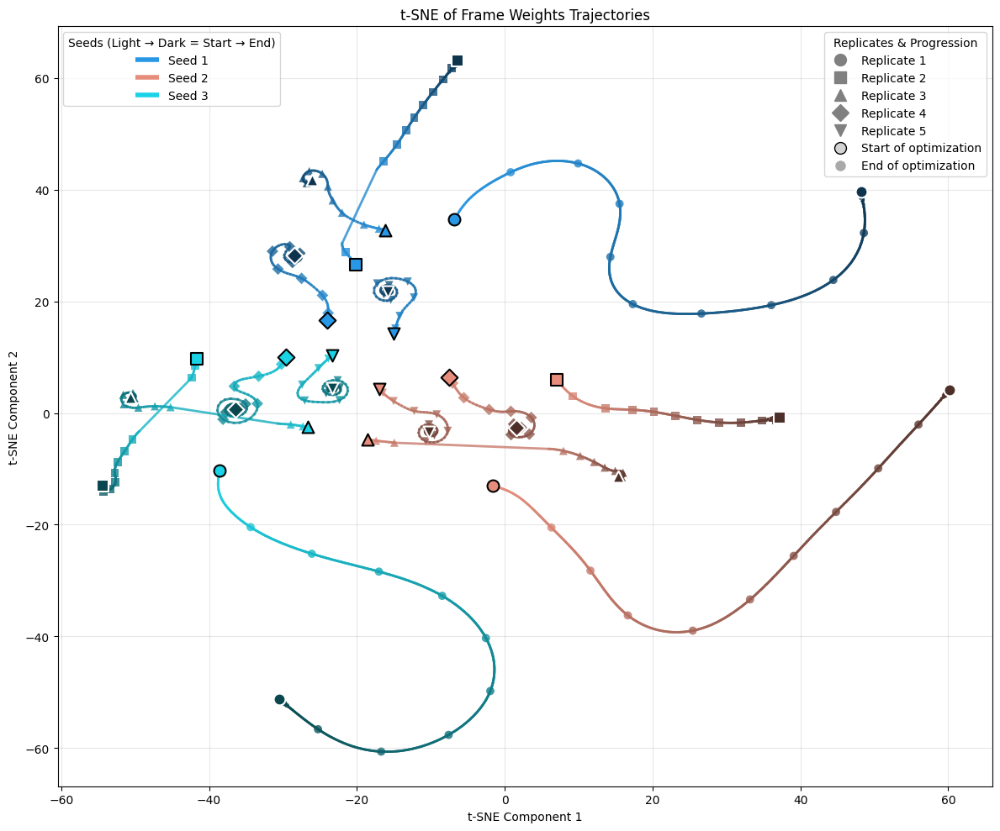

Performing t-SNE with perplexity=30, n_iter=1000...


/Users/alexi/JAX-ENT/.venv/lib/python3.13/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


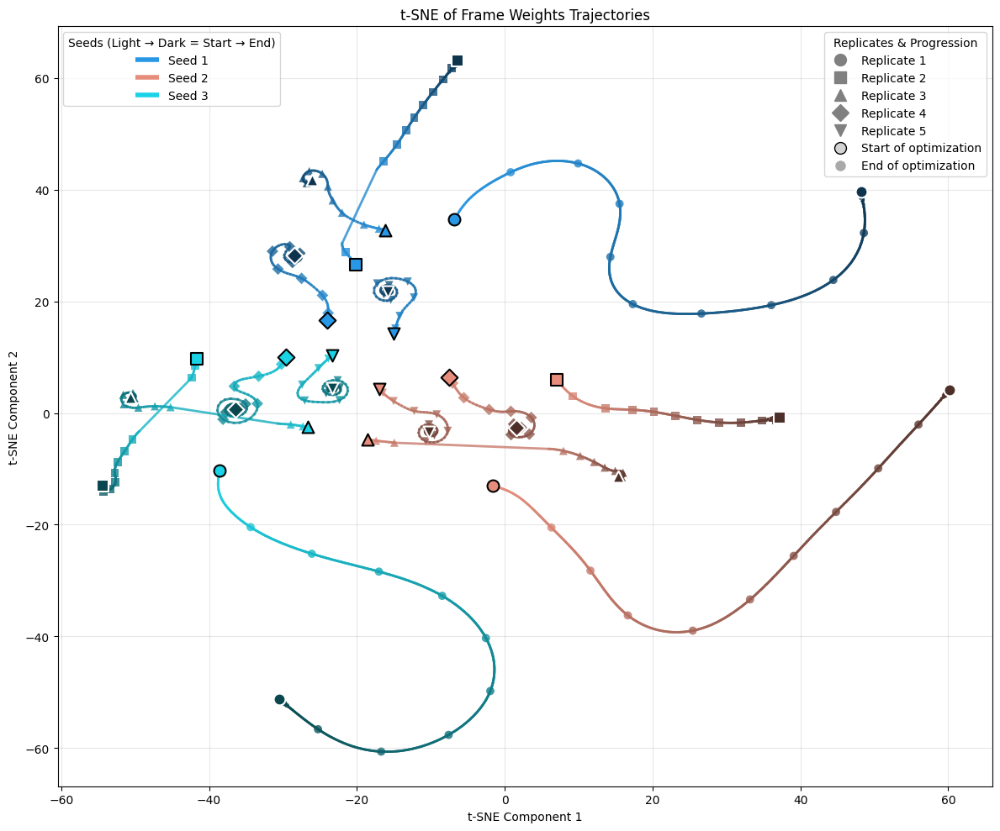

In [49]:
tsne_fig = visualize_tsne_trajectories(mre_me_optimization_results, n_seeds, n_replicates)


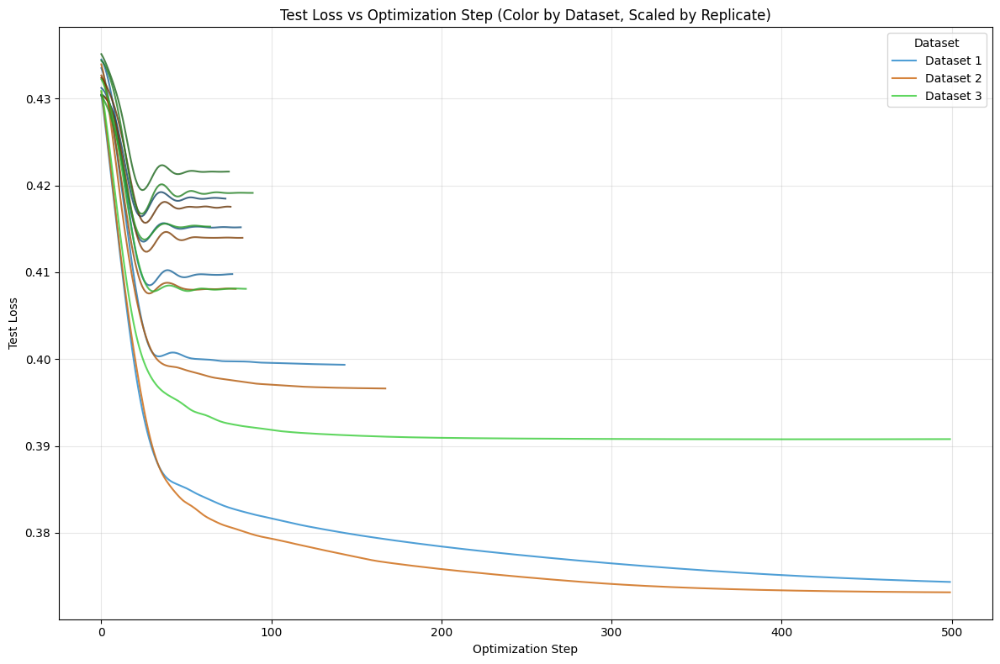

In [44]:
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

plt.figure(figsize=(12, 8))

# Loop over each dataset (seed)
for seed_idx in range(n_seeds):
    seed_key = f'seed_{seed_idx}'
    base_color = plt.cm.tab10(seed_idx)  # base color for the dataset
    # Loop over replicates for this dataset
    for rep_idx in range(n_replicates):
        replicate_losses = mre_me_test_losses[seed_key][rep_idx]
        steps = np.arange(len(replicate_losses))
        
        # Adjust the brightness of the base color according to the replicate
        hsv = mcolors.rgb_to_hsv(base_color[:3])
        # Scale brightness from 0.8 (replicate 0) to 0.4 (last replicate)
        brightness = 0.8 - (rep_idx / (n_replicates - 1)) * (0.8 - 0.4)
        hsv[2] = brightness
        color = mcolors.hsv_to_rgb(hsv)
        
        # Use label only for the first replicate per dataset
        label = f"Dataset {seed_idx+1}" if rep_idx == 0 else None
        
        plt.plot(steps, replicate_losses, color=color, label=label, alpha=0.8)

plt.xlabel("Optimization Step")
plt.ylabel("Test Loss")
plt.title("Test Loss vs Optimization Step (Color by Dataset, Scaled by Replicate)")
plt.legend(title="Dataset")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [51]:
def plot_final_test_error_vs_param(test_losses, n_seeds, n_replicates, param_values=None, 
                                  title="Final Test Error vs Parameter Value", 
                                  param_name="Parameter Value"):
    """
    Creates a plot of final test error for each dataset against the parameter values.
    
    Parameters:
    -----------
    test_losses : dict
        Dictionary of test losses for each dataset seed and replicate
    n_seeds : int
        Number of seeds (datasets)
    n_replicates : int
        Number of replicates per seed
    param_values : list, optional
        List of parameter values corresponding to each replicate.
        If None, uses replicate index as x-axis.
    title : str, optional
        Plot title
    param_name : str, optional
        Name of the parameter being varied
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The plot figure
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.colors as mcolors
    from matplotlib.markers import MarkerStyle
    
    # Create figure
    plt.figure(figsize=(12, 8))
    
    # If param_values not provided, use replicate indices
    if param_values is None:
        param_values = list(range(1, n_replicates + 1))
    
    # Extract final test error for each dataset and replicate
    final_errors = {}
    min_error = float('inf')
    max_error = 0
    
    for seed_idx in range(n_seeds):
        seed_key = f'seed_{seed_idx}'
        final_errors[seed_key] = []
        
        for rep_idx in range(n_replicates):
            if seed_key in test_losses and rep_idx < len(test_losses[seed_key]) and test_losses[seed_key][rep_idx] is not None:
                # Get the final test loss for this replicate
                final_error = test_losses[seed_key][rep_idx][-1]
                final_errors[seed_key].append(final_error)
                
                # Update min and max for y-axis scaling
                min_error = min(min_error, final_error)
                max_error = max(max_error, final_error)
            else:
                # Handle missing data
                final_errors[seed_key].append(np.nan)
    
    # Define markers and colors
    markers = ['o', 's', '^', 'D', 'v', 'p', '*', 'h', 'x', '+']
    base_colors = plt.cm.tab10(np.linspace(0, 1, n_seeds))
    
    # Plot the data
    legend_handles = []
    for seed_idx in range(n_seeds):
        seed_key = f'seed_{seed_idx}'
        color = base_colors[seed_idx]
        marker = markers[seed_idx % len(markers)]
        
        # Create scatter plot for this dataset
        scatter = plt.scatter(
            param_values[:len(final_errors[seed_key])], 
            final_errors[seed_key],
            color=color,
            marker=marker,
            s=100,
            alpha=0.8,
            edgecolors='black',
            label=f"Dataset {seed_idx+1}"
        )
        legend_handles.append(scatter)
        
        # Add connecting lines
        plt.plot(
            param_values[:len(final_errors[seed_key])], 
            final_errors[seed_key],
            color=color,
            alpha=0.6,
            linestyle='-'
        )
    
    # Add annotations for minimum error points
    for seed_idx in range(n_seeds):
        seed_key = f'seed_{seed_idx}'
        if len(final_errors[seed_key]) > 0 and not all(np.isnan(x) for x in final_errors[seed_key]):
            min_idx = np.nanargmin(final_errors[seed_key])
            min_val = final_errors[seed_key][min_idx]
            min_param = param_values[min_idx]
            
            plt.annotate(
                f'Min: {min_val:.4f}',
                xy=(min_param, min_val),
                xytext=(10, -15),
                textcoords='offset points',
                fontsize=9,
                bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.7),
                arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.2')
            )
    
    # Customize the plot
    plt.xlabel(param_name)
    plt.ylabel("Final Test Error")
    plt.title(title)
    plt.grid(True, alpha=0.3)
    
    # Add legend
    plt.legend(title="Dataset", loc='best')
    
    # Add 5% padding to y-axis
    y_range = max_error - min_error
    plt.ylim(min_error - 0.05 * y_range, max_error + 0.05 * y_range)
    
    plt.tight_layout()
    
    return plt.gcf()



In [52]:

# Example usage:
# For MAE + Max Entropy optimization with parameter sweep of the weight multiplier
# The parameter values are 5, 10, 15, 20, 25 (based on 5*(j+1) in the code)
param_values = [5*(j+1) for j in range(n_replicates)]

# Plot for the original L2 loss results
fig1 = plot_final_test_error_vs_param(
    test_losses, 
    n_seeds, 
    n_replicates,
    param_values=list(range(1, n_replicates + 1)),
    title="Final Test Error vs Replicate (L2 Loss)",
    param_name="Replicate"
)
plt.show()


NameError: name 'test_losses' is not defined

In [53]:

# Plot for Max Entropy results
fig2 = plot_final_test_error_vs_param(
    me_test_losses, 
    n_seeds, 
    n_replicates,
    param_values=list(range(1, n_replicates + 1)),
    title="Final Test Error vs Replicate (Max Entropy)",
    param_name="Replicate"
)
plt.show()


NameError: name 'me_test_losses' is not defined

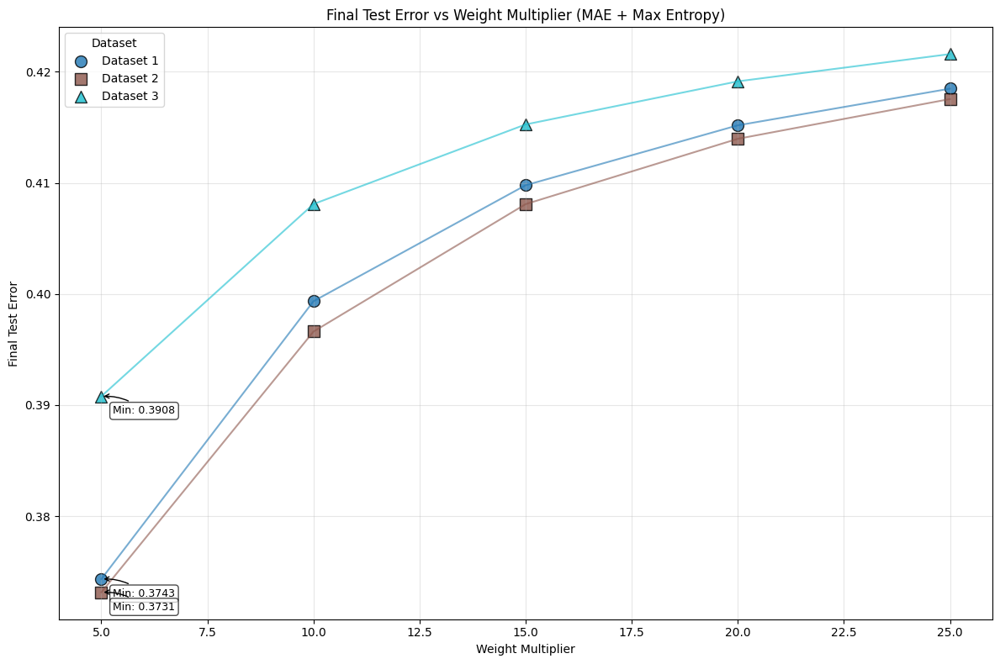

In [54]:

# Plot for MAE + Max Entropy results with parameter sweep
fig3 = plot_final_test_error_vs_param(
    mre_me_test_losses, 
    n_seeds, 
    n_replicates,
    param_values=param_values,
    title="Final Test Error vs Weight Multiplier (MAE + Max Entropy)",
    param_name="Weight Multiplier"
)
plt.show()


In [ ]:

# You can also create a combined plot for all three methods:
def plot_combined_final_errors(test_losses_dict, n_seeds, n_replicates, param_values=None, 
                              method_names=None, title="Comparison of Final Test Errors"):
    """
    Creates a combined plot of final test errors for multiple optimization methods.
    
    Parameters:
    -----------
    test_losses_dict : dict
        Dictionary of test losses dictionaries for each method
    n_seeds : int
        Number of seeds (datasets)
    n_replicates : int
        Number of replicates per seed
    param_values : list, optional
        List of parameter values corresponding to each replicate.
        If None, uses replicate index as x-axis.
    method_names : list, optional
        List of method names for the legend
    title : str, optional
        Plot title
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The plot figure
    """
    import numpy as np
    import matplotlib.pyplot as plt
    
    # Create figure
    plt.figure(figsize=(14, 10))
    
    # If param_values not provided, use replicate indices
    if param_values is None:
        param_values = list(range(1, n_replicates + 1))
    
    # If method_names not provided, use default names
    if method_names is None:
        method_names = [f"Method {i+1}" for i in range(len(test_losses_dict))]
    
    # Define colors and markers for methods and seeds
    method_colors = plt.cm.viridis(np.linspace(0, 1, len(test_losses_dict)))
    seed_markers = ['o', 's', '^', 'D', 'v', 'p', '*', 'h', 'x', '+']
    
    # Track min and max for y-axis scaling
    min_error = float('inf')
    max_error = 0
    
    # Plot the data for each method and seed
    for method_idx, (method_name, test_losses) in enumerate(zip(method_names, test_losses_dict.values())):
        method_color = method_colors[method_idx]
        
        for seed_idx in range(n_seeds):
            seed_key = f'seed_{seed_idx}'
            marker = seed_markers[seed_idx % len(seed_markers)]
            
            # Extract final errors for this seed and method
            final_errors = []
            for rep_idx in range(n_replicates):
                if seed_key in test_losses and rep_idx < len(test_losses[seed_key]) and test_losses[seed_key][rep_idx] is not None:
                    # Get the final test loss for this replicate
                    final_error = test_losses[seed_key][rep_idx][-1]
                    final_errors.append(final_error)
                    
                    # Update min and max for y-axis scaling
                    min_error = min(min_error, final_error)
                    max_error = max(max_error, final_error)
                else:
                    # Handle missing data
                    final_errors.append(np.nan)
            
            # Create scatter plot for this dataset and method
            label = f"{method_name}, Dataset {seed_idx+1}" if method_idx == 0 else None
            scatter = plt.scatter(
                param_values[:len(final_errors)], 
                final_errors,
                color=method_color,
                marker=marker,
                s=80,
                alpha=0.8,
                edgecolors='black',
                label=label
            )
            
            # Add connecting lines
            line_style = ['-', '--', '-.', ':'][method_idx % 4]
            plt.plot(
                param_values[:len(final_errors)], 
                final_errors,
                color=method_color,
                alpha=0.6,
                linestyle=line_style
            )
    
    # Create custom legend for methods and seeds
    from matplotlib.lines import Line2D
    
    # Create legend handles for methods
    method_handles = [Line2D([0], [0], color=method_colors[i], lw=2, label=name) 
                    for i, name in enumerate(method_names)]
    
    # Create legend handles for seeds
    seed_handles = [Line2D([0], [0], marker=seed_markers[i], color='gray', 
                          linestyle='None', markersize=8, label=f"Dataset {i+1}") 
                    for i in range(n_seeds)]
    
    # Add legends
    method_legend = plt.legend(handles=method_handles, title="Method", loc='upper left')
    plt.gca().add_artist(method_legend)
    plt.legend(handles=seed_handles, title="Dataset", loc='upper right')
    
    # Customize the plot
    plt.xlabel("Parameter Value / Replicate")
    plt.ylabel("Final Test Error")
    plt.title(title)
    plt.grid(True, alpha=0.3)
    
    # Add 5% padding to y-axis
    y_range = max_error - min_error
    plt.ylim(min_error - 0.05 * y_range, max_error + 0.05 * y_range)
    
    plt.tight_layout()
    
    return plt.gcf()

# Example usage of the combined plot
test_losses_dict = {
    "L2 Loss": test_losses,
    "Max Entropy": me_test_losses,
    "MAE + Max Entropy": mre_me_test_losses
}


NameError: name 'test_losses' is not defined

In [ ]:

method_names = ["L2 Loss", "Max Entropy", "MAE + Max Entropy"]

combined_fig = plot_combined_final_errors(
    test_losses_dict,
    n_seeds,
    n_replicates,
    param_values=list(range(1, n_replicates + 1)),
    method_names=method_names,
    title="Comparison of Final Test Errors Across Methods"
)
plt.show()